In [1]:
!pip install tabpfn --no-index --find-links=file:///kaggle/input/pypi-iarc-packages/
!mkdir -p /opt/conda/lib/python3.10/site-packages/tabpfn/models_diff
!cp -r /kaggle/input/pypi-iarc-packages/prior_diff_real_checkpoint_n_0_epoch_100.cpkt/prior_diff_real_checkpoint_n_0_epoch_100.cpkt /opt/conda/lib/python3.10/site-packages/tabpfn/models_diff/

Looking in links: file:///kaggle/input/pypi-iarc-packages/
Processing /kaggle/input/pypi-iarc-packages/tabpfn-0.1.9-py3-none-any.whl


In [2]:
import numpy as np
import pandas as pd
import joblib
import optuna
from functools import partial

import xgboost as xgb
import lightgbm as lgb

# custom modules
from preproc import load_data,scale_data
#from calibration1 import (
#    calibrate_probs as calibrate_probs1,
#    optimize_calibration as optimize_calibration1
#)
from calibration2 import calibrate_probs,optimize_calibration

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
def balanced_logloss_(y_pred, y_true, eps=1e-7):
    n0 = np.sum(1-y_true)
    n1 = np.sum(y_true)
    p1 = np.clip(y_pred, eps, 1-eps)
    p0 = 1-p1
    log_loss0 = - np.sum((1-y_true) * np.log(p0)) / (n0+eps)
    log_loss1 = - np.sum(y_true * np.log(p1)) / (n1+eps)
    return (log_loss0 + log_loss1)/2


def compute_overall_metric(oof_dfs:list) -> float:
    all_metrics = [
        balanced_logloss_(oof.pred_proba.values, oof.Class.values)
        for oof in oof_dfs
    ]
    return np.mean(all_metrics)


def calibrate_oof(oof_dfs, calib_params):
    oof_dfs_calibrated = list()
    
    for oof in oof_dfs:
        oof = oof.copy(deep=True)
        calib_p1 = calibrate_probs(
            oof.pred_proba.values,
            **calib_params
        )
        oof["pred_proba"] = calib_p1
        oof_dfs_calibrated.append(oof)
        
    return oof_dfs_calibrated

In [4]:
# notebook parameter

CALIBRATE_FIRST = True

***
# load data and predictions

### 1. `lgbm-gbrt`

In [5]:
models_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/models.pkl")
calib_params_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/calib_params.pkl")
oof_dfs_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/oof_dataframes.pkl")

In [6]:
compute_overall_metric(oof_dfs_m01)

0.24033928714260183

In [7]:
oof_dfs_calib_m01 = calibrate_oof(oof_dfs_m01, calib_params_m01)
compute_overall_metric(oof_dfs_calib_m01)

0.22139398049564257

In [8]:
%%time
train,test,input_cols = load_data()

predicted_probs = [
    model.predict(test[input_cols]) 
    for model in models_m01
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m01)
predicted_probs_m01 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 208 ms, sys: 8.41 ms, total: 217 ms
Wall time: 190 ms


### 2. `lgbm-linear`

In [9]:
models_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/models.pkl")
calib_params_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/calib_params.pkl")
oof_dfs_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/oof_dataframes.pkl")

In [10]:
compute_overall_metric(oof_dfs_m02)

0.23776284612591142

In [11]:
oof_dfs_calib_m02 = calibrate_oof(oof_dfs_m02, calib_params_m02)
compute_overall_metric(oof_dfs_calib_m02)

0.21870748528950434

In [12]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(test[input_cols])
    for model in models_m02
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m02)
predicted_probs_m02 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 229 ms, sys: 5.32 ms, total: 234 ms
Wall time: 179 ms


### 3. `catboost`

In [13]:
models_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/models.pkl")
calib_params_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/calib_params.pkl")
oof_dfs_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/oof_dataframes.pkl")

In [14]:
compute_overall_metric(oof_dfs_m03)

0.2633244023340282

In [15]:
oof_dfs_calib_m03 = calibrate_oof(oof_dfs_m03, calib_params_m03)
compute_overall_metric(oof_dfs_calib_m03)

0.22835158860669114

In [16]:
%%time
train,test,input_cols = load_data()

predicted_probs = [
    model.predict(test[input_cols], prediction_type="Probability")[:,1]
    for model in models_m03
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m03)
predicted_probs_m03 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 358 ms, sys: 43.6 ms, total: 401 ms
Wall time: 383 ms


### 4. `tabpfn`

In [17]:
models_m04 = joblib.load("/kaggle/input/iarc-tabpfn/models.pkl")
calib_params_m04 = joblib.load("/kaggle/input/iarc-tabpfn/calib_params.pkl")
oof_dfs_m04 = joblib.load("/kaggle/input/iarc-tabpfn/oof_dataframes.pkl")

In [18]:
compute_overall_metric(oof_dfs_m04)

0.3900050155836857

In [19]:
oof_dfs_calib_m04 = calibrate_oof(oof_dfs_m04, calib_params_m04)
compute_overall_metric(oof_dfs_calib_m04)

0.28839025101520327

In [20]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols, impute_only=True)

predicted_probs = [
    model.predict_proba(test[input_cols])[:,1] 
    for model in models_m04
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m04)
predicted_probs_m04 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 2min 43s, sys: 792 ms, total: 2min 43s
Wall time: 1min 36s


### 5. `multiout-mlp`

In [21]:
models_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/models.pkl")
calib_params_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/calib_params.pkl")
oof_dfs_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/oof_dataframes.pkl")

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [22]:
compute_overall_metric(oof_dfs_m05)

0.30563847176445524

In [23]:
oof_dfs_calib_m05 = calibrate_oof(oof_dfs_m05, calib_params_m05)
compute_overall_metric(oof_dfs_calib_m05)

0.2904142458122567

In [24]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(test[input_cols].values, verbose=0)[0][:,1:].sum(axis=1)
    for model in models_m05
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m05)
predicted_probs_m05 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 7.66 s, sys: 68.8 ms, total: 7.73 s
Wall time: 7.86 s


### 6. `xgb-gblinear`

In [25]:
models_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/models.pkl")
calib_params_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/calib_params.pkl")
oof_dfs_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/oof_dataframes.pkl")

[20:07:23] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[20:07:23] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[20:07:23] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, pl

In [26]:
compute_overall_metric(oof_dfs_m06)

0.37894304572238047

In [27]:
oof_dfs_calib_m06 = calibrate_oof(oof_dfs_m06, calib_params_m06)
compute_overall_metric(oof_dfs_calib_m06)

0.36502436920847003

In [28]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(xgb.DMatrix(test[input_cols]))
    for model in models_m06
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m06)
predicted_probs_m06 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 311 ms, sys: 990 µs, total: 312 ms
Wall time: 333 ms


### 7. xgb-gbtree

In [29]:
models_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/models.pkl")
calib_params_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/calib_params.pkl")
oof_dfs_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/oof_dataframes.pkl")

[20:07:24] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[20:07:24] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[20:07:24] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, pl

In [30]:
compute_overall_metric(oof_dfs_m07)

0.27239995042577647

In [31]:
oof_dfs_calib_m07 = calibrate_oof(oof_dfs_m07, calib_params_m07)
compute_overall_metric(oof_dfs_calib_m07)

0.22564184381208174

In [32]:
%%time
train,test,ianput_cols = load_data()

predicted_probs = [
    model.predict(xgb.DMatrix(test[input_cols]))
    for model in models_m07
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m07)
predicted_probs_m07 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 305 ms, sys: 9.89 ms, total: 315 ms
Wall time: 315 ms


***
# stacking model training

In [33]:
# models to consider

if not CALIBRATE_FIRST:
    print("using non calibrated")
    oof_all = [
        oof_dfs_m01,
        oof_dfs_m02,
        oof_dfs_m03,
        oof_dfs_m04,
        oof_dfs_m05,
        oof_dfs_m06,
        oof_dfs_m07,
    ]
else:
    print("using calibrated")
    oof_all = [
        oof_dfs_calib_m01,
        oof_dfs_calib_m02,
        oof_dfs_calib_m03,
        oof_dfs_calib_m04,
        oof_dfs_calib_m05,
        oof_dfs_calib_m06,
        oof_dfs_calib_m07,
    ]

for _oof_dfs in oof_all:
    print(compute_overall_metric(_oof_dfs))

using calibrated
0.22139398049564257
0.21870748528950434
0.22835158860669114
0.28839025101520327
0.2904142458122567
0.36502436920847003
0.22564184381208174


In [34]:
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

In [35]:
repeated_cv_split = joblib.load("/kaggle/input/iarc-data-split/repeated_5fold_cv_split_4validation.pkl")
print(len(repeated_cv_split))

# number of repetitions to use
REPETITIONS = 10

10


In [36]:
pct = train.Class.value_counts(normalize=True)
scale_pos_weight = pct[0]/pct[1]
print("scale_pos_weight:", scale_pos_weight)

cnt = train.Class.value_counts(normalize=False)
neg_bagging_fraction = cnt[1]/cnt[0]
print("neg_bagging_fraction:", neg_bagging_fraction)

scale_pos_weight: 4.712962962962963
neg_bagging_fraction: 0.21218074656188604


In [37]:
model_params = {
    'objective': 'binary',
    'metric': 'None',
    'learning_rate': 0.005,
    'bagging_freq': 1,
    'seed': 2112,
    'first_metric_only': False,
    'feature_pre_filter': False,
    'verbosity': -1,
    'linear_tree': True,

    'pos_bagging_fraction': 1,
    'neg_bagging_fraction': 0.21218074656188604,
    'feature_fraction': 0.2,
    'lambda_l1': 9.680846523945732e-08,
    'lambda_l2': 74.9291423174379,
    'linear_lambda': 2.7495784244870075e-07,
    'min_data_in_leaf': 47,
    'min_gain_to_split': 1.618626990154026e-10,
    'num_iterations': 1450,
    'path_smooth': 5.916928003551623e-09,
    'max_bin': 7,
    'num_leaves': 7
}


In [38]:
def include_oof_preds(train, input_cols, oof_all, repeat_nbr):
    train = train.copy()
    input_cols = input_cols.tolist().copy()
    n_models = len(oof_all)
    
    for i in range(n_models):
        _oof = oof_all[i][repeat_nbr][["Id","pred_proba"]].rename({"pred_proba":f"pm{i+1}"}, axis=1)
        train = pd.merge(train, _oof)
        input_cols.append(f"pm{i+1}")
        
    return train,input_cols

In [39]:
def balanced_logloss(y_pred: np.ndarray, data: lgb.Dataset):
    y_true = data.get_label()
    return 'balanced_logloss', balanced_logloss_(y_pred, y_true), False 

import matplotlib.pyplot as plt

REPEAT NUMBER: 1/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.576407


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.441202
[300]	valid_0's balanced_logloss: 0.372226
[400]	valid_0's balanced_logloss: 0.333042
[500]	valid_0's balanced_logloss: 0.310848
[600]	valid_0's balanced_logloss: 0.300558
[700]	valid_0's balanced_logloss: 0.293886
[800]	valid_0's balanced_logloss: 0.289168
[900]	valid_0's balanced_logloss: 0.28737
[1000]	valid_0's balanced_logloss: 0.287545
[1100]	valid_0's balanced_logloss: 0.289915
[1200]	valid_0's balanced_logloss: 0.292978
[1300]	valid_0's balanced_logloss: 0.301079
[1400]	valid_0's balanced_logloss: 0.304353


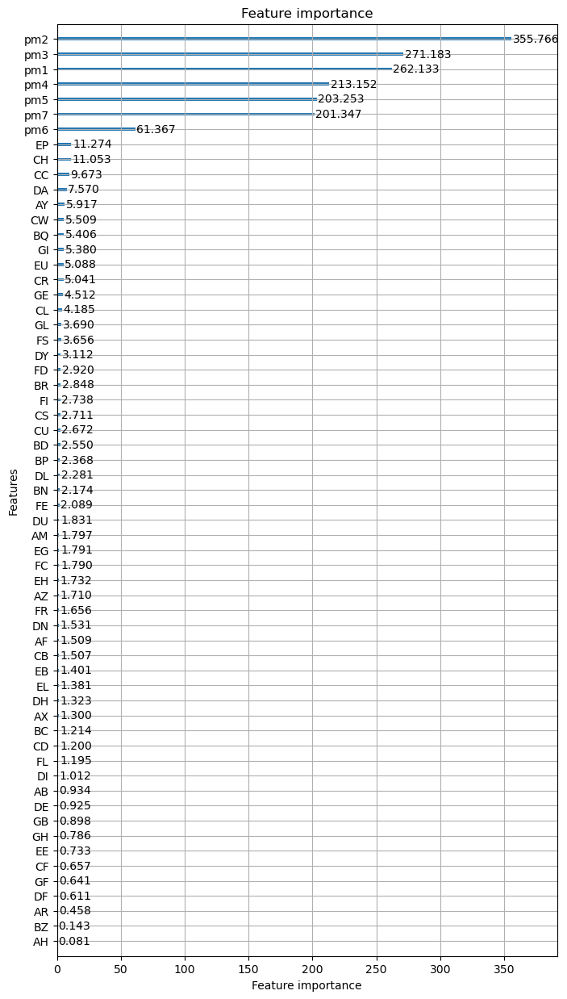

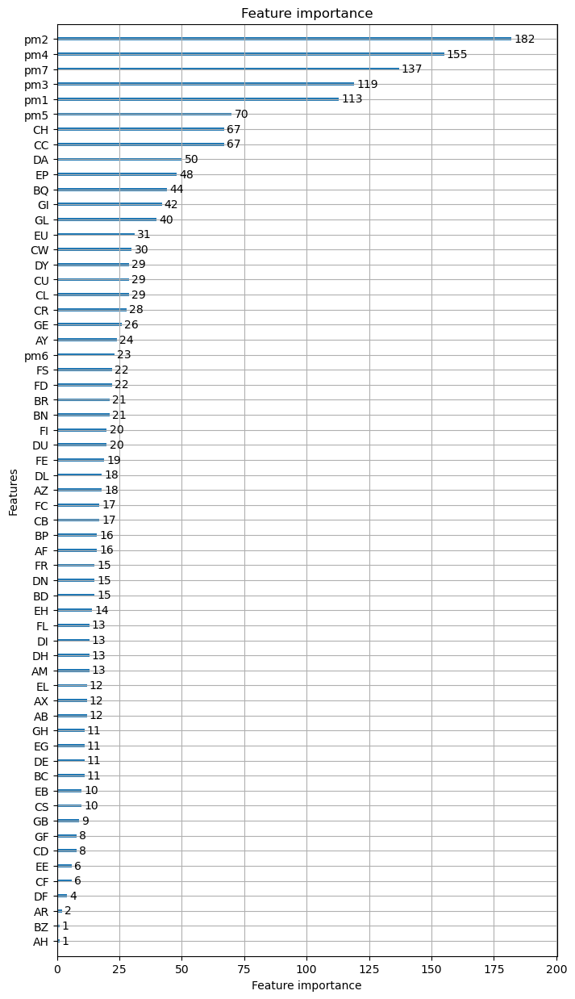

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.545129


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.398964
[300]	valid_0's balanced_logloss: 0.330775
[400]	valid_0's balanced_logloss: 0.294471
[500]	valid_0's balanced_logloss: 0.278264
[600]	valid_0's balanced_logloss: 0.269875
[700]	valid_0's balanced_logloss: 0.268592
[800]	valid_0's balanced_logloss: 0.269044
[900]	valid_0's balanced_logloss: 0.269283
[1000]	valid_0's balanced_logloss: 0.268711
[1100]	valid_0's balanced_logloss: 0.270283
[1200]	valid_0's balanced_logloss: 0.270388
[1300]	valid_0's balanced_logloss: 0.274055
[1400]	valid_0's balanced_logloss: 0.274822


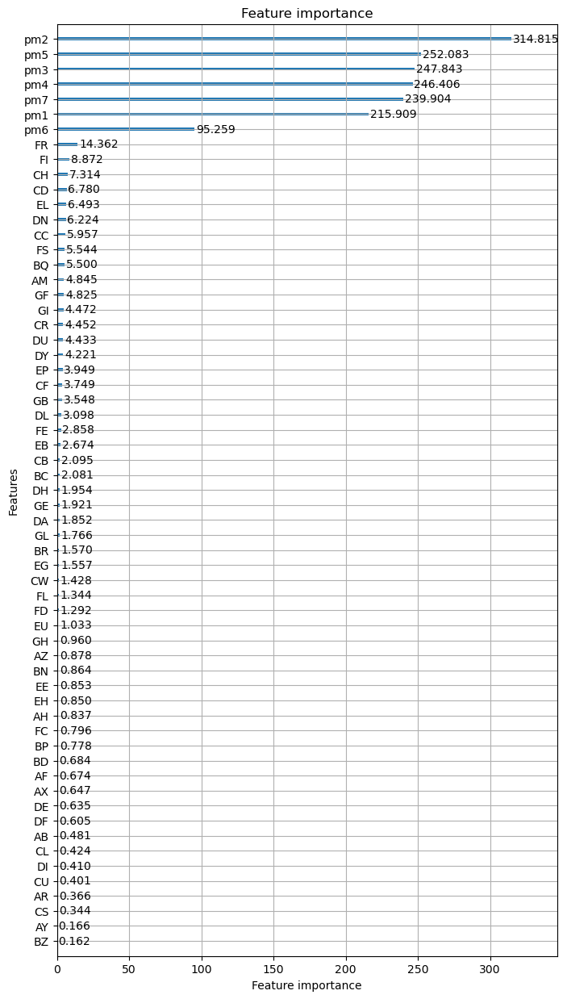

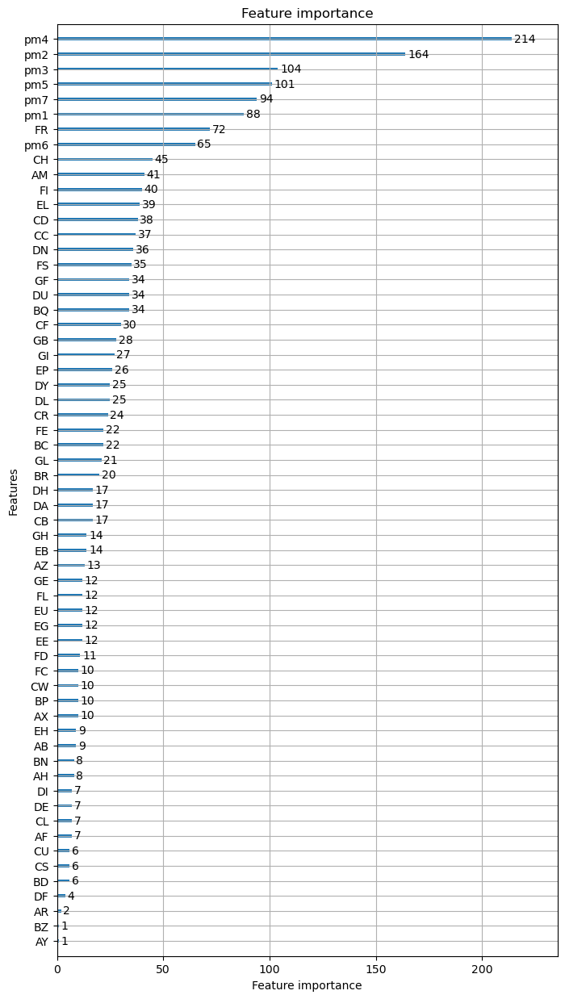

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.535119


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.38033
[300]	valid_0's balanced_logloss: 0.294512
[400]	valid_0's balanced_logloss: 0.240867
[500]	valid_0's balanced_logloss: 0.205378
[600]	valid_0's balanced_logloss: 0.181589
[700]	valid_0's balanced_logloss: 0.165125
[800]	valid_0's balanced_logloss: 0.154442
[900]	valid_0's balanced_logloss: 0.149521
[1000]	valid_0's balanced_logloss: 0.143535
[1100]	valid_0's balanced_logloss: 0.140323
[1200]	valid_0's balanced_logloss: 0.138279
[1300]	valid_0's balanced_logloss: 0.13728
[1400]	valid_0's balanced_logloss: 0.135502


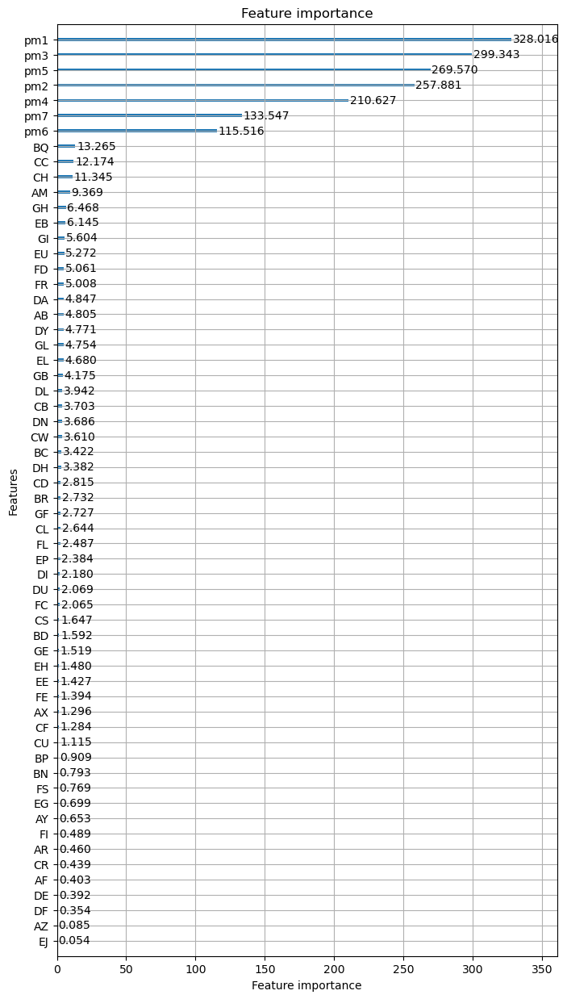

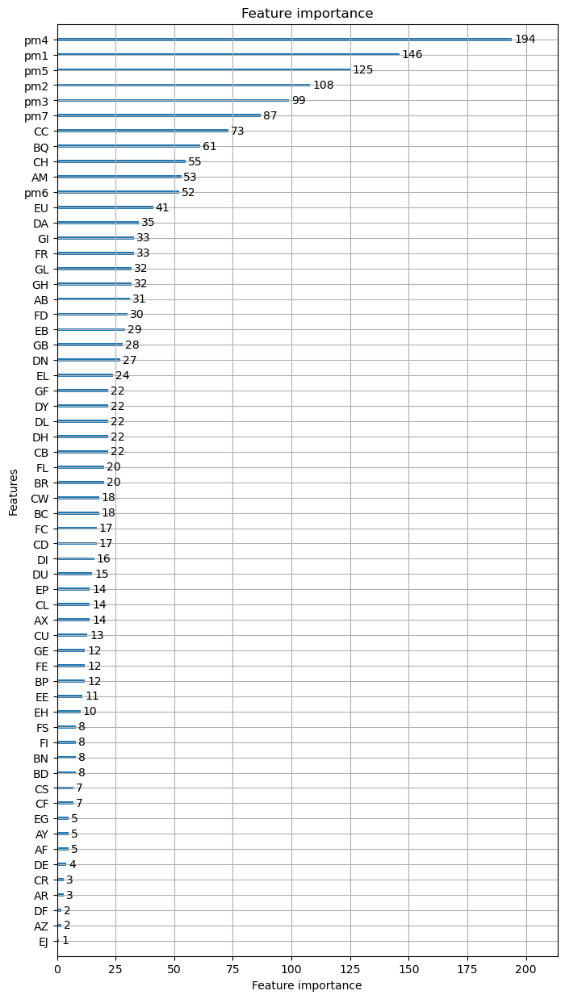

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.528568


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.37154
[300]	valid_0's balanced_logloss: 0.288571
[400]	valid_0's balanced_logloss: 0.23378
[500]	valid_0's balanced_logloss: 0.203354
[600]	valid_0's balanced_logloss: 0.185439
[700]	valid_0's balanced_logloss: 0.174421
[800]	valid_0's balanced_logloss: 0.165902
[900]	valid_0's balanced_logloss: 0.163
[1000]	valid_0's balanced_logloss: 0.160214
[1100]	valid_0's balanced_logloss: 0.157096
[1200]	valid_0's balanced_logloss: 0.155736
[1300]	valid_0's balanced_logloss: 0.154147
[1400]	valid_0's balanced_logloss: 0.152955


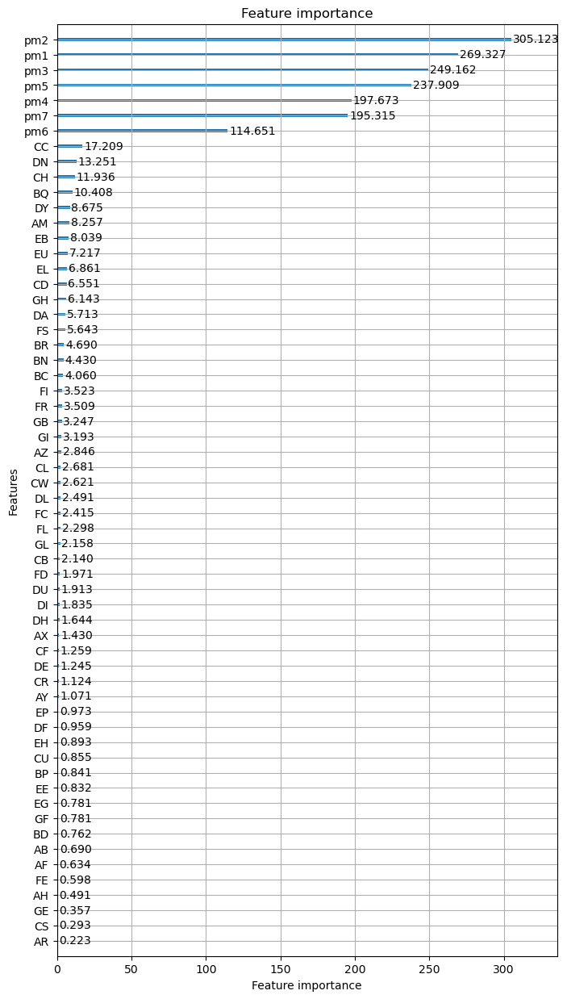

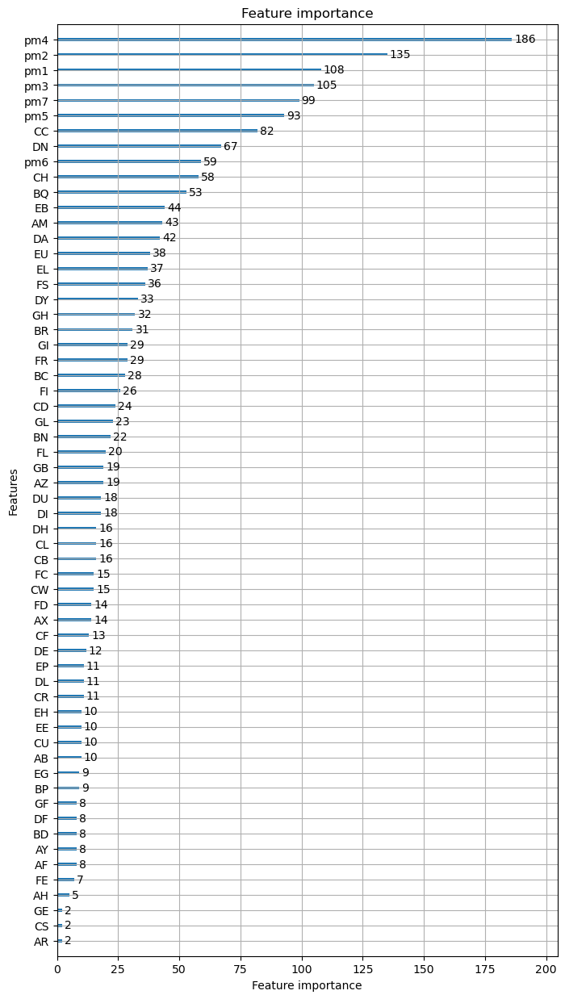

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.548583


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.396902
[300]	valid_0's balanced_logloss: 0.321705
[400]	valid_0's balanced_logloss: 0.282355
[500]	valid_0's balanced_logloss: 0.260859
[600]	valid_0's balanced_logloss: 0.249163
[700]	valid_0's balanced_logloss: 0.243776
[800]	valid_0's balanced_logloss: 0.24337
[900]	valid_0's balanced_logloss: 0.242583
[1000]	valid_0's balanced_logloss: 0.244011
[1100]	valid_0's balanced_logloss: 0.244364
[1200]	valid_0's balanced_logloss: 0.247086
[1300]	valid_0's balanced_logloss: 0.249089
[1400]	valid_0's balanced_logloss: 0.252413


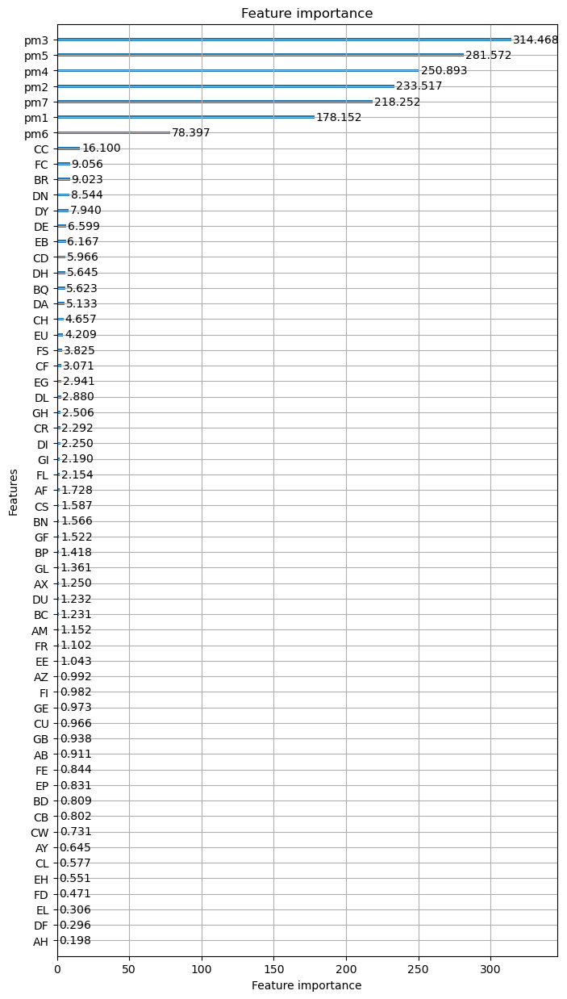

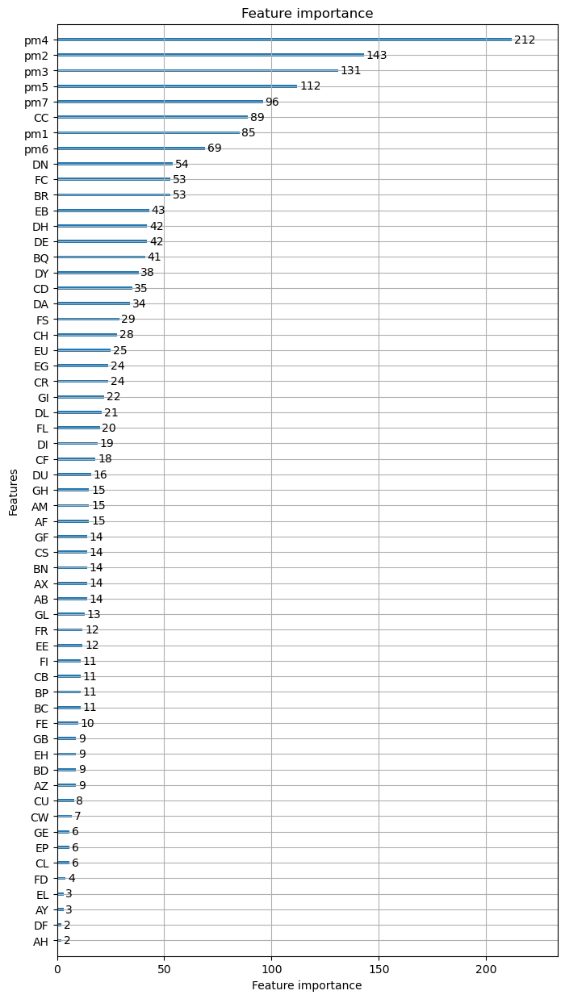

REPEAT NUMBER: 2/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.550967


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.393025
[300]	valid_0's balanced_logloss: 0.312365
[400]	valid_0's balanced_logloss: 0.262599
[500]	valid_0's balanced_logloss: 0.235827
[600]	valid_0's balanced_logloss: 0.22021
[700]	valid_0's balanced_logloss: 0.210277
[800]	valid_0's balanced_logloss: 0.205735
[900]	valid_0's balanced_logloss: 0.201342
[1000]	valid_0's balanced_logloss: 0.200119
[1100]	valid_0's balanced_logloss: 0.200541
[1200]	valid_0's balanced_logloss: 0.199758
[1300]	valid_0's balanced_logloss: 0.201183
[1400]	valid_0's balanced_logloss: 0.201019


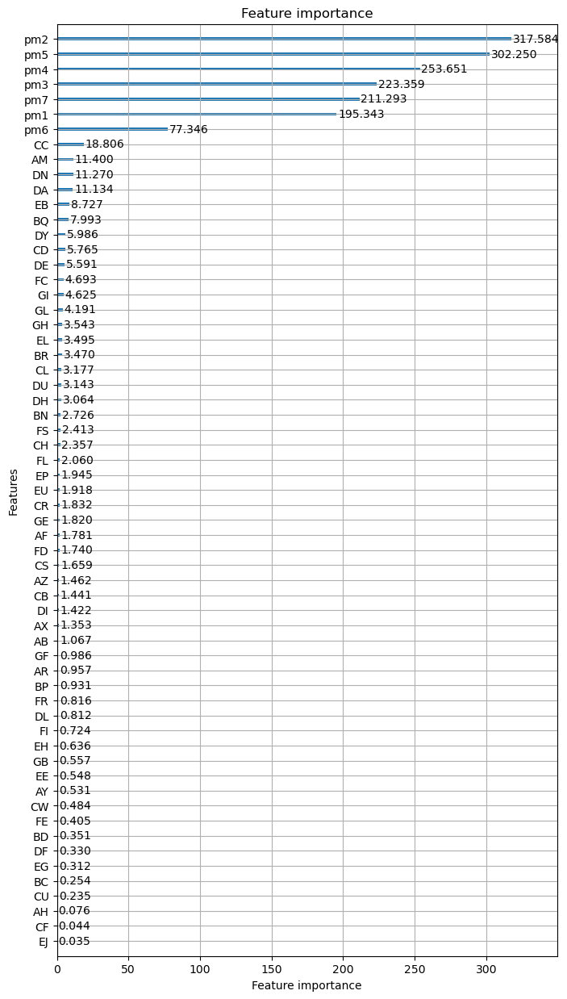

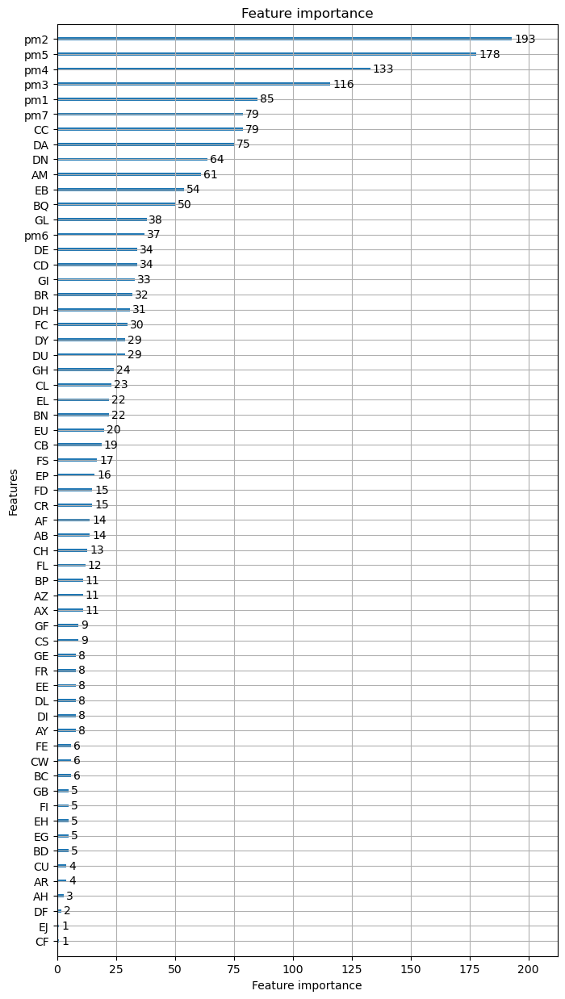

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.543389


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.380857
[300]	valid_0's balanced_logloss: 0.289312
[400]	valid_0's balanced_logloss: 0.233679
[500]	valid_0's balanced_logloss: 0.203128
[600]	valid_0's balanced_logloss: 0.184991
[700]	valid_0's balanced_logloss: 0.171945
[800]	valid_0's balanced_logloss: 0.165496
[900]	valid_0's balanced_logloss: 0.160837
[1000]	valid_0's balanced_logloss: 0.158904
[1100]	valid_0's balanced_logloss: 0.156794
[1200]	valid_0's balanced_logloss: 0.15778
[1300]	valid_0's balanced_logloss: 0.155839
[1400]	valid_0's balanced_logloss: 0.156063


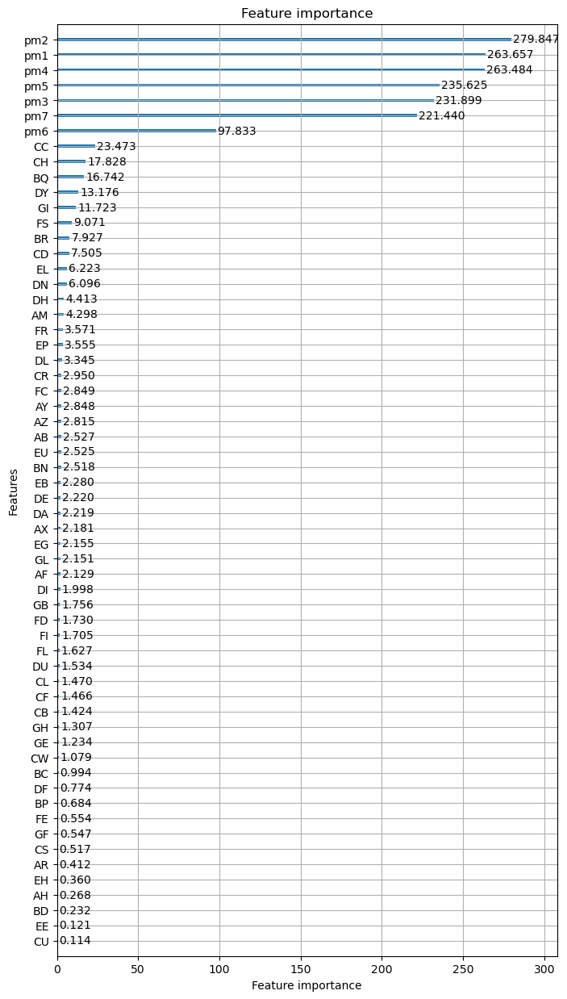

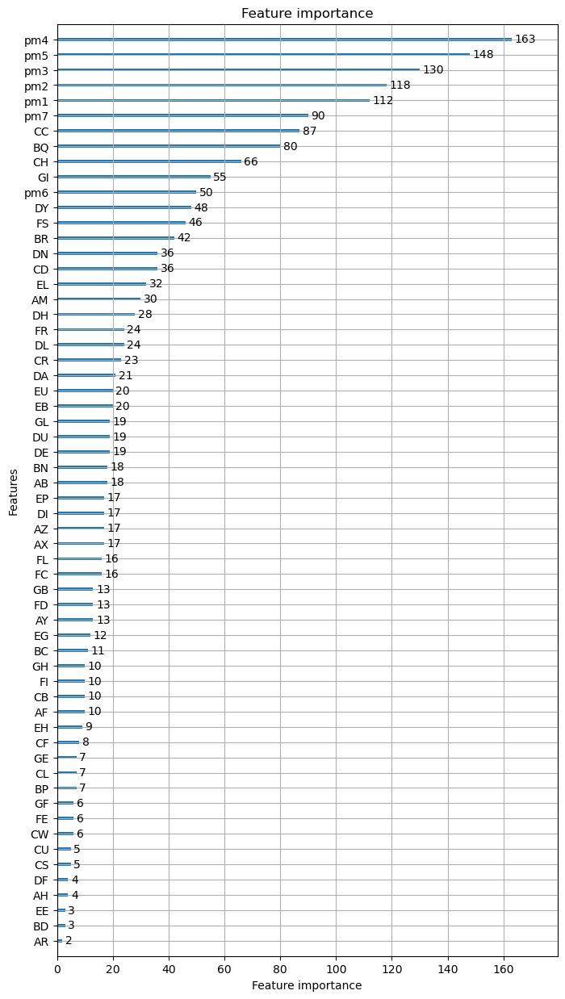

training model for fold: 3/5


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[100]	valid_0's balanced_logloss: 0.550877
[200]	valid_0's balanced_logloss: 0.402623
[300]	valid_0's balanced_logloss: 0.329737
[400]	valid_0's balanced_logloss: 0.28718
[500]	valid_0's balanced_logloss: 0.268981
[600]	valid_0's balanced_logloss: 0.259554
[700]	valid_0's balanced_logloss: 0.256183
[800]	valid_0's balanced_logloss: 0.253854
[900]	valid_0's balanced_logloss: 0.251467
[1000]	valid_0's balanced_logloss: 0.252385
[1100]	valid_0's balanced_logloss: 0.253081
[1200]	valid_0's balanced_logloss: 0.254785
[1300]	valid_0's balanced_logloss: 0.258449
[1400]	valid_0's balanced_logloss: 0.260393


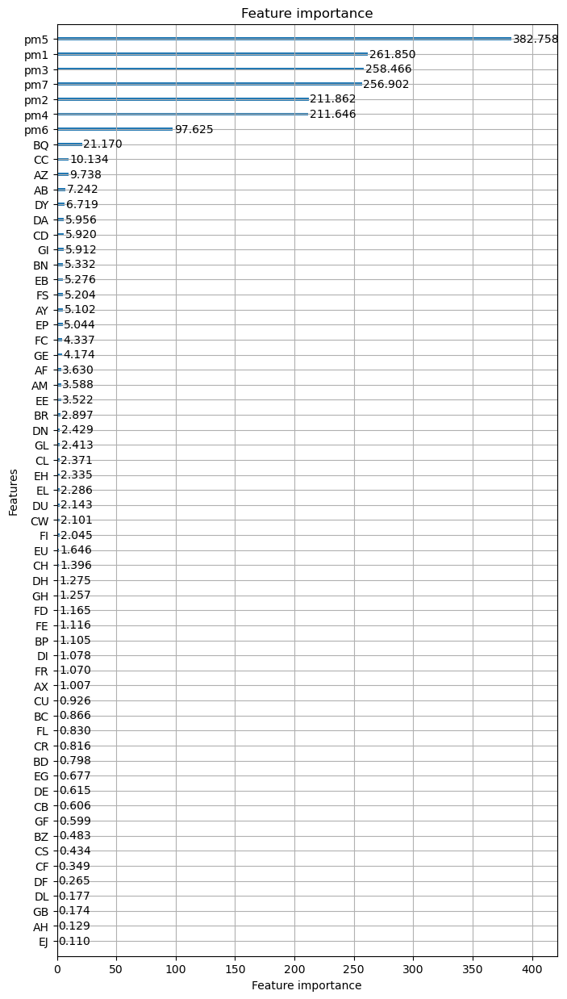

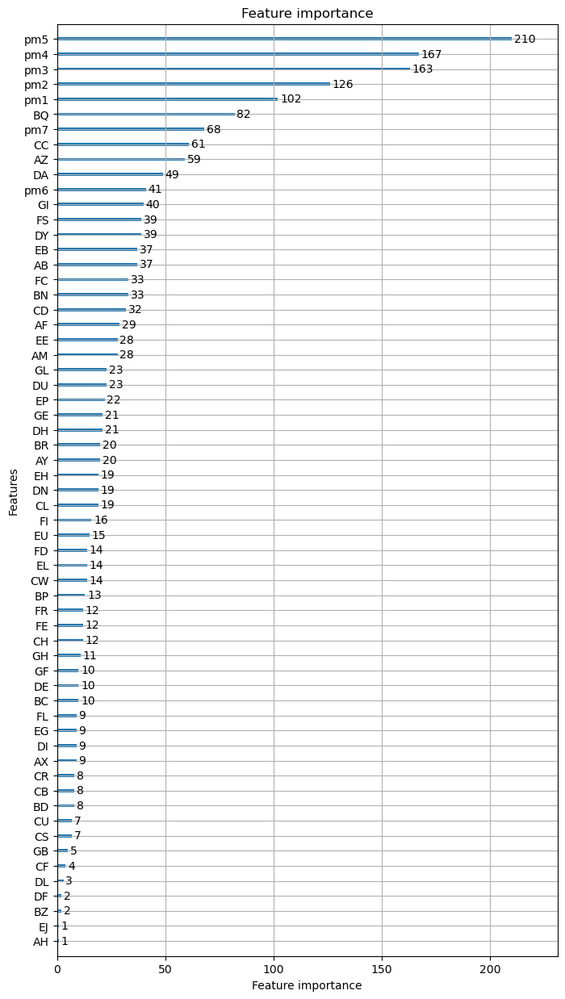

training model for fold: 4/5


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[100]	valid_0's balanced_logloss: 0.522984
[200]	valid_0's balanced_logloss: 0.355305
[300]	valid_0's balanced_logloss: 0.272432
[400]	valid_0's balanced_logloss: 0.224317
[500]	valid_0's balanced_logloss: 0.198161
[600]	valid_0's balanced_logloss: 0.183535
[700]	valid_0's balanced_logloss: 0.17613
[800]	valid_0's balanced_logloss: 0.173225
[900]	valid_0's balanced_logloss: 0.174302
[1000]	valid_0's balanced_logloss: 0.17383
[1100]	valid_0's balanced_logloss: 0.173973
[1200]	valid_0's balanced_logloss: 0.174579
[1300]	valid_0's balanced_logloss: 0.173446
[1400]	valid_0's balanced_logloss: 0.173373


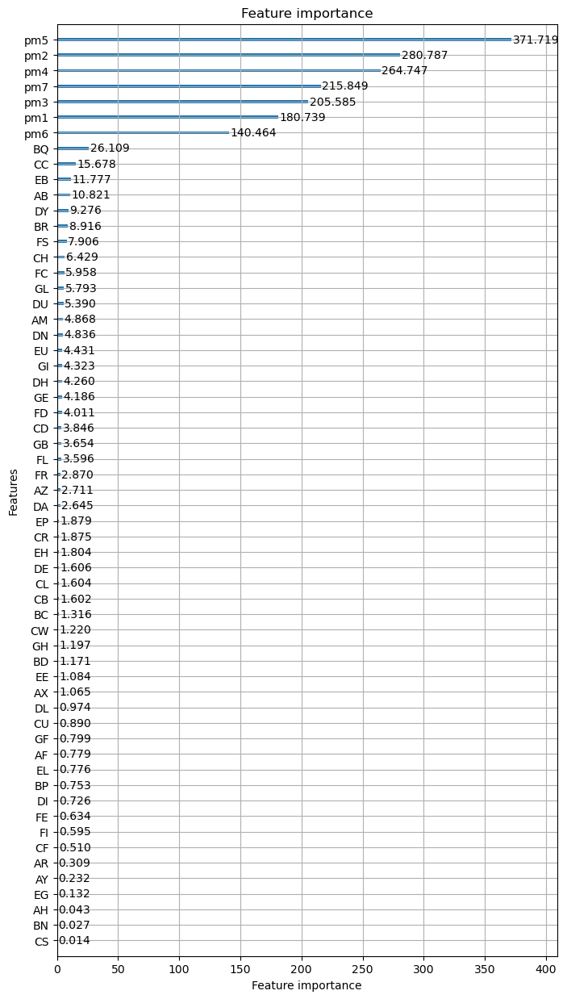

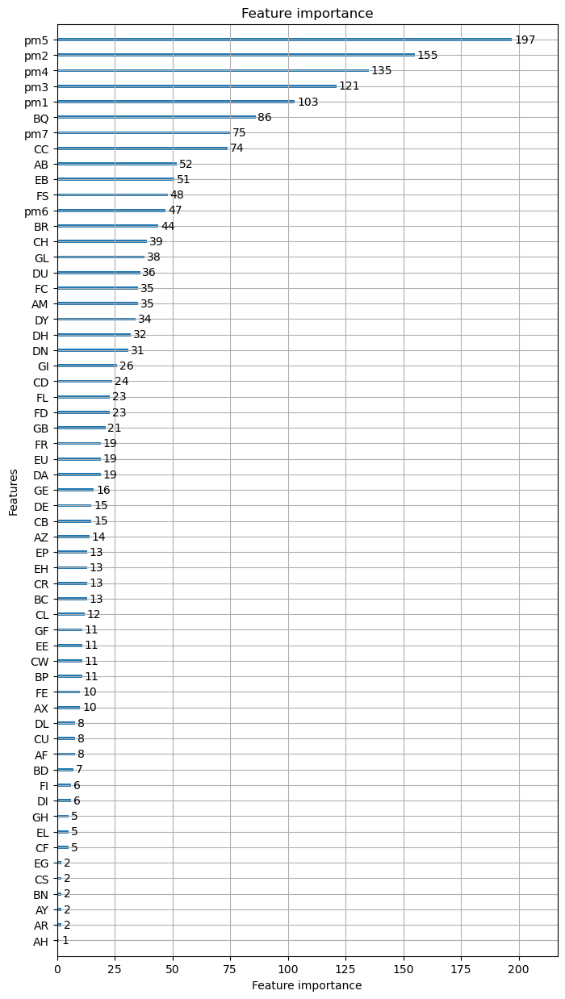

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.574903


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.438063
[300]	valid_0's balanced_logloss: 0.375417
[400]	valid_0's balanced_logloss: 0.343412
[500]	valid_0's balanced_logloss: 0.33028
[600]	valid_0's balanced_logloss: 0.32288
[700]	valid_0's balanced_logloss: 0.320727
[800]	valid_0's balanced_logloss: 0.320975
[900]	valid_0's balanced_logloss: 0.322177
[1000]	valid_0's balanced_logloss: 0.322651
[1100]	valid_0's balanced_logloss: 0.328289
[1200]	valid_0's balanced_logloss: 0.333234
[1300]	valid_0's balanced_logloss: 0.335582
[1400]	valid_0's balanced_logloss: 0.340711


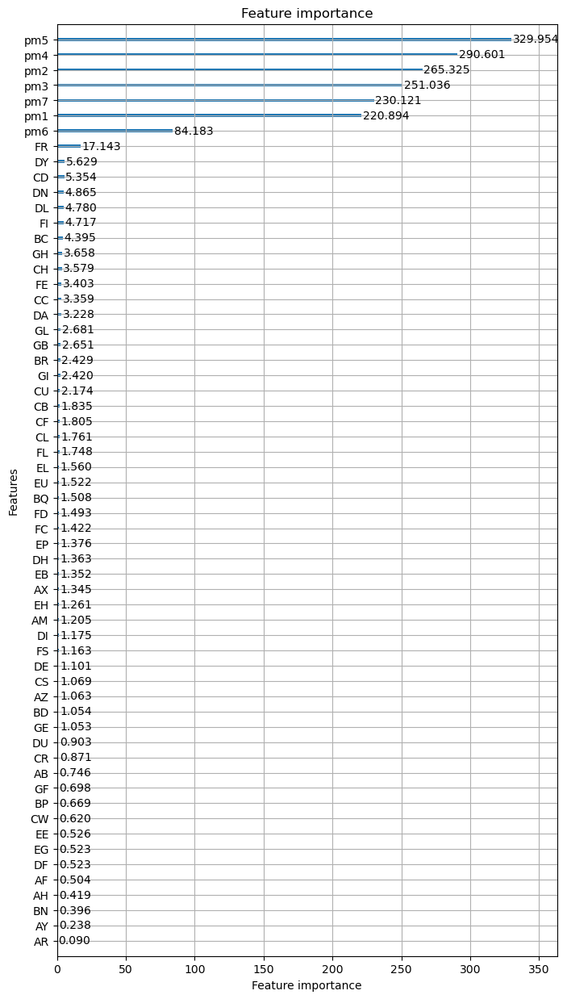

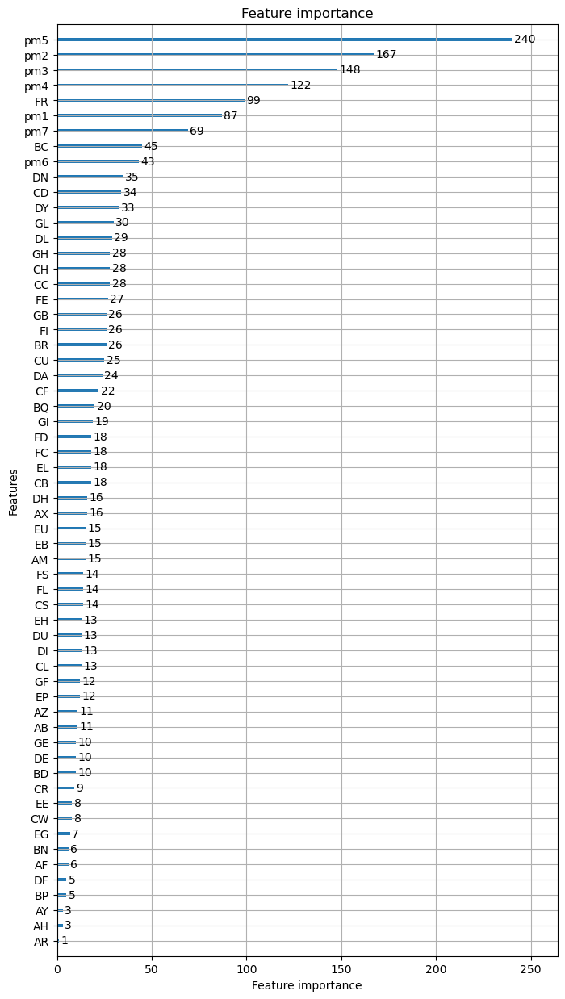

REPEAT NUMBER: 3/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.540285


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.382937
[300]	valid_0's balanced_logloss: 0.306278
[400]	valid_0's balanced_logloss: 0.263702
[500]	valid_0's balanced_logloss: 0.240493
[600]	valid_0's balanced_logloss: 0.226067
[700]	valid_0's balanced_logloss: 0.221389
[800]	valid_0's balanced_logloss: 0.217877
[900]	valid_0's balanced_logloss: 0.216148
[1000]	valid_0's balanced_logloss: 0.213749
[1100]	valid_0's balanced_logloss: 0.211404
[1200]	valid_0's balanced_logloss: 0.211158
[1300]	valid_0's balanced_logloss: 0.210728
[1400]	valid_0's balanced_logloss: 0.208735


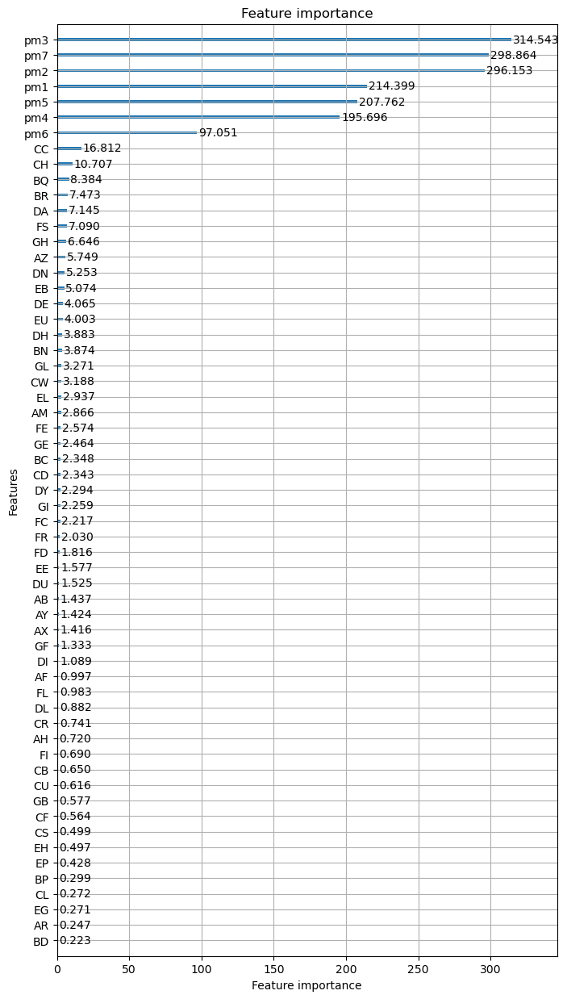

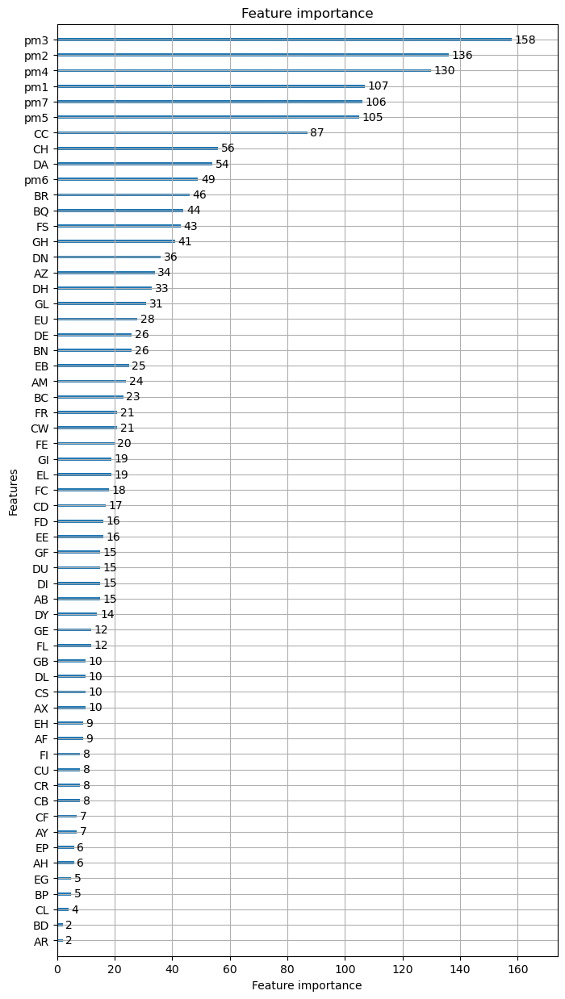

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.569545


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.420017
[300]	valid_0's balanced_logloss: 0.345033
[400]	valid_0's balanced_logloss: 0.301795
[500]	valid_0's balanced_logloss: 0.274577
[600]	valid_0's balanced_logloss: 0.259158
[700]	valid_0's balanced_logloss: 0.254514
[800]	valid_0's balanced_logloss: 0.252428
[900]	valid_0's balanced_logloss: 0.250483
[1000]	valid_0's balanced_logloss: 0.253921
[1100]	valid_0's balanced_logloss: 0.257647
[1200]	valid_0's balanced_logloss: 0.262043
[1300]	valid_0's balanced_logloss: 0.268298
[1400]	valid_0's balanced_logloss: 0.274189


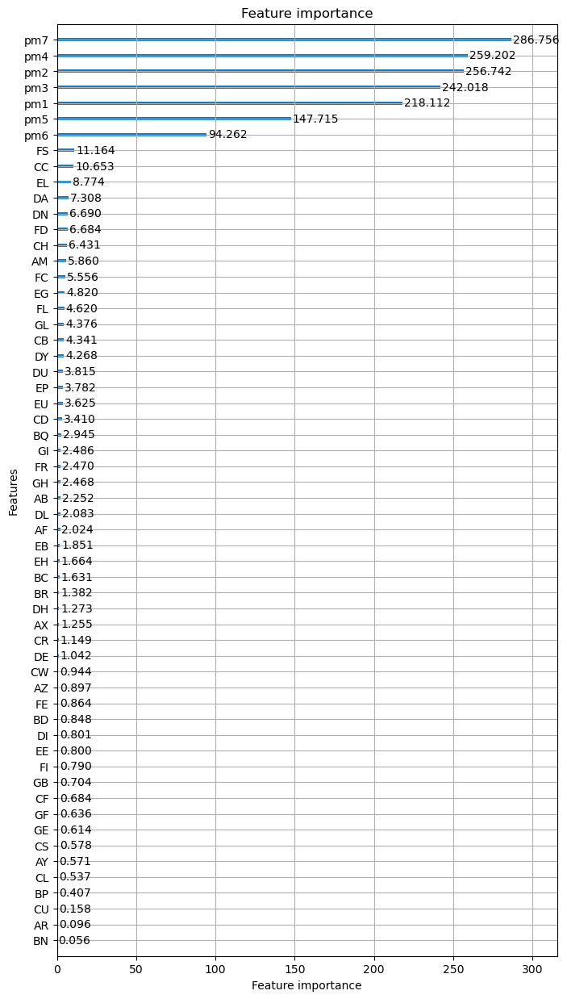

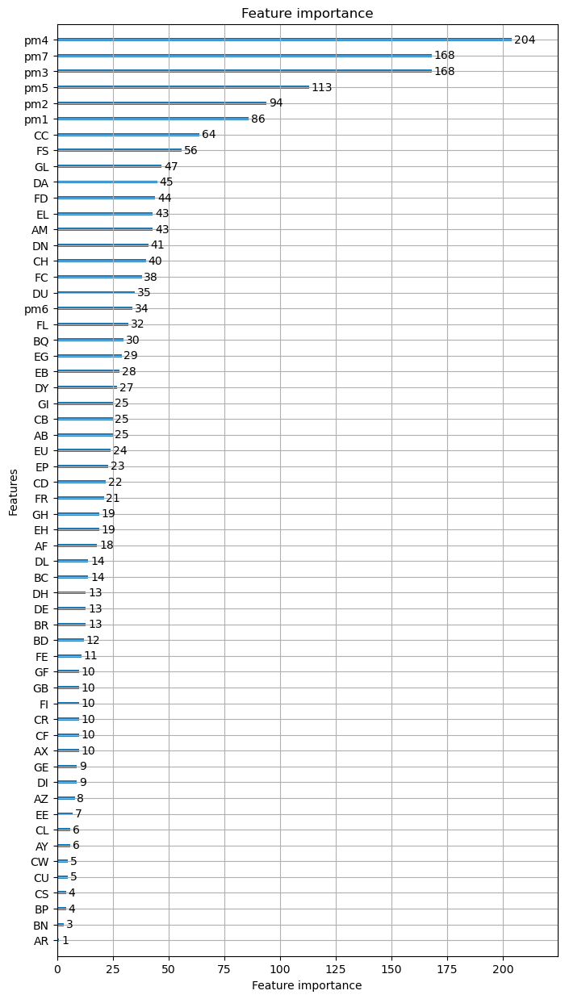

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.538612


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.387492
[300]	valid_0's balanced_logloss: 0.307079
[400]	valid_0's balanced_logloss: 0.258121
[500]	valid_0's balanced_logloss: 0.230014
[600]	valid_0's balanced_logloss: 0.209715
[700]	valid_0's balanced_logloss: 0.198151
[800]	valid_0's balanced_logloss: 0.191162
[900]	valid_0's balanced_logloss: 0.186291
[1000]	valid_0's balanced_logloss: 0.183583
[1100]	valid_0's balanced_logloss: 0.182171
[1200]	valid_0's balanced_logloss: 0.180188
[1300]	valid_0's balanced_logloss: 0.178178
[1400]	valid_0's balanced_logloss: 0.179178


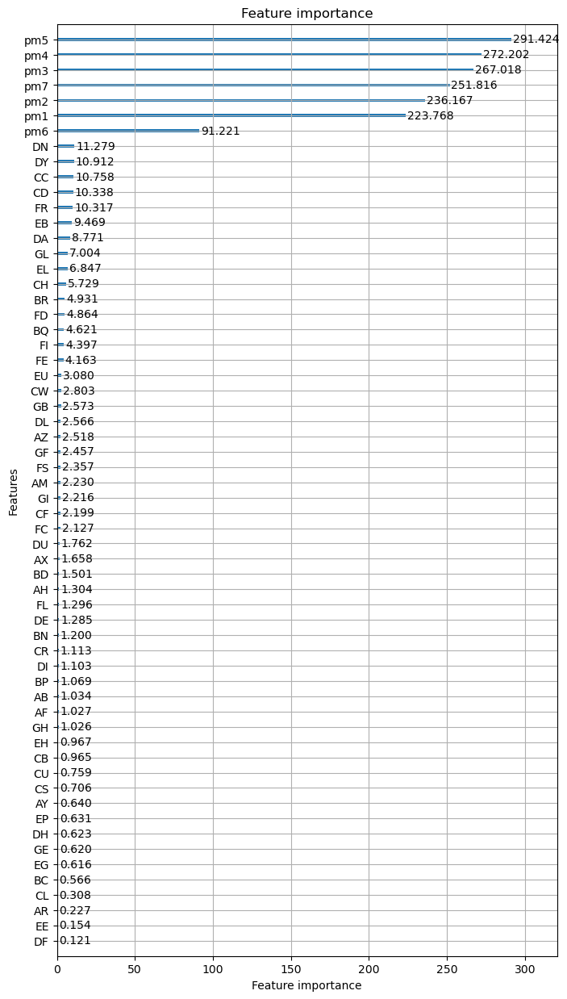

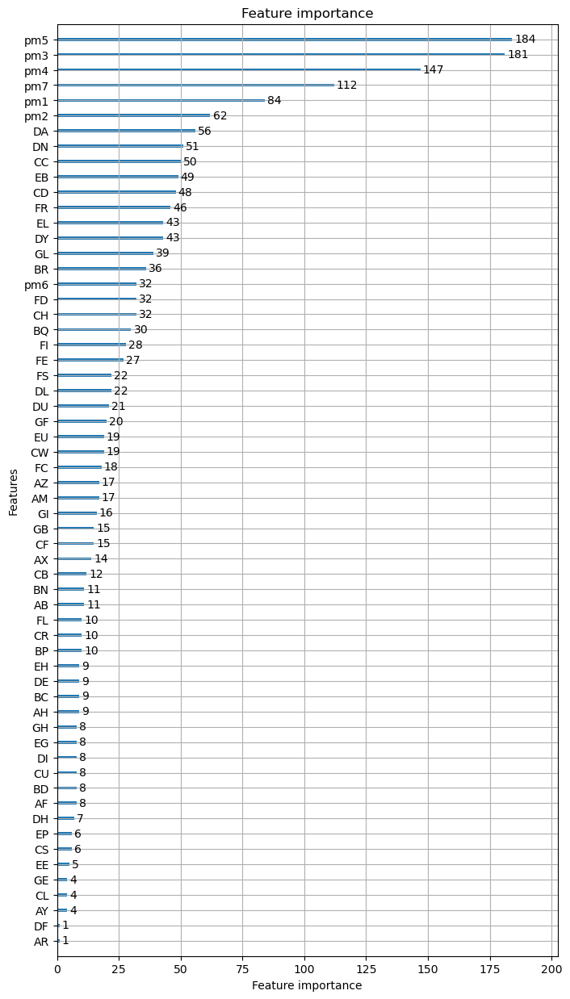

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.556828


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.405246
[300]	valid_0's balanced_logloss: 0.326701
[400]	valid_0's balanced_logloss: 0.273992
[500]	valid_0's balanced_logloss: 0.239495
[600]	valid_0's balanced_logloss: 0.213263
[700]	valid_0's balanced_logloss: 0.198692
[800]	valid_0's balanced_logloss: 0.187638
[900]	valid_0's balanced_logloss: 0.18026
[1000]	valid_0's balanced_logloss: 0.175338
[1100]	valid_0's balanced_logloss: 0.170875
[1200]	valid_0's balanced_logloss: 0.168128
[1300]	valid_0's balanced_logloss: 0.164941
[1400]	valid_0's balanced_logloss: 0.161276


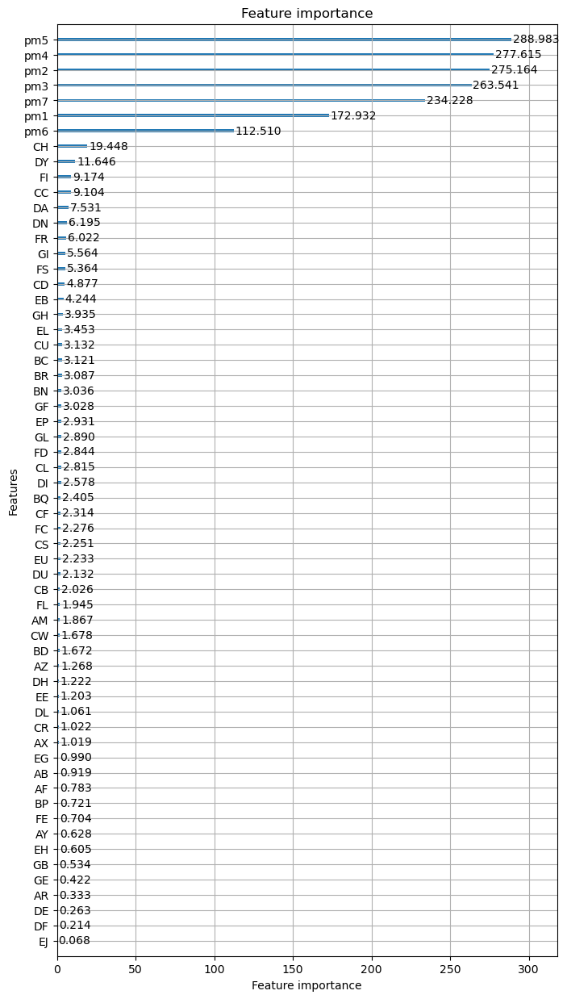

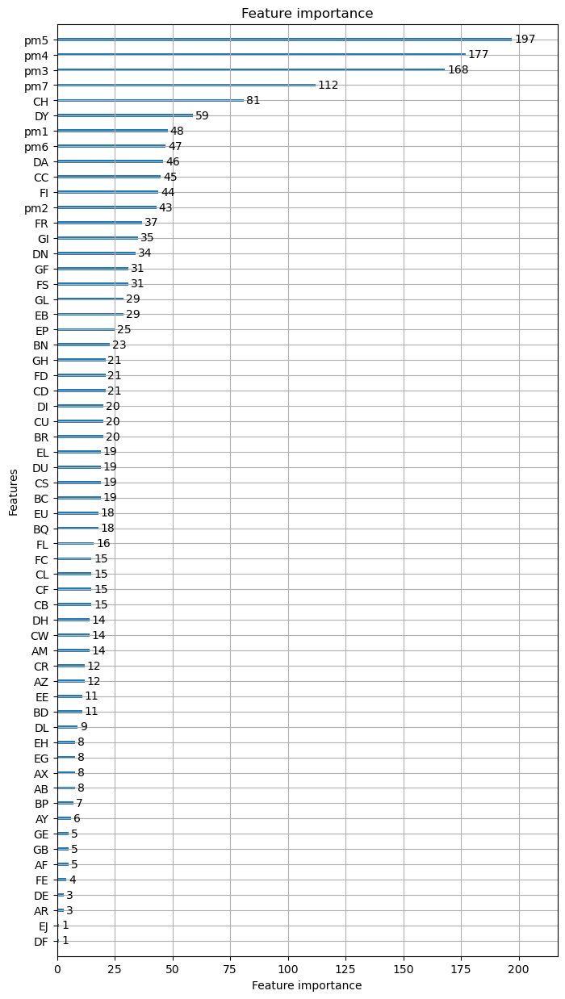

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.554827


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.404128
[300]	valid_0's balanced_logloss: 0.329546
[400]	valid_0's balanced_logloss: 0.28797
[500]	valid_0's balanced_logloss: 0.269186
[600]	valid_0's balanced_logloss: 0.258711
[700]	valid_0's balanced_logloss: 0.253173
[800]	valid_0's balanced_logloss: 0.252896
[900]	valid_0's balanced_logloss: 0.251738
[1000]	valid_0's balanced_logloss: 0.25203
[1100]	valid_0's balanced_logloss: 0.25259
[1200]	valid_0's balanced_logloss: 0.253571
[1300]	valid_0's balanced_logloss: 0.254327
[1400]	valid_0's balanced_logloss: 0.254636


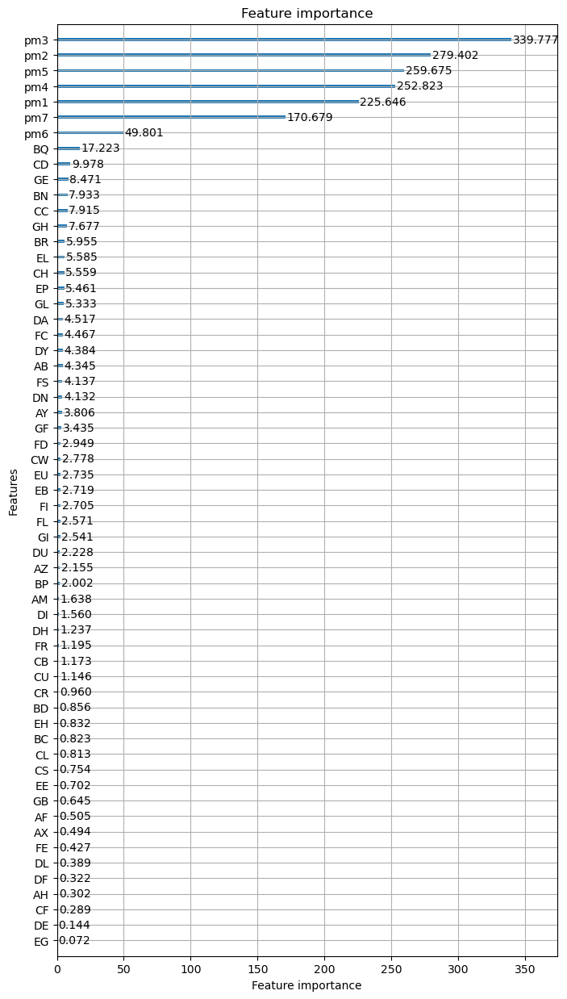

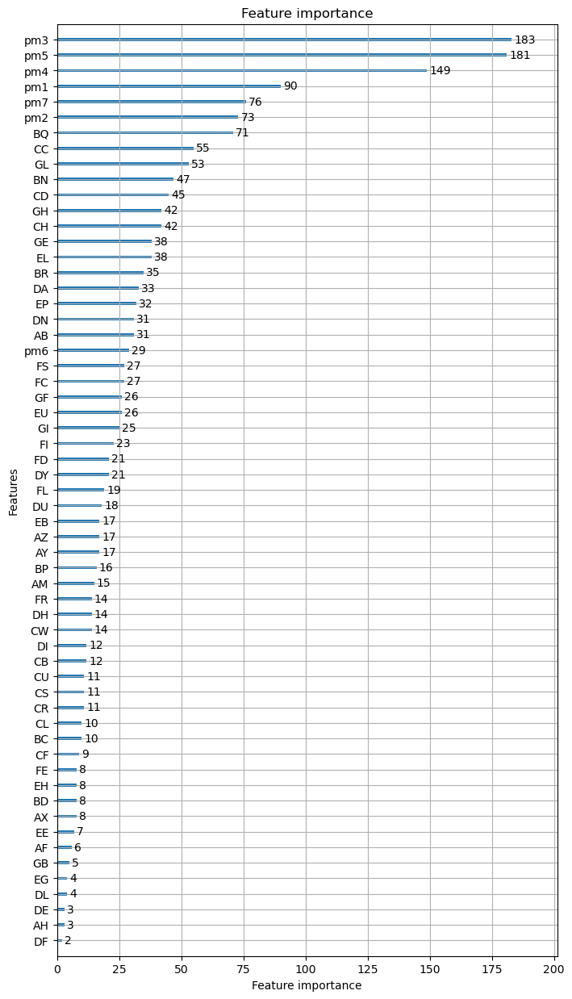

REPEAT NUMBER: 4/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.547563


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.392516
[300]	valid_0's balanced_logloss: 0.32106
[400]	valid_0's balanced_logloss: 0.275848
[500]	valid_0's balanced_logloss: 0.246177
[600]	valid_0's balanced_logloss: 0.229202
[700]	valid_0's balanced_logloss: 0.218949
[800]	valid_0's balanced_logloss: 0.211535
[900]	valid_0's balanced_logloss: 0.208013
[1000]	valid_0's balanced_logloss: 0.202941
[1100]	valid_0's balanced_logloss: 0.200377
[1200]	valid_0's balanced_logloss: 0.197016
[1300]	valid_0's balanced_logloss: 0.195196
[1400]	valid_0's balanced_logloss: 0.192144


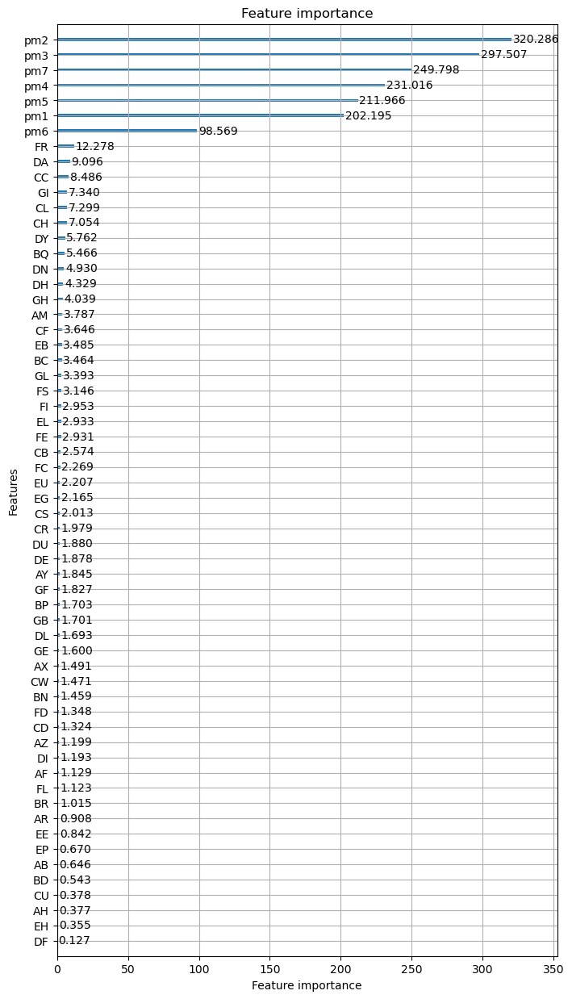

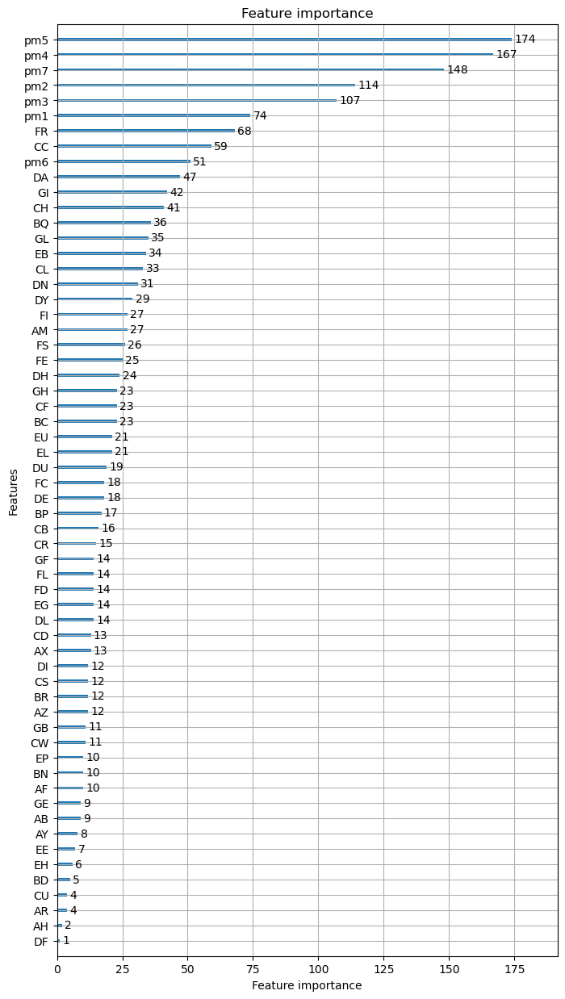

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.593362


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.44377
[300]	valid_0's balanced_logloss: 0.368482
[400]	valid_0's balanced_logloss: 0.316237
[500]	valid_0's balanced_logloss: 0.286445
[600]	valid_0's balanced_logloss: 0.268201
[700]	valid_0's balanced_logloss: 0.25721
[800]	valid_0's balanced_logloss: 0.251548
[900]	valid_0's balanced_logloss: 0.249562
[1000]	valid_0's balanced_logloss: 0.248776
[1100]	valid_0's balanced_logloss: 0.24858
[1200]	valid_0's balanced_logloss: 0.25146
[1300]	valid_0's balanced_logloss: 0.25271
[1400]	valid_0's balanced_logloss: 0.25722


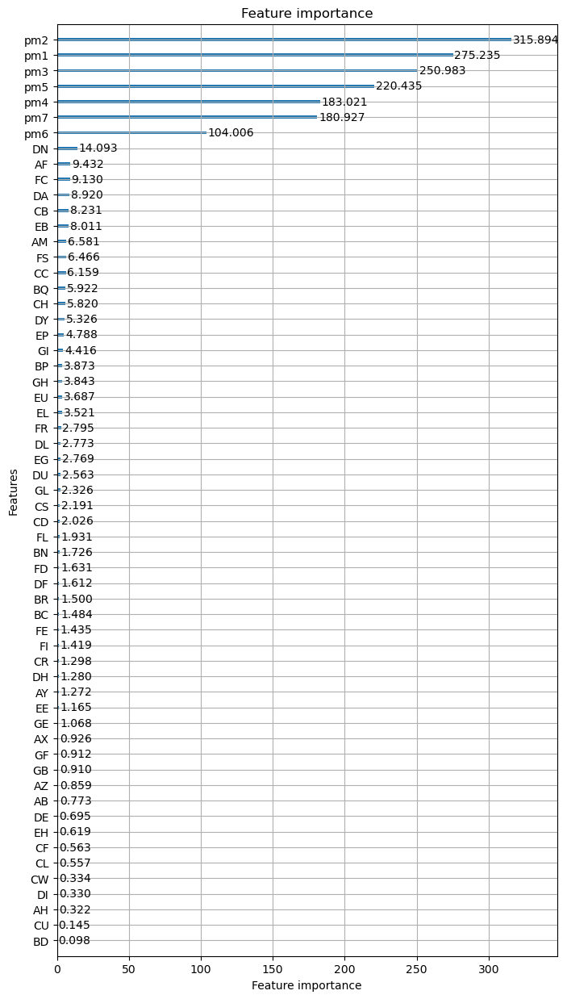

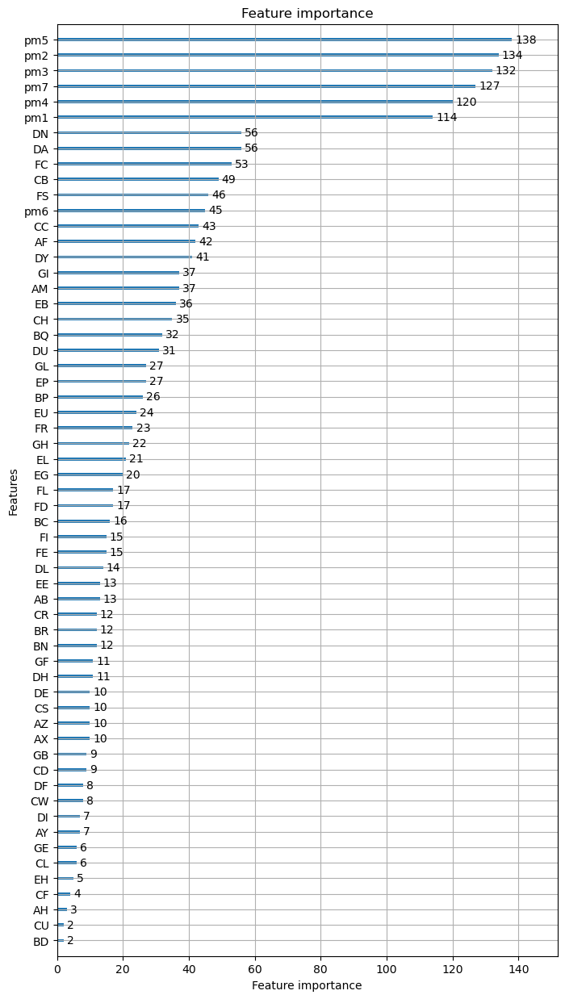

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.567512


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.430826
[300]	valid_0's balanced_logloss: 0.362985
[400]	valid_0's balanced_logloss: 0.32201
[500]	valid_0's balanced_logloss: 0.30498
[600]	valid_0's balanced_logloss: 0.296222
[700]	valid_0's balanced_logloss: 0.294566
[800]	valid_0's balanced_logloss: 0.296111
[900]	valid_0's balanced_logloss: 0.299062
[1000]	valid_0's balanced_logloss: 0.301732
[1100]	valid_0's balanced_logloss: 0.304187
[1200]	valid_0's balanced_logloss: 0.308078
[1300]	valid_0's balanced_logloss: 0.311885
[1400]	valid_0's balanced_logloss: 0.313425


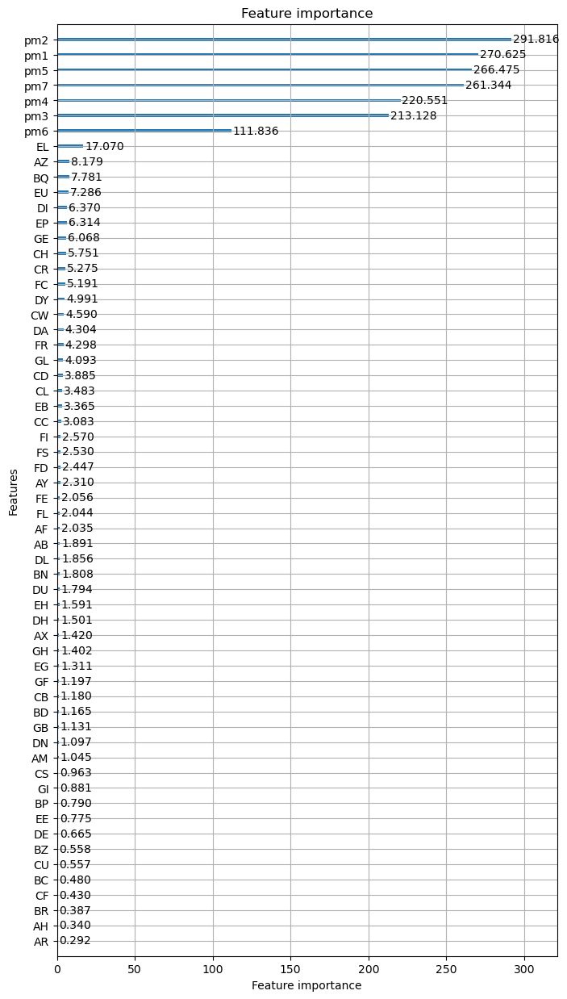

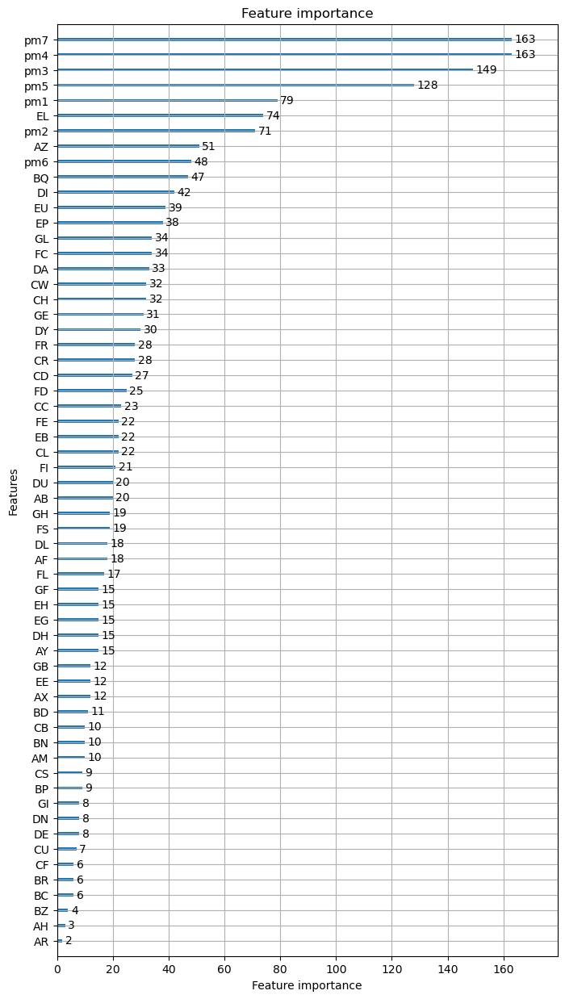

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.538429


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.389287
[300]	valid_0's balanced_logloss: 0.311613
[400]	valid_0's balanced_logloss: 0.267295
[500]	valid_0's balanced_logloss: 0.24342
[600]	valid_0's balanced_logloss: 0.227519
[700]	valid_0's balanced_logloss: 0.220144
[800]	valid_0's balanced_logloss: 0.217339
[900]	valid_0's balanced_logloss: 0.216516
[1000]	valid_0's balanced_logloss: 0.215331
[1100]	valid_0's balanced_logloss: 0.212602
[1200]	valid_0's balanced_logloss: 0.212107
[1300]	valid_0's balanced_logloss: 0.211134
[1400]	valid_0's balanced_logloss: 0.210879


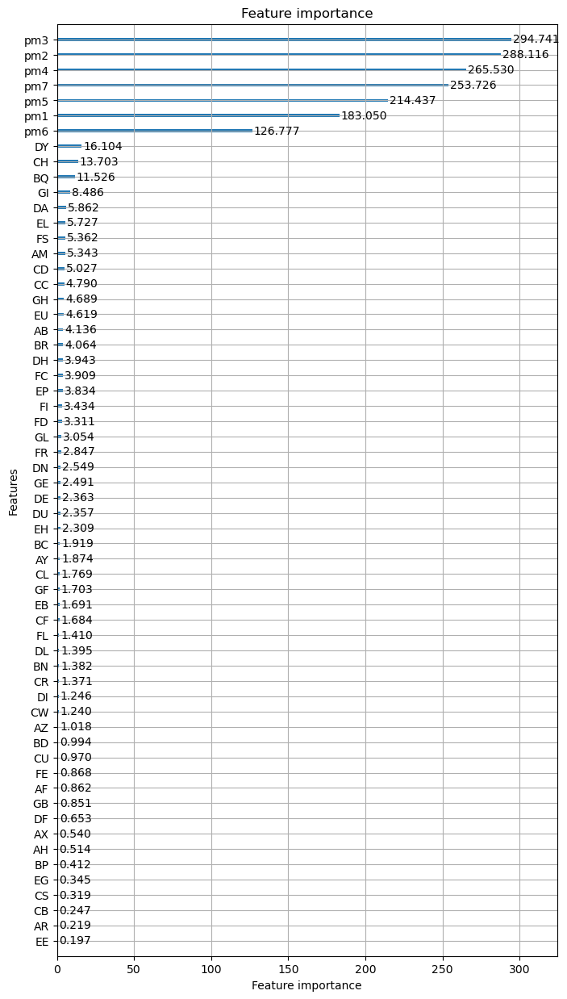

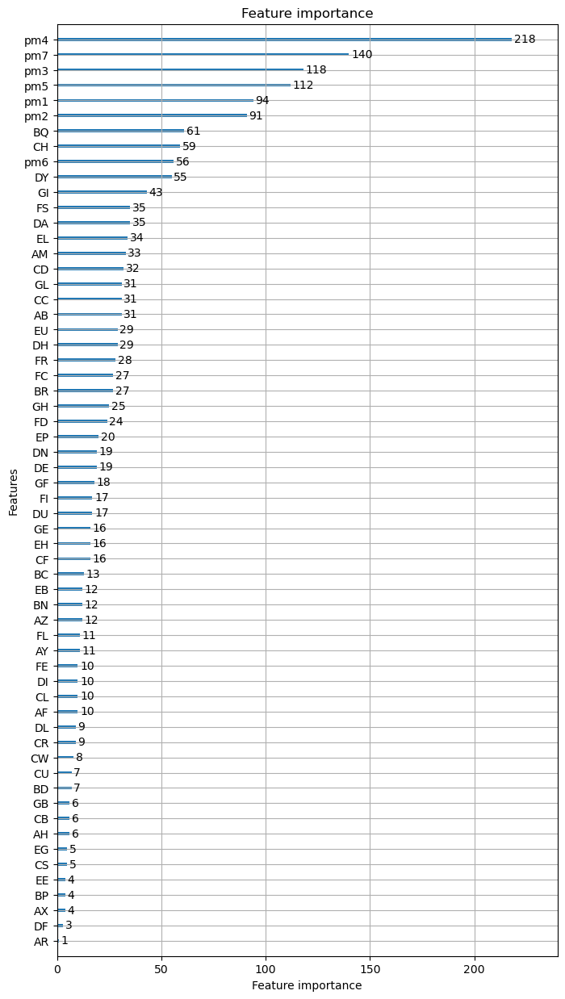

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.53269


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.37543
[300]	valid_0's balanced_logloss: 0.291824
[400]	valid_0's balanced_logloss: 0.242023
[500]	valid_0's balanced_logloss: 0.216977
[600]	valid_0's balanced_logloss: 0.20164
[700]	valid_0's balanced_logloss: 0.192166
[800]	valid_0's balanced_logloss: 0.187502
[900]	valid_0's balanced_logloss: 0.183508
[1000]	valid_0's balanced_logloss: 0.180853
[1100]	valid_0's balanced_logloss: 0.177931
[1200]	valid_0's balanced_logloss: 0.177313
[1300]	valid_0's balanced_logloss: 0.175596
[1400]	valid_0's balanced_logloss: 0.172043


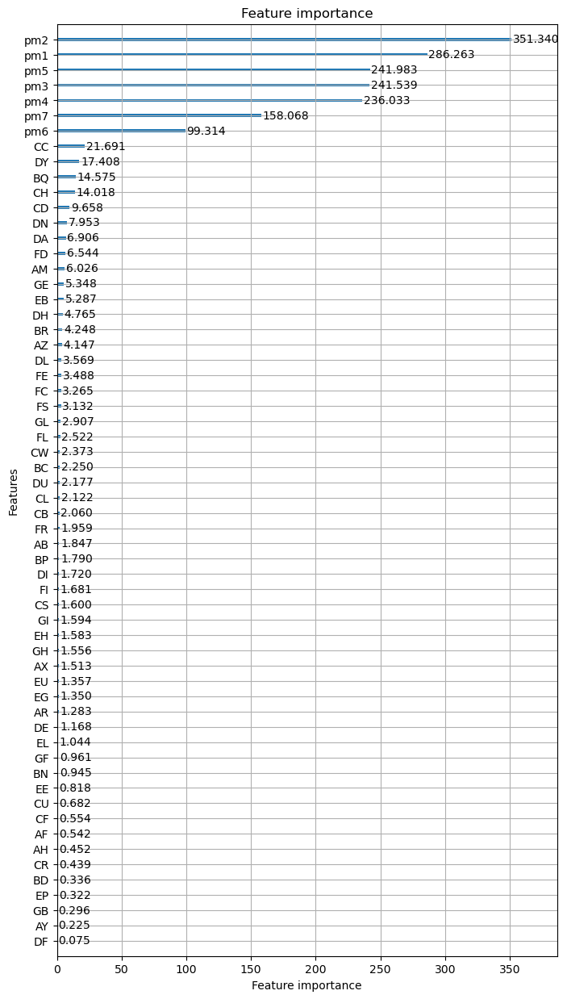

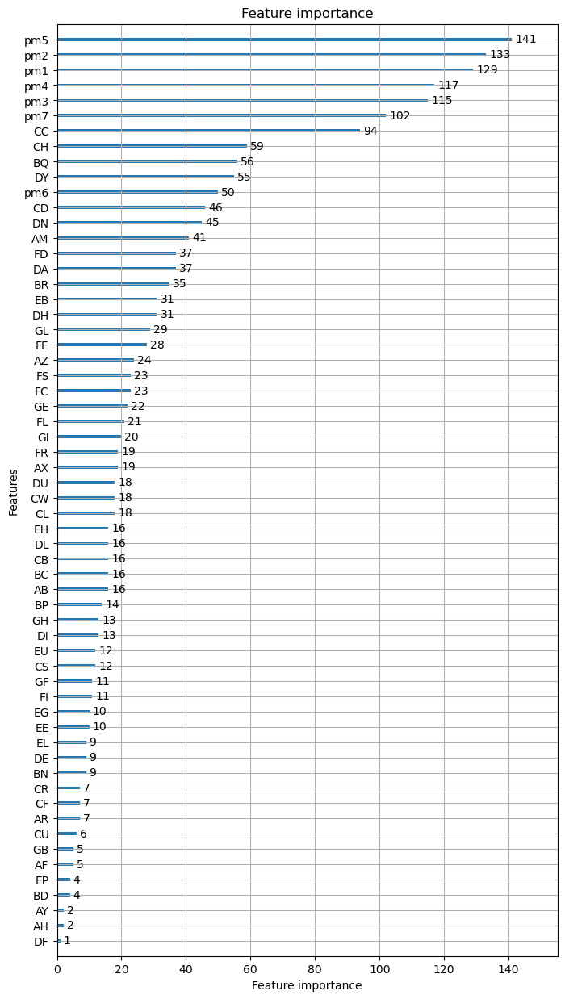

REPEAT NUMBER: 5/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.541135


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.393096
[300]	valid_0's balanced_logloss: 0.32071
[400]	valid_0's balanced_logloss: 0.2798
[500]	valid_0's balanced_logloss: 0.257907
[600]	valid_0's balanced_logloss: 0.245067
[700]	valid_0's balanced_logloss: 0.238647
[800]	valid_0's balanced_logloss: 0.235419
[900]	valid_0's balanced_logloss: 0.235136
[1000]	valid_0's balanced_logloss: 0.234107
[1100]	valid_0's balanced_logloss: 0.232145
[1200]	valid_0's balanced_logloss: 0.230786
[1300]	valid_0's balanced_logloss: 0.229958
[1400]	valid_0's balanced_logloss: 0.227296


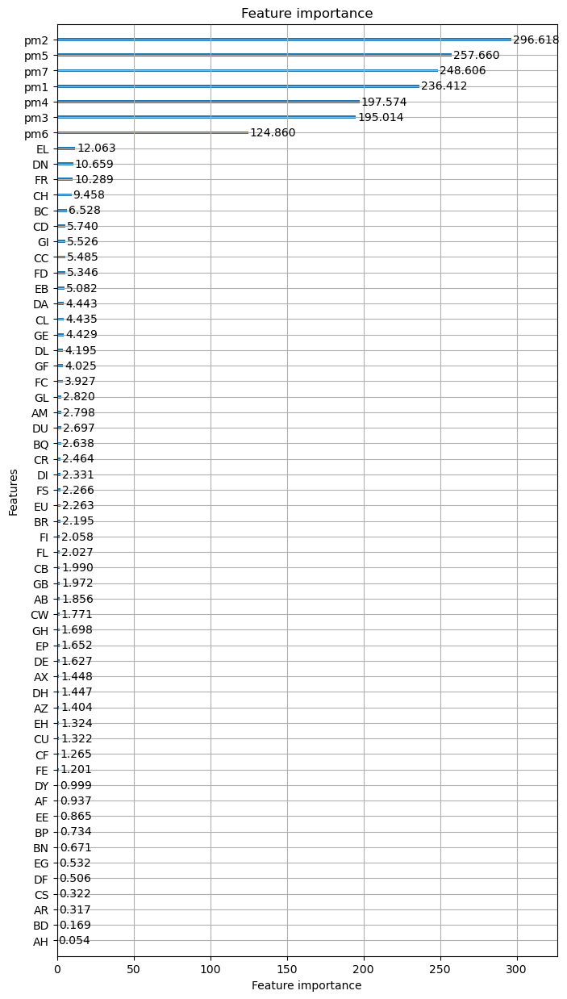

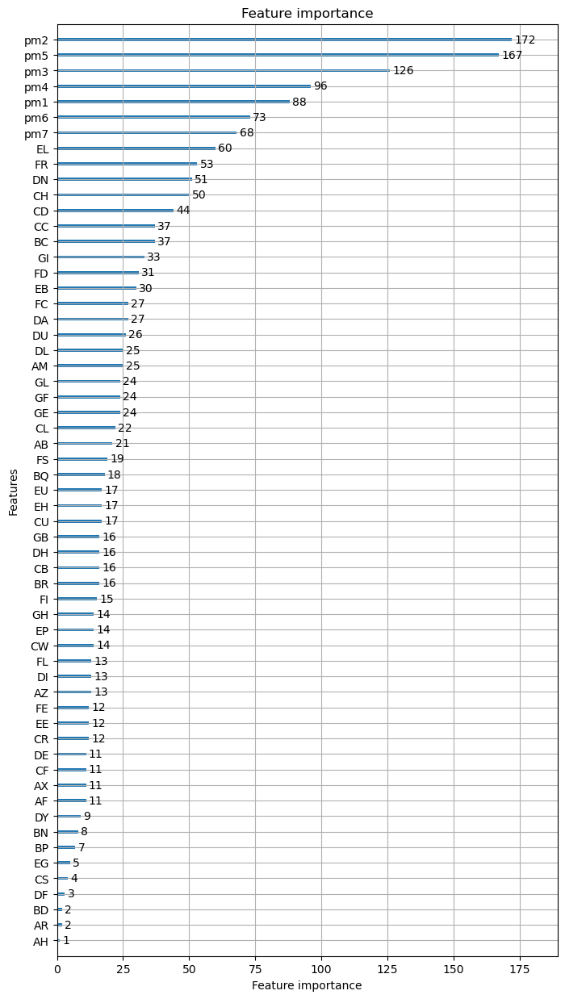

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.526531


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.364955
[300]	valid_0's balanced_logloss: 0.287337
[400]	valid_0's balanced_logloss: 0.23523
[500]	valid_0's balanced_logloss: 0.208135
[600]	valid_0's balanced_logloss: 0.194364
[700]	valid_0's balanced_logloss: 0.185519
[800]	valid_0's balanced_logloss: 0.179205
[900]	valid_0's balanced_logloss: 0.177162
[1000]	valid_0's balanced_logloss: 0.174799
[1100]	valid_0's balanced_logloss: 0.174569
[1200]	valid_0's balanced_logloss: 0.172988
[1300]	valid_0's balanced_logloss: 0.172679
[1400]	valid_0's balanced_logloss: 0.172937


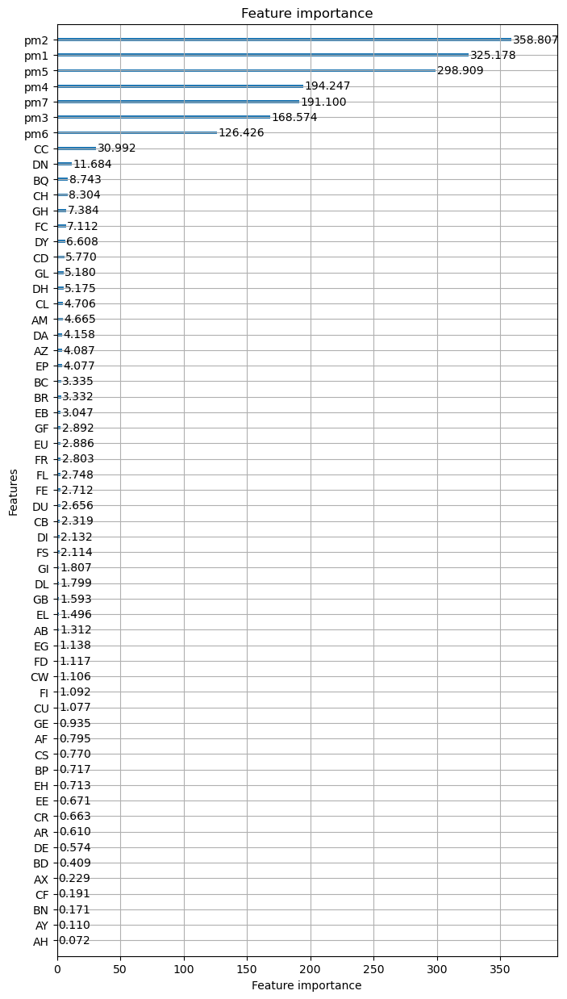

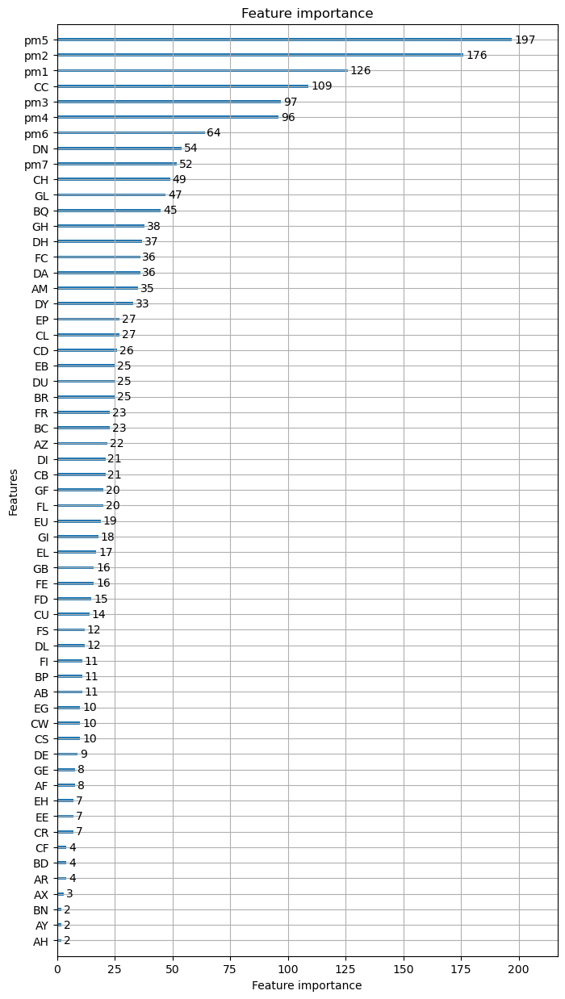

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.537231


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.380241
[300]	valid_0's balanced_logloss: 0.300724
[400]	valid_0's balanced_logloss: 0.249604
[500]	valid_0's balanced_logloss: 0.224624
[600]	valid_0's balanced_logloss: 0.20866
[700]	valid_0's balanced_logloss: 0.199765
[800]	valid_0's balanced_logloss: 0.194524
[900]	valid_0's balanced_logloss: 0.192444
[1000]	valid_0's balanced_logloss: 0.191483
[1100]	valid_0's balanced_logloss: 0.193083
[1200]	valid_0's balanced_logloss: 0.195035
[1300]	valid_0's balanced_logloss: 0.197951
[1400]	valid_0's balanced_logloss: 0.199894


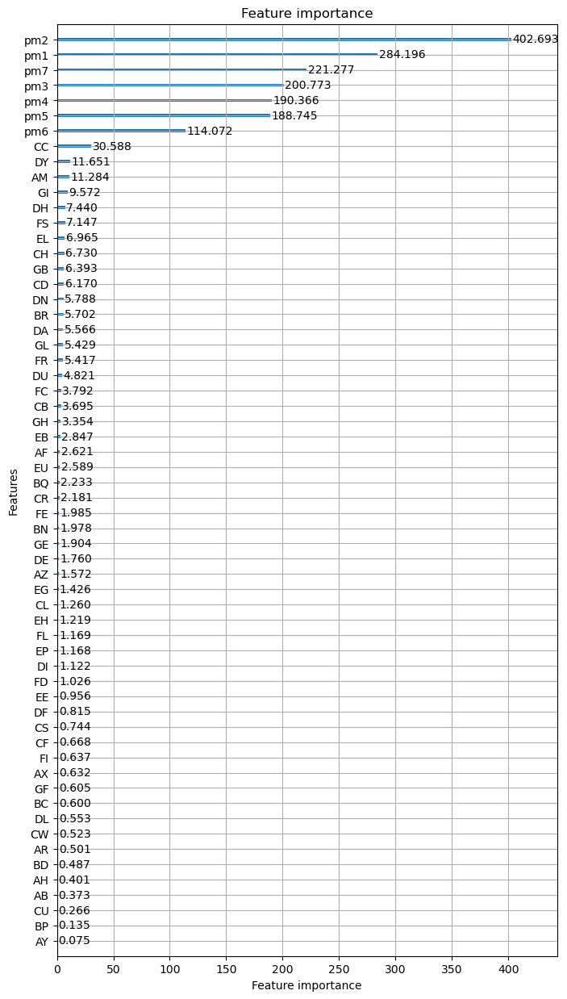

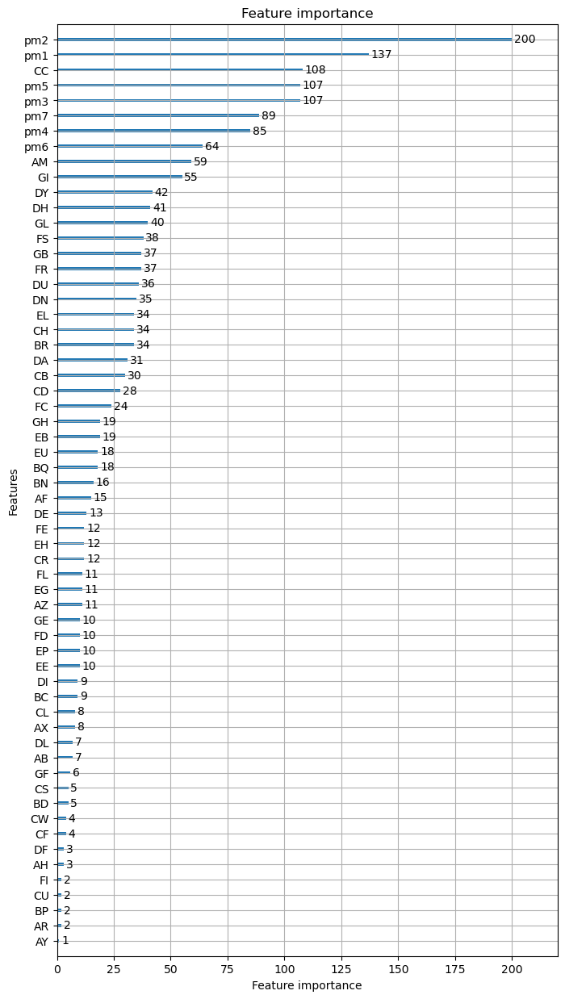

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.523549


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.368994
[300]	valid_0's balanced_logloss: 0.290543
[400]	valid_0's balanced_logloss: 0.231802
[500]	valid_0's balanced_logloss: 0.200271
[600]	valid_0's balanced_logloss: 0.18065
[700]	valid_0's balanced_logloss: 0.167245
[800]	valid_0's balanced_logloss: 0.159533
[900]	valid_0's balanced_logloss: 0.155801
[1000]	valid_0's balanced_logloss: 0.153136
[1100]	valid_0's balanced_logloss: 0.151443
[1200]	valid_0's balanced_logloss: 0.149945
[1300]	valid_0's balanced_logloss: 0.149677
[1400]	valid_0's balanced_logloss: 0.150372


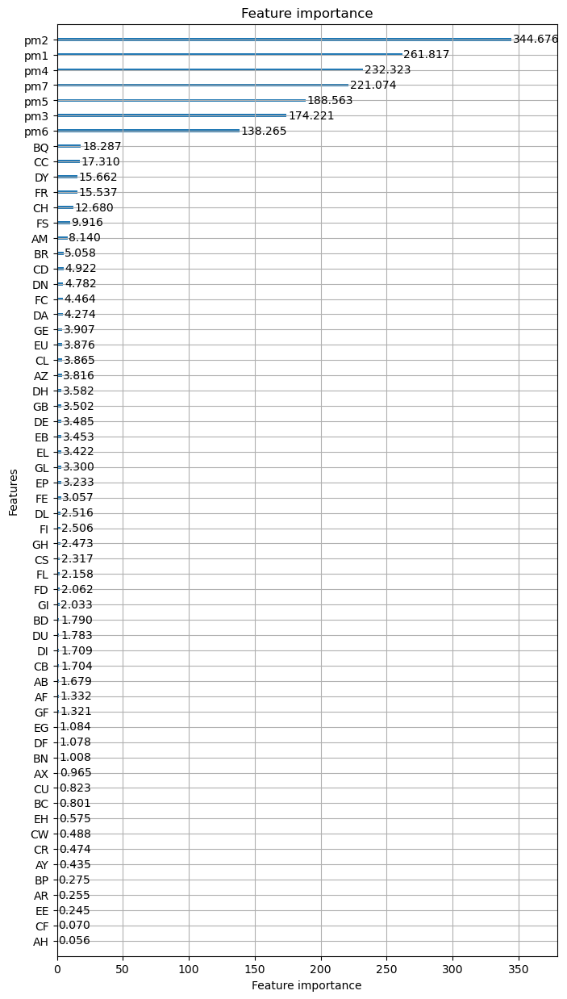

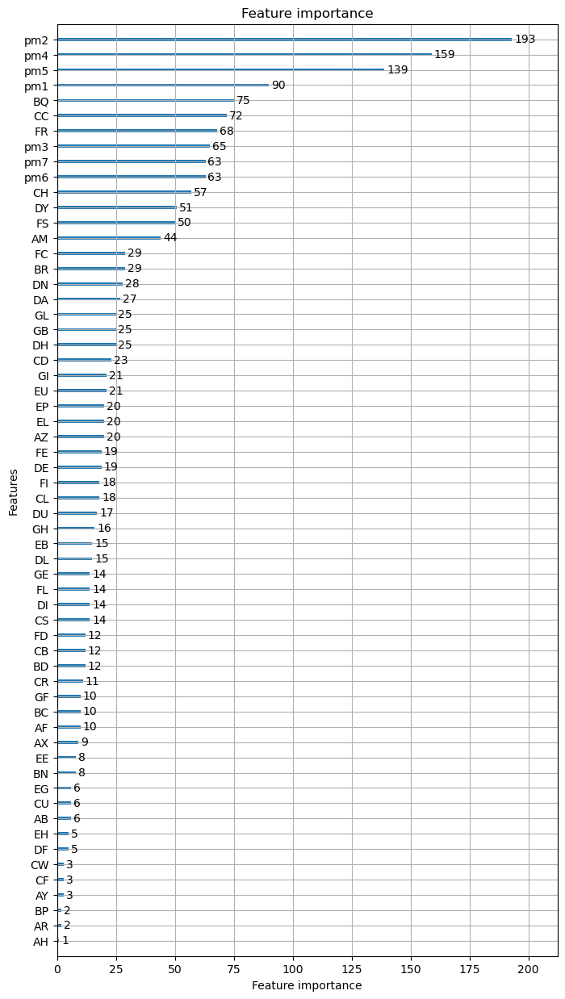

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.629542


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.503193
[300]	valid_0's balanced_logloss: 0.446875
[400]	valid_0's balanced_logloss: 0.421859
[500]	valid_0's balanced_logloss: 0.410066
[600]	valid_0's balanced_logloss: 0.408596
[700]	valid_0's balanced_logloss: 0.410909
[800]	valid_0's balanced_logloss: 0.413652
[900]	valid_0's balanced_logloss: 0.417492
[1000]	valid_0's balanced_logloss: 0.425344
[1100]	valid_0's balanced_logloss: 0.435495
[1200]	valid_0's balanced_logloss: 0.445012
[1300]	valid_0's balanced_logloss: 0.455877
[1400]	valid_0's balanced_logloss: 0.465922


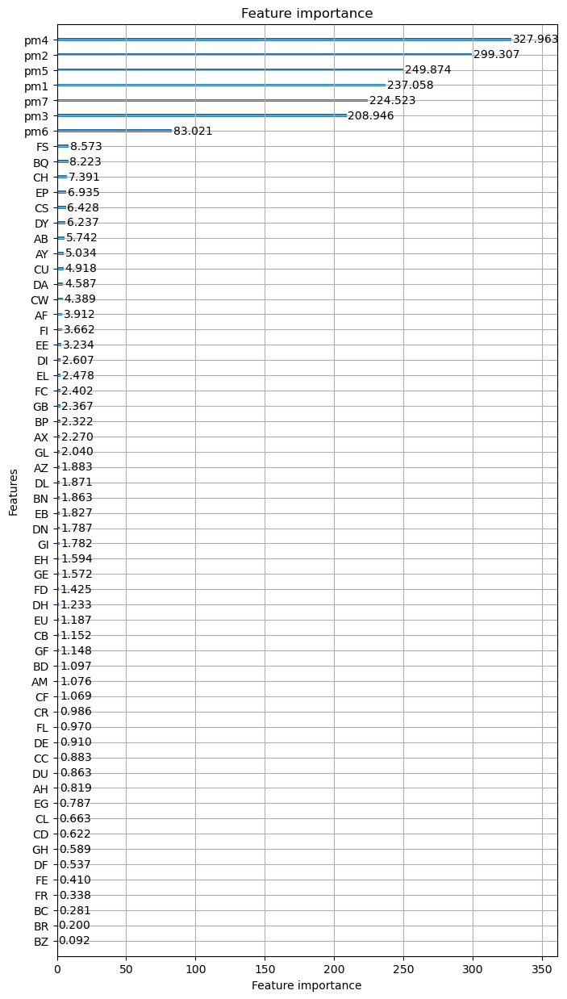

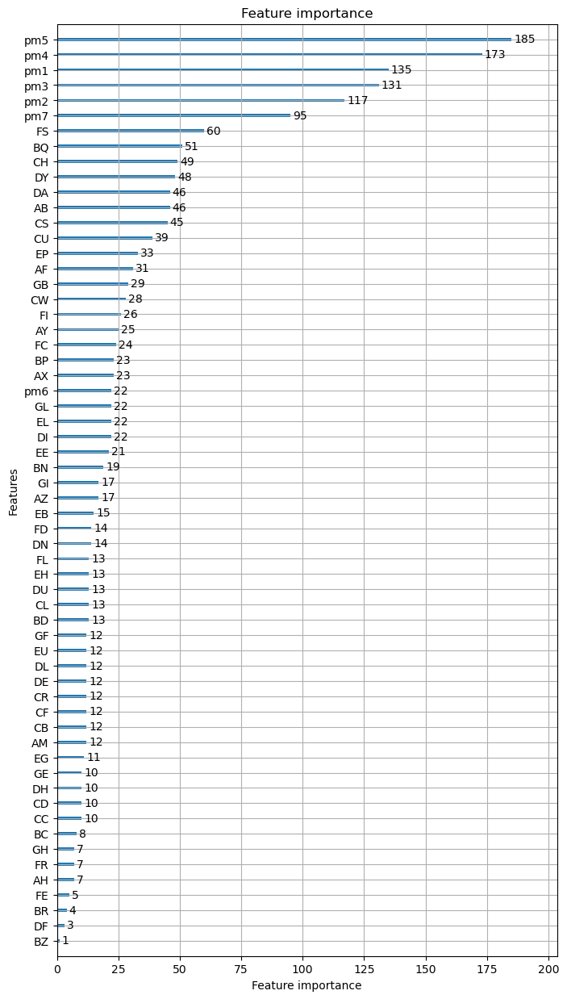

REPEAT NUMBER: 6/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.530929


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.367647
[300]	valid_0's balanced_logloss: 0.282436
[400]	valid_0's balanced_logloss: 0.231502
[500]	valid_0's balanced_logloss: 0.201807
[600]	valid_0's balanced_logloss: 0.183746
[700]	valid_0's balanced_logloss: 0.17381
[800]	valid_0's balanced_logloss: 0.164705
[900]	valid_0's balanced_logloss: 0.160429
[1000]	valid_0's balanced_logloss: 0.157445
[1100]	valid_0's balanced_logloss: 0.15313
[1200]	valid_0's balanced_logloss: 0.150135
[1300]	valid_0's balanced_logloss: 0.149126
[1400]	valid_0's balanced_logloss: 0.147015


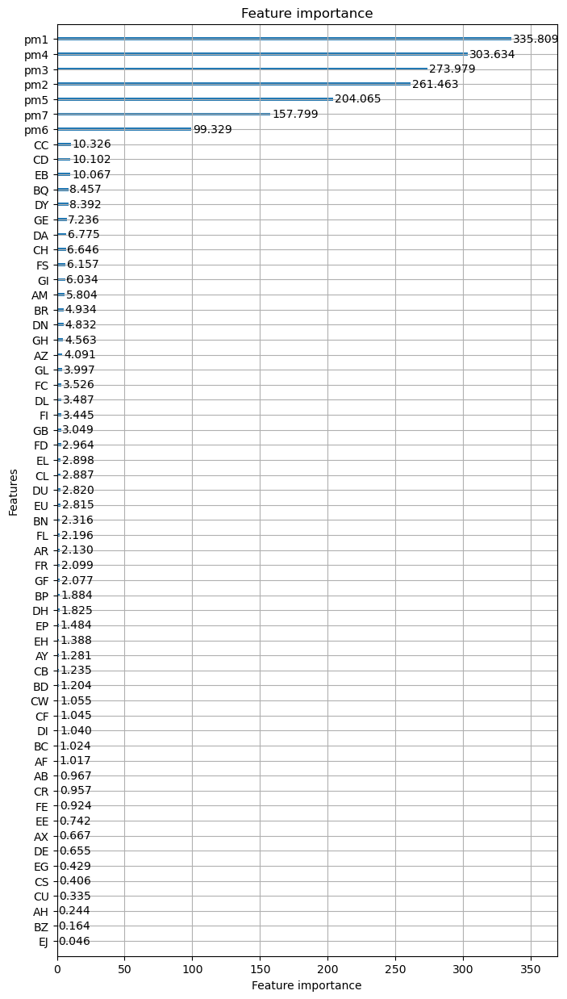

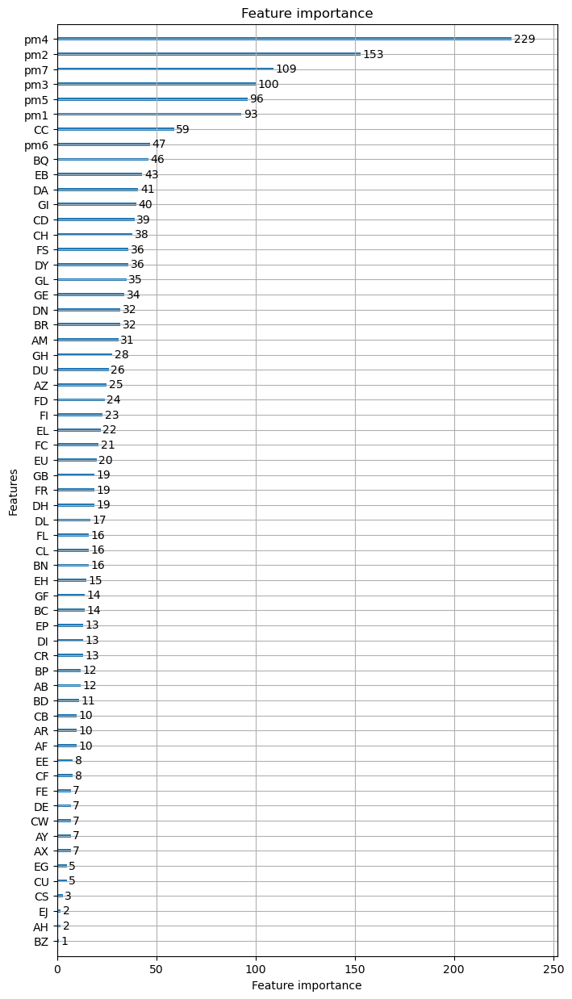

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.538648


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.380115
[300]	valid_0's balanced_logloss: 0.297565
[400]	valid_0's balanced_logloss: 0.24652
[500]	valid_0's balanced_logloss: 0.215885
[600]	valid_0's balanced_logloss: 0.193348
[700]	valid_0's balanced_logloss: 0.182586
[800]	valid_0's balanced_logloss: 0.175658
[900]	valid_0's balanced_logloss: 0.16993
[1000]	valid_0's balanced_logloss: 0.163013
[1100]	valid_0's balanced_logloss: 0.159813
[1200]	valid_0's balanced_logloss: 0.15849
[1300]	valid_0's balanced_logloss: 0.156179
[1400]	valid_0's balanced_logloss: 0.154649


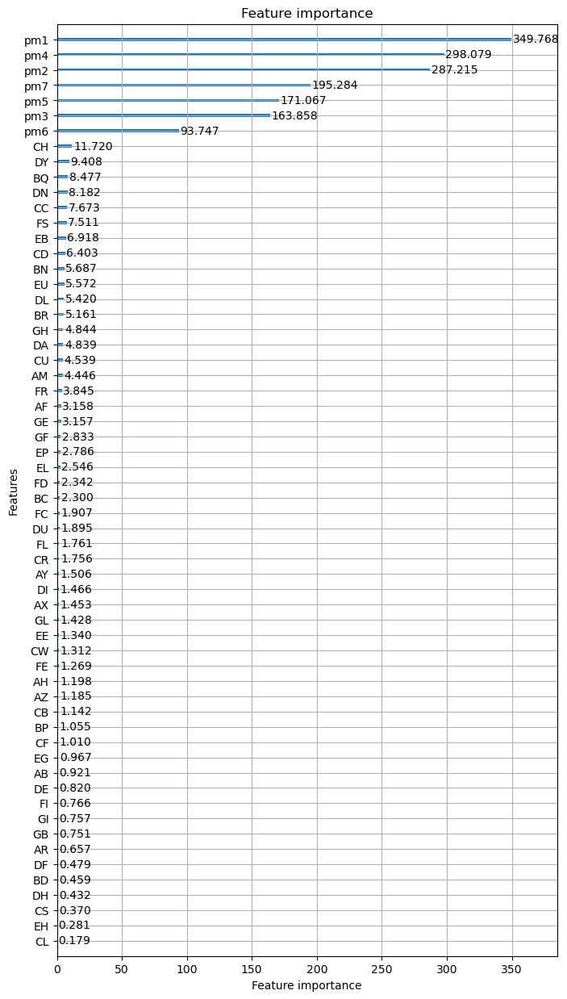

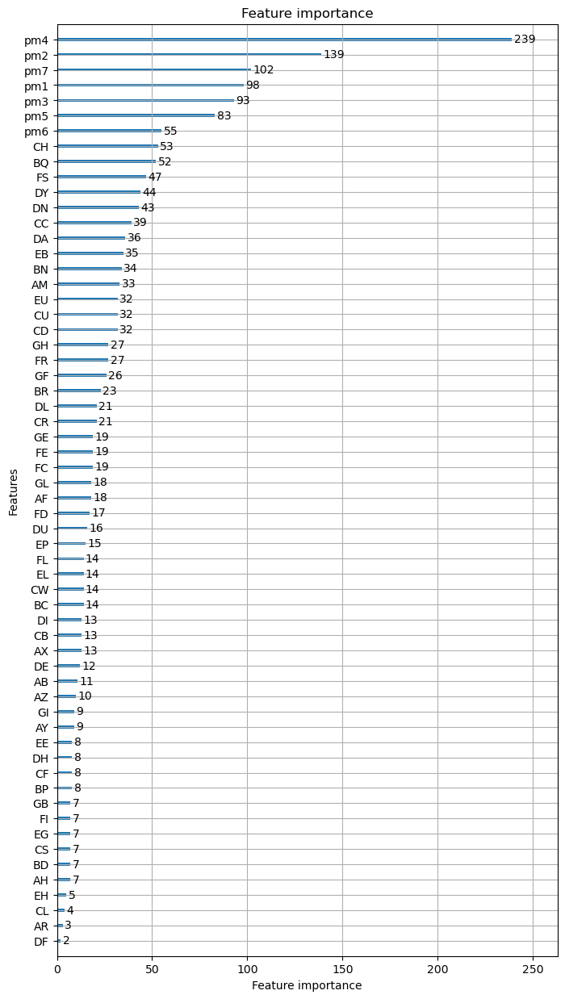

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.547583


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.396756
[300]	valid_0's balanced_logloss: 0.320965
[400]	valid_0's balanced_logloss: 0.276234
[500]	valid_0's balanced_logloss: 0.253663
[600]	valid_0's balanced_logloss: 0.2416
[700]	valid_0's balanced_logloss: 0.234638
[800]	valid_0's balanced_logloss: 0.229631
[900]	valid_0's balanced_logloss: 0.226545
[1000]	valid_0's balanced_logloss: 0.226114
[1100]	valid_0's balanced_logloss: 0.224885
[1200]	valid_0's balanced_logloss: 0.225102
[1300]	valid_0's balanced_logloss: 0.225371
[1400]	valid_0's balanced_logloss: 0.225909


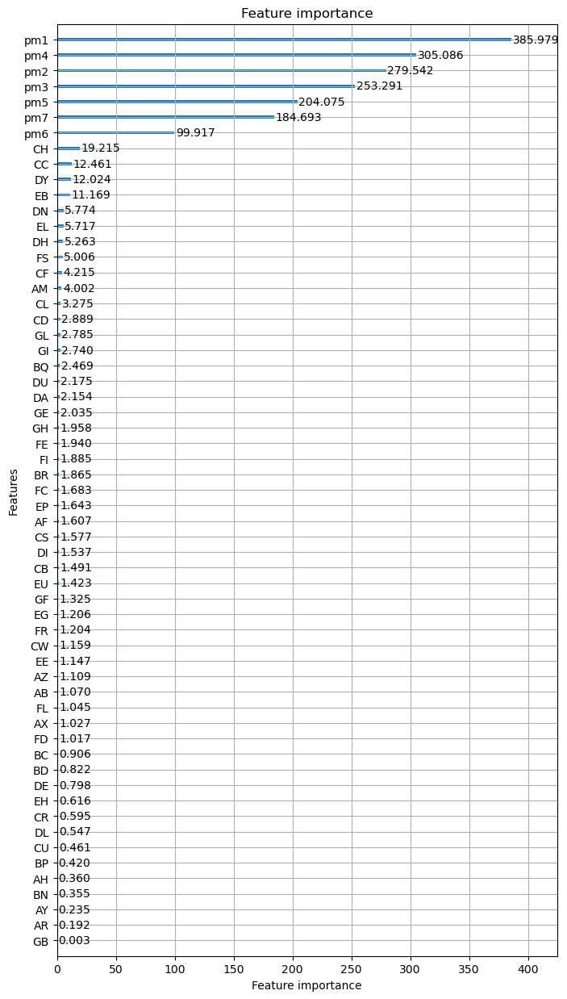

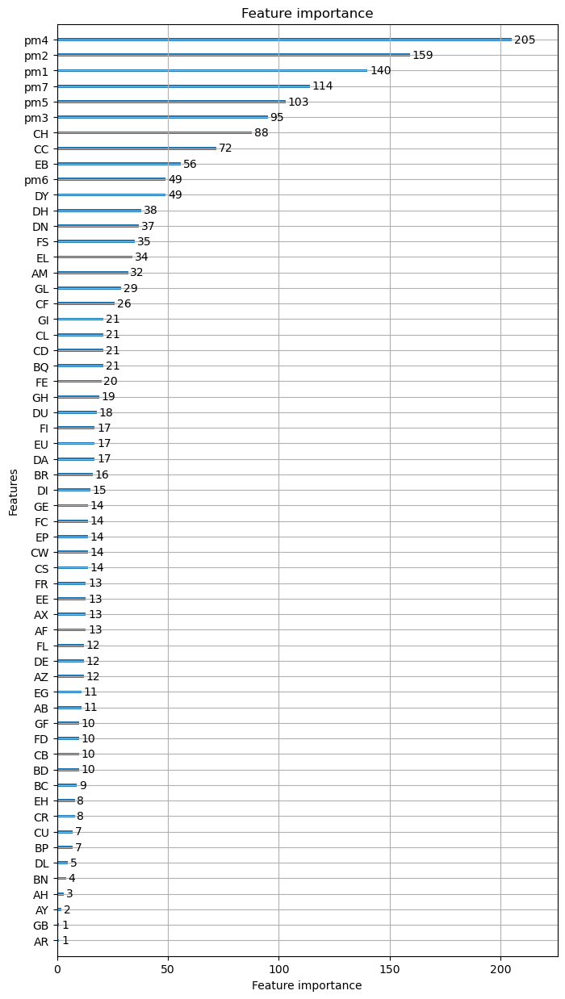

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.574995


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.425031
[300]	valid_0's balanced_logloss: 0.349632
[400]	valid_0's balanced_logloss: 0.307561
[500]	valid_0's balanced_logloss: 0.289077
[600]	valid_0's balanced_logloss: 0.278365
[700]	valid_0's balanced_logloss: 0.276878
[800]	valid_0's balanced_logloss: 0.278355
[900]	valid_0's balanced_logloss: 0.282636
[1000]	valid_0's balanced_logloss: 0.28908
[1100]	valid_0's balanced_logloss: 0.295852
[1200]	valid_0's balanced_logloss: 0.301198
[1300]	valid_0's balanced_logloss: 0.307289
[1400]	valid_0's balanced_logloss: 0.316631


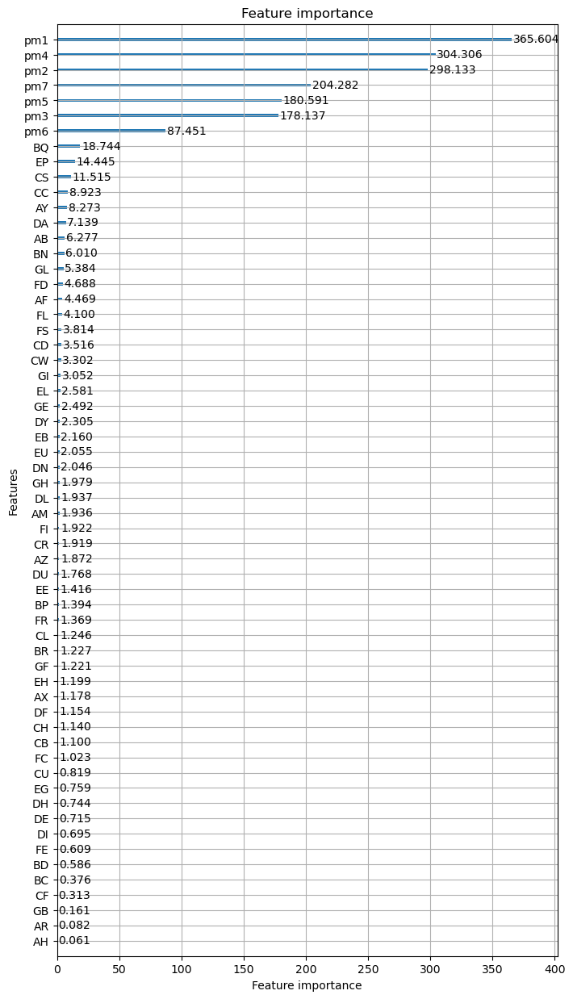

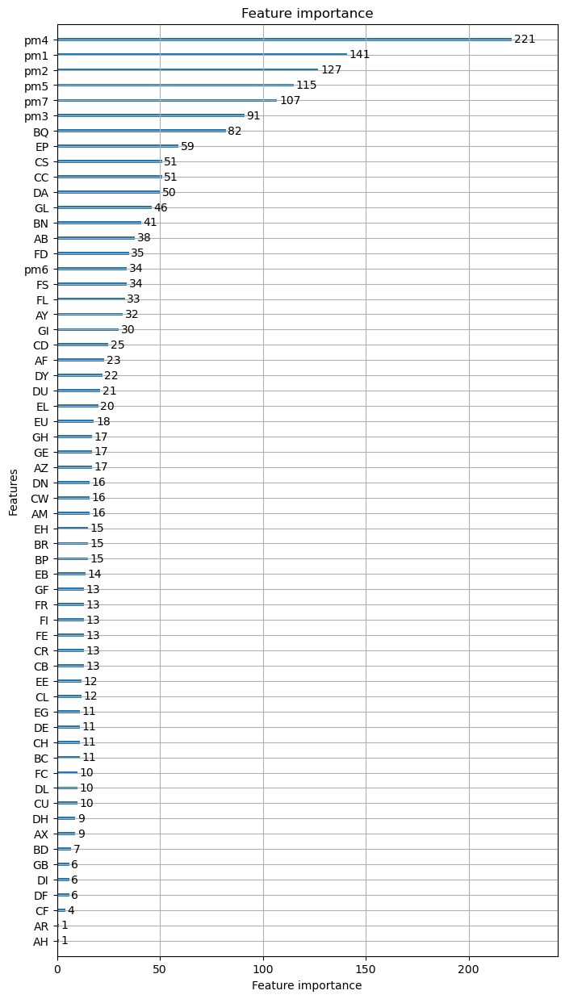

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.54912


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.403892
[300]	valid_0's balanced_logloss: 0.328553
[400]	valid_0's balanced_logloss: 0.280246
[500]	valid_0's balanced_logloss: 0.257249
[600]	valid_0's balanced_logloss: 0.240845
[700]	valid_0's balanced_logloss: 0.232714
[800]	valid_0's balanced_logloss: 0.226767
[900]	valid_0's balanced_logloss: 0.224847
[1000]	valid_0's balanced_logloss: 0.223789
[1100]	valid_0's balanced_logloss: 0.225381
[1200]	valid_0's balanced_logloss: 0.228098
[1300]	valid_0's balanced_logloss: 0.229428
[1400]	valid_0's balanced_logloss: 0.232115


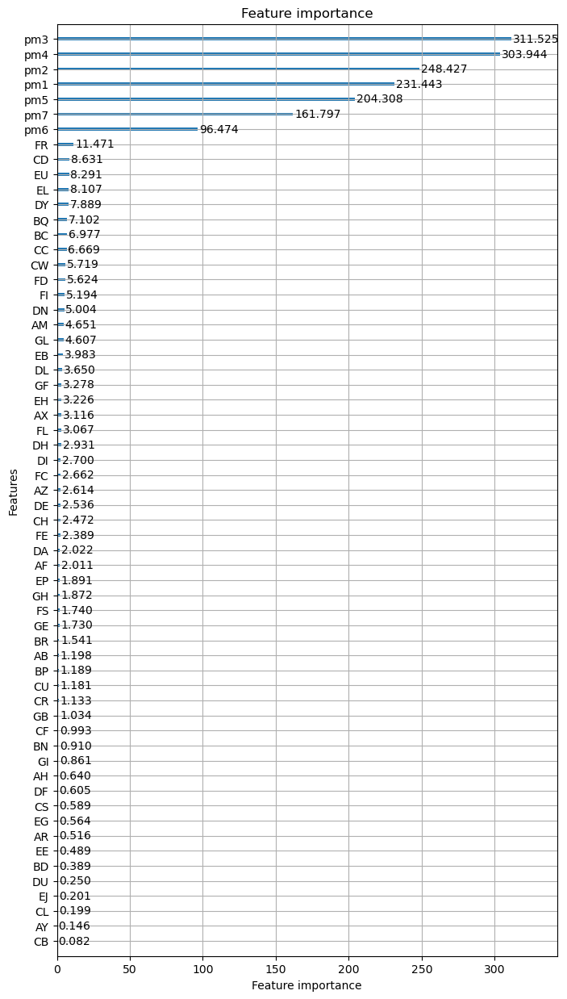

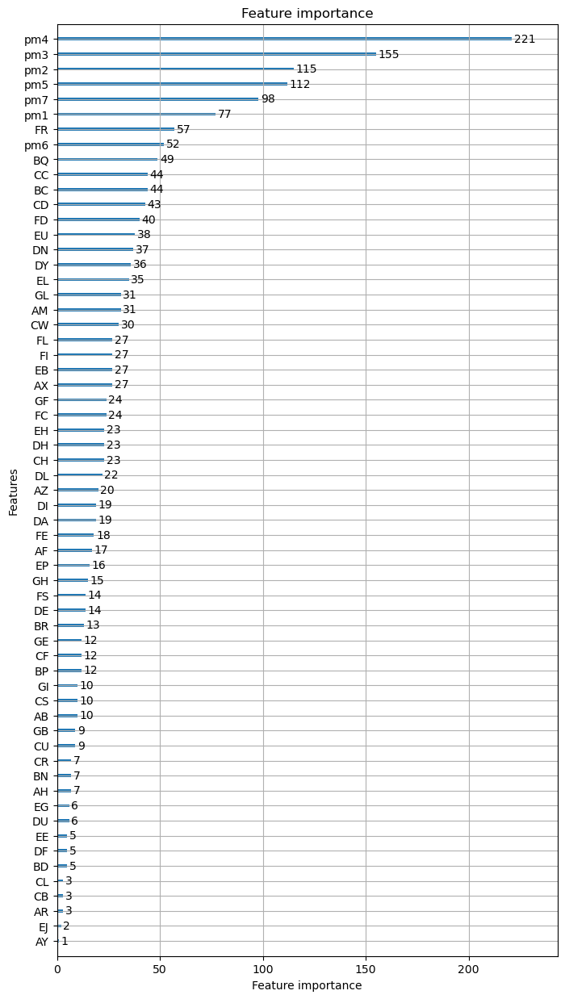

REPEAT NUMBER: 7/10
training model for fold: 1/5


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[100]	valid_0's balanced_logloss: 0.616417
[200]	valid_0's balanced_logloss: 0.482587
[300]	valid_0's balanced_logloss: 0.417639
[400]	valid_0's balanced_logloss: 0.384508
[500]	valid_0's balanced_logloss: 0.36627
[600]	valid_0's balanced_logloss: 0.358963
[700]	valid_0's balanced_logloss: 0.355776
[800]	valid_0's balanced_logloss: 0.355501
[900]	valid_0's balanced_logloss: 0.355762
[1000]	valid_0's balanced_logloss: 0.359152
[1100]	valid_0's balanced_logloss: 0.36294
[1200]	valid_0's balanced_logloss: 0.366799
[1300]	valid_0's balanced_logloss: 0.370086
[1400]	valid_0's balanced_logloss: 0.374206


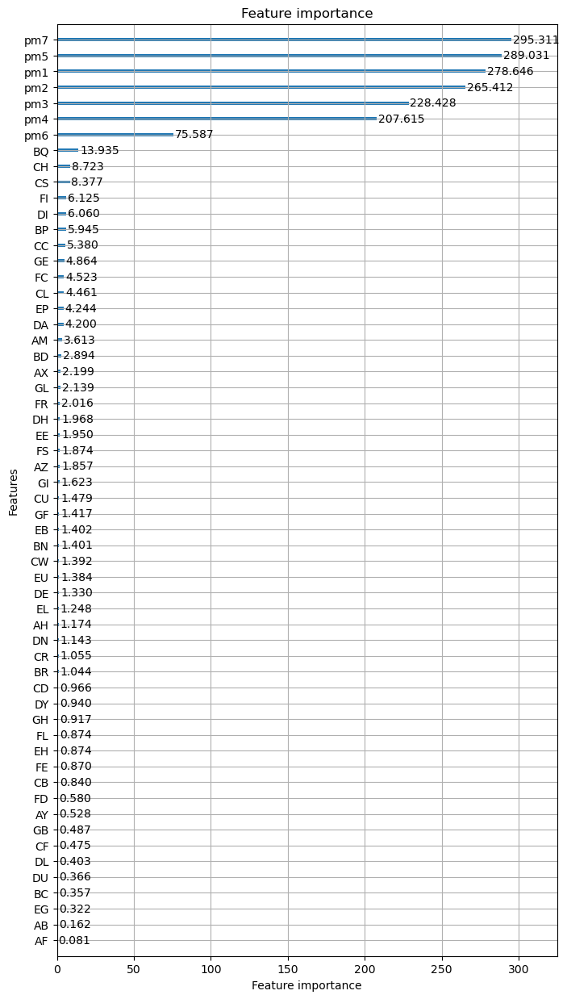

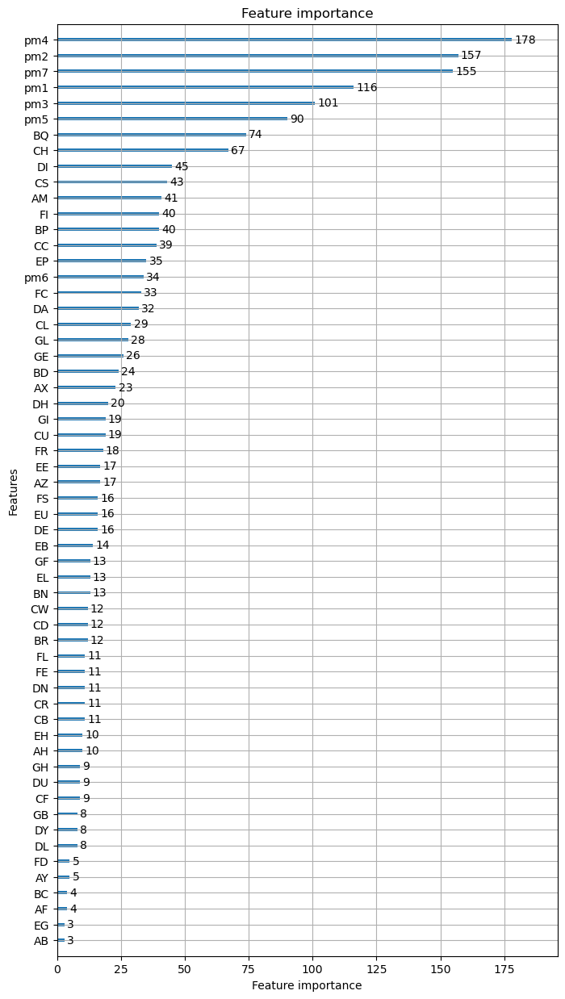

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.543371


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.383289
[300]	valid_0's balanced_logloss: 0.297341
[400]	valid_0's balanced_logloss: 0.248077
[500]	valid_0's balanced_logloss: 0.219451
[600]	valid_0's balanced_logloss: 0.202285
[700]	valid_0's balanced_logloss: 0.193102
[800]	valid_0's balanced_logloss: 0.18576
[900]	valid_0's balanced_logloss: 0.182805
[1000]	valid_0's balanced_logloss: 0.180816
[1100]	valid_0's balanced_logloss: 0.180035
[1200]	valid_0's balanced_logloss: 0.180847
[1300]	valid_0's balanced_logloss: 0.180739
[1400]	valid_0's balanced_logloss: 0.182675


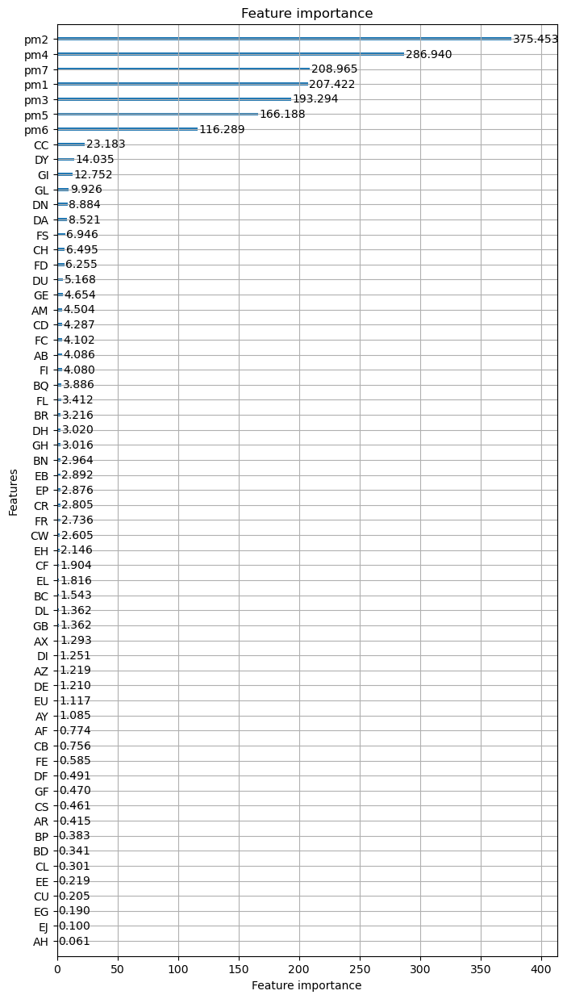

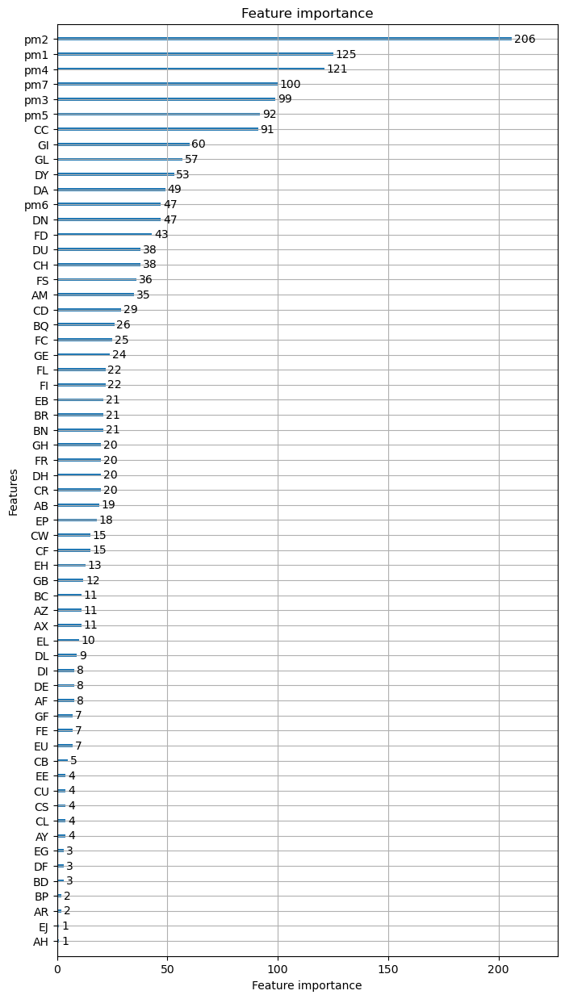

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.511276


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.3551
[300]	valid_0's balanced_logloss: 0.280895
[400]	valid_0's balanced_logloss: 0.233292
[500]	valid_0's balanced_logloss: 0.210313
[600]	valid_0's balanced_logloss: 0.195218
[700]	valid_0's balanced_logloss: 0.18596
[800]	valid_0's balanced_logloss: 0.179809
[900]	valid_0's balanced_logloss: 0.176912
[1000]	valid_0's balanced_logloss: 0.173307
[1100]	valid_0's balanced_logloss: 0.167665
[1200]	valid_0's balanced_logloss: 0.164566
[1300]	valid_0's balanced_logloss: 0.162526
[1400]	valid_0's balanced_logloss: 0.159796


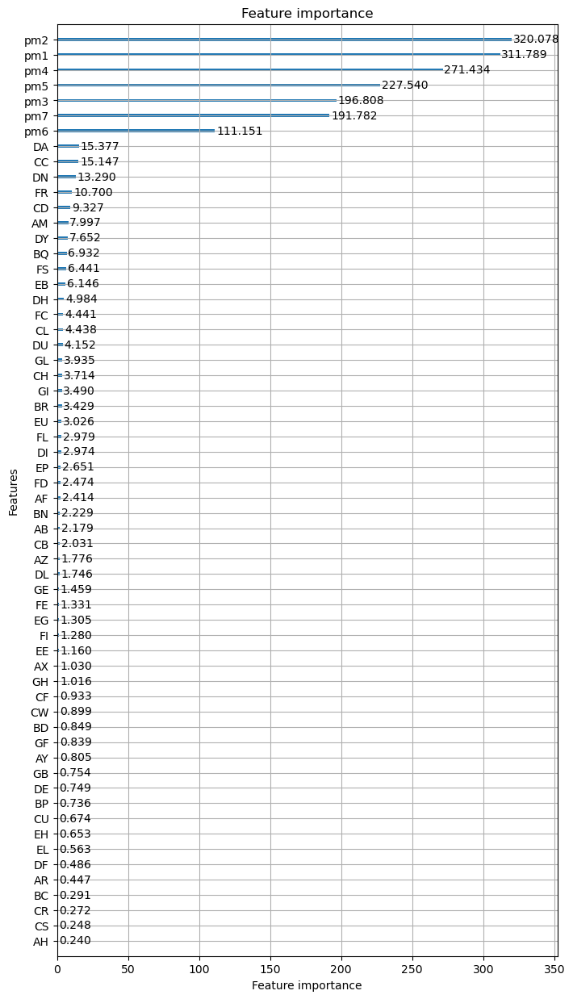

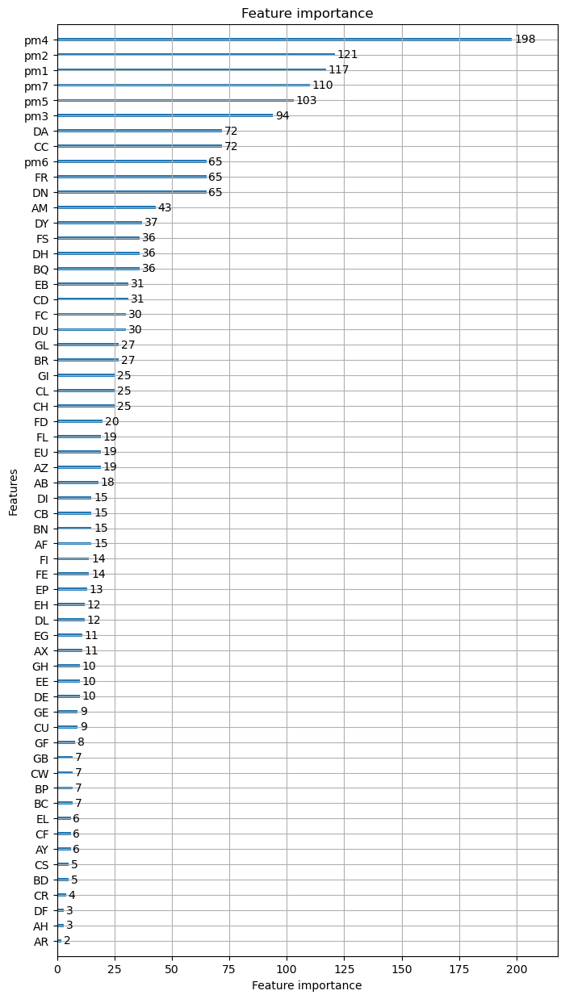

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.56482


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.420235
[300]	valid_0's balanced_logloss: 0.343831
[400]	valid_0's balanced_logloss: 0.298989
[500]	valid_0's balanced_logloss: 0.274035
[600]	valid_0's balanced_logloss: 0.257047
[700]	valid_0's balanced_logloss: 0.249201
[800]	valid_0's balanced_logloss: 0.243096
[900]	valid_0's balanced_logloss: 0.238311
[1000]	valid_0's balanced_logloss: 0.238748
[1100]	valid_0's balanced_logloss: 0.238752
[1200]	valid_0's balanced_logloss: 0.23908
[1300]	valid_0's balanced_logloss: 0.238819
[1400]	valid_0's balanced_logloss: 0.241217


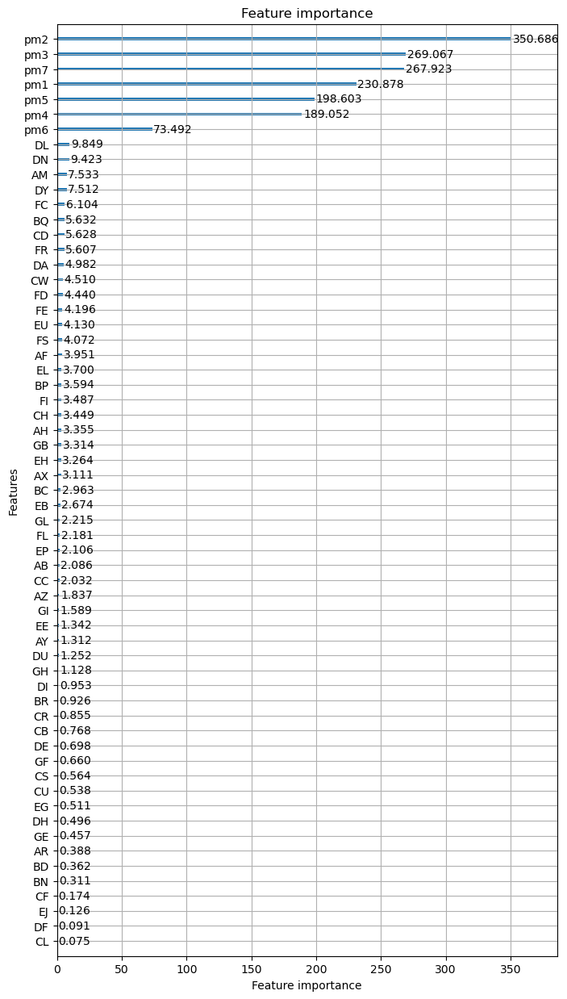

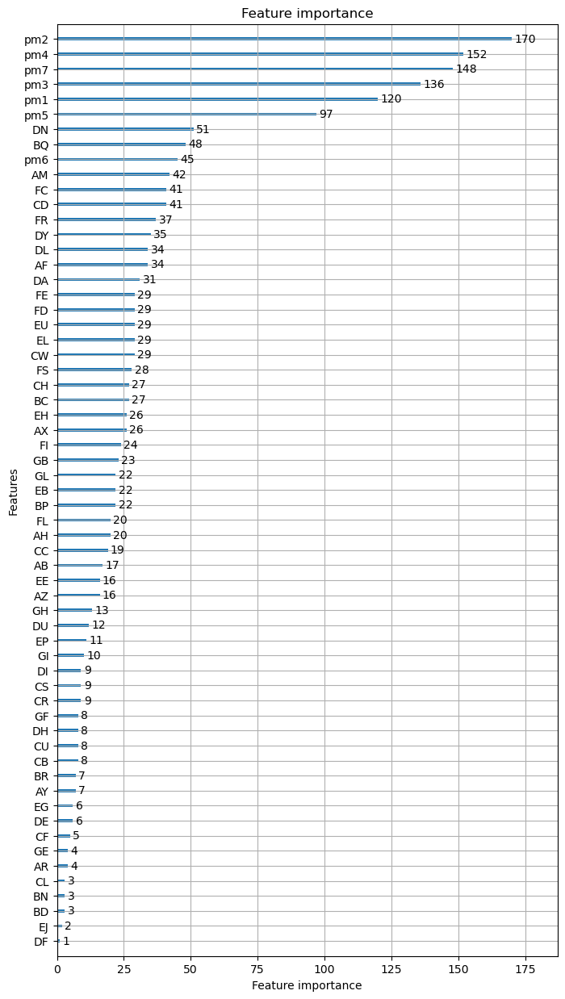

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.517487


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.352376
[300]	valid_0's balanced_logloss: 0.266069
[400]	valid_0's balanced_logloss: 0.211552
[500]	valid_0's balanced_logloss: 0.181855
[600]	valid_0's balanced_logloss: 0.162525
[700]	valid_0's balanced_logloss: 0.154122
[800]	valid_0's balanced_logloss: 0.148139
[900]	valid_0's balanced_logloss: 0.145187
[1000]	valid_0's balanced_logloss: 0.142529
[1100]	valid_0's balanced_logloss: 0.141085
[1200]	valid_0's balanced_logloss: 0.139478
[1300]	valid_0's balanced_logloss: 0.138981
[1400]	valid_0's balanced_logloss: 0.138372


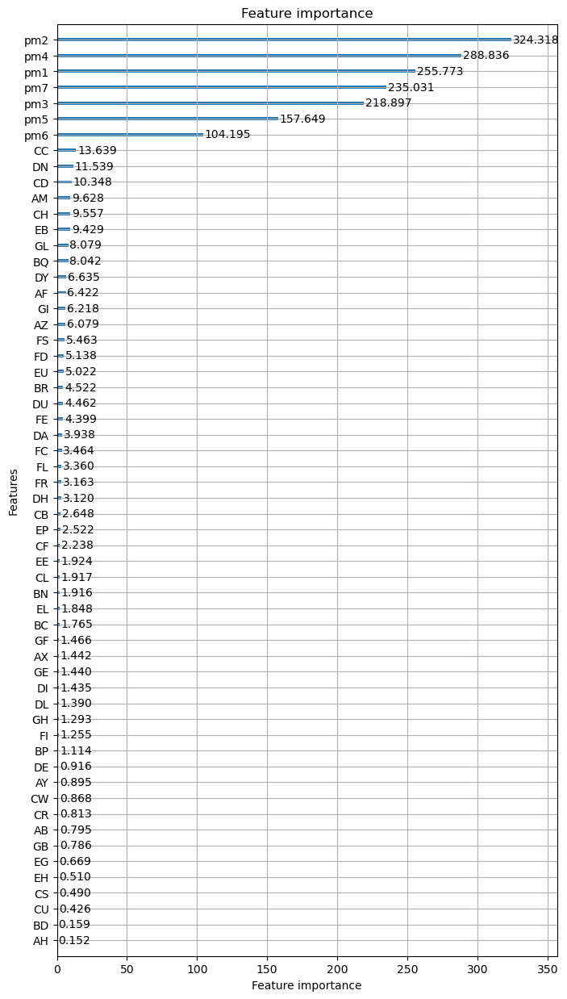

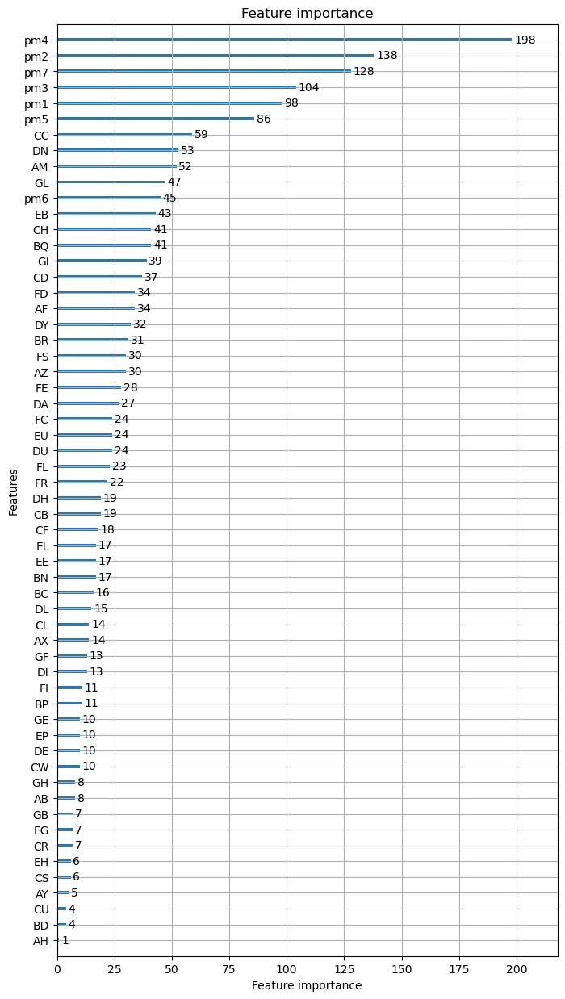

REPEAT NUMBER: 8/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.570154


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.432496
[300]	valid_0's balanced_logloss: 0.361754
[400]	valid_0's balanced_logloss: 0.32136
[500]	valid_0's balanced_logloss: 0.300938
[600]	valid_0's balanced_logloss: 0.289908
[700]	valid_0's balanced_logloss: 0.287521
[800]	valid_0's balanced_logloss: 0.285887
[900]	valid_0's balanced_logloss: 0.286207
[1000]	valid_0's balanced_logloss: 0.287863
[1100]	valid_0's balanced_logloss: 0.291456
[1200]	valid_0's balanced_logloss: 0.295711
[1300]	valid_0's balanced_logloss: 0.300057
[1400]	valid_0's balanced_logloss: 0.30361


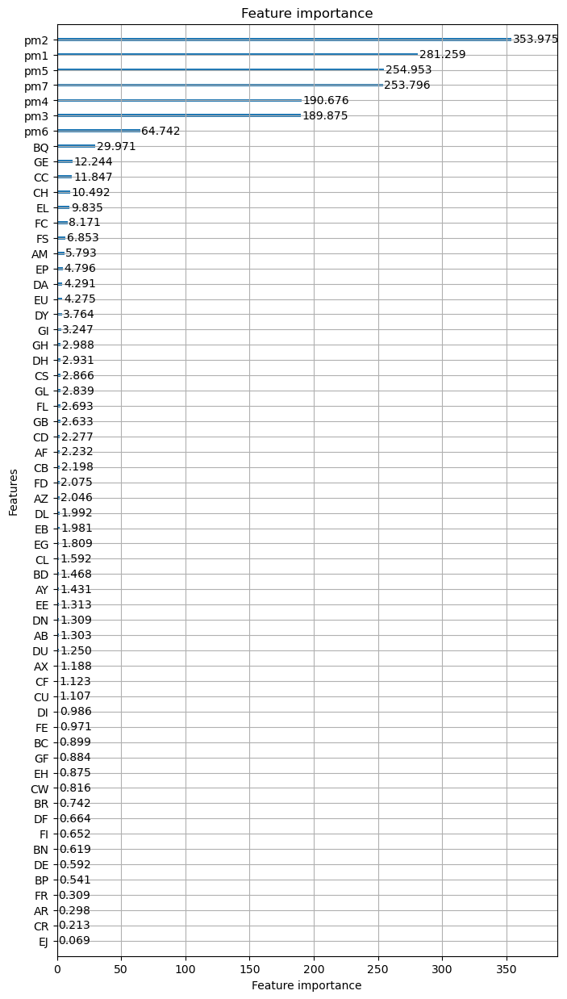

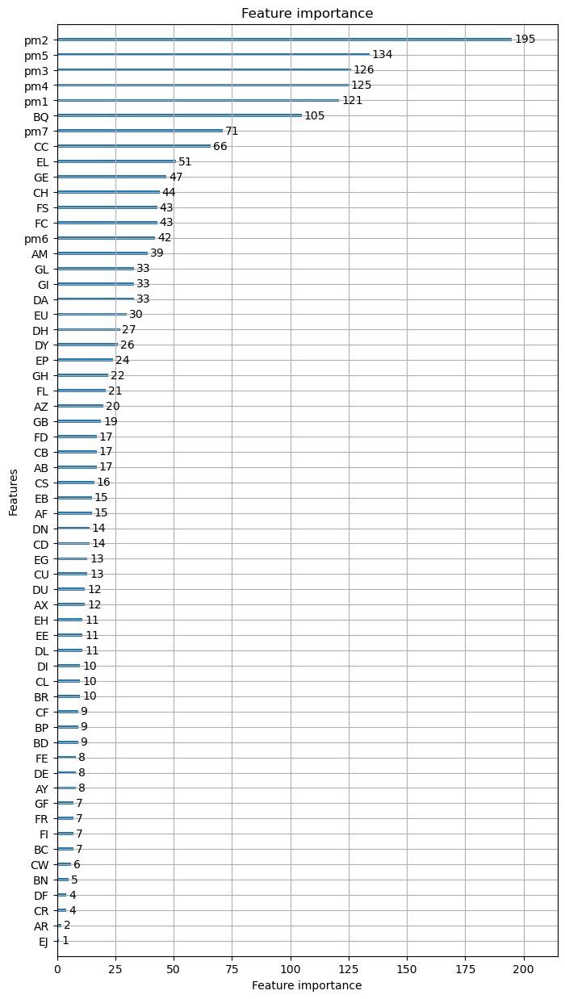

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.540999


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.383217
[300]	valid_0's balanced_logloss: 0.301063
[400]	valid_0's balanced_logloss: 0.248442
[500]	valid_0's balanced_logloss: 0.218818
[600]	valid_0's balanced_logloss: 0.200602
[700]	valid_0's balanced_logloss: 0.187944
[800]	valid_0's balanced_logloss: 0.181518
[900]	valid_0's balanced_logloss: 0.17691
[1000]	valid_0's balanced_logloss: 0.172317
[1100]	valid_0's balanced_logloss: 0.170841
[1200]	valid_0's balanced_logloss: 0.170063
[1300]	valid_0's balanced_logloss: 0.168784
[1400]	valid_0's balanced_logloss: 0.166765


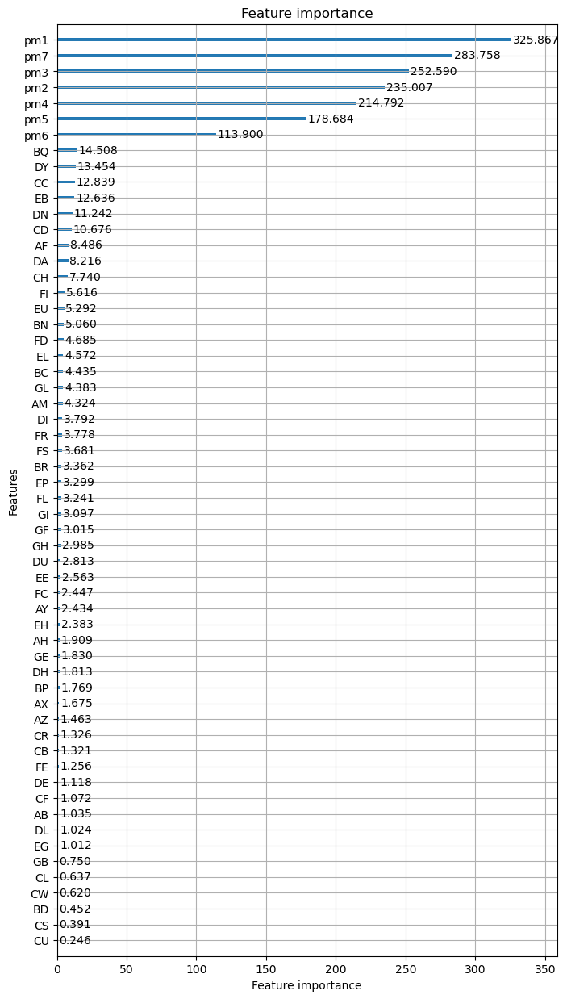

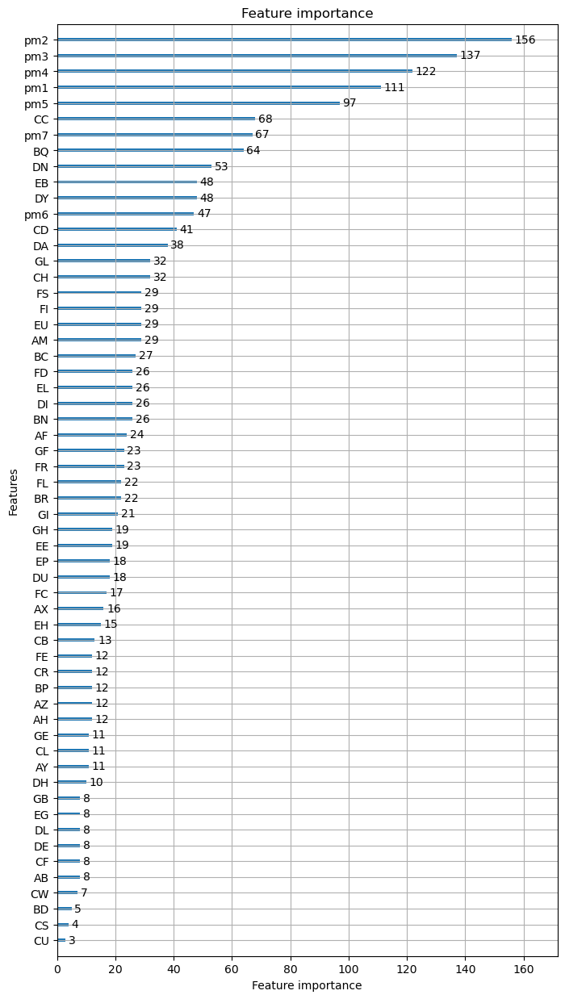

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.558683


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.415899
[300]	valid_0's balanced_logloss: 0.348967
[400]	valid_0's balanced_logloss: 0.308584
[500]	valid_0's balanced_logloss: 0.28797
[600]	valid_0's balanced_logloss: 0.276986
[700]	valid_0's balanced_logloss: 0.269155
[800]	valid_0's balanced_logloss: 0.266481
[900]	valid_0's balanced_logloss: 0.26271
[1000]	valid_0's balanced_logloss: 0.262378
[1100]	valid_0's balanced_logloss: 0.263156
[1200]	valid_0's balanced_logloss: 0.262528
[1300]	valid_0's balanced_logloss: 0.261973
[1400]	valid_0's balanced_logloss: 0.263711


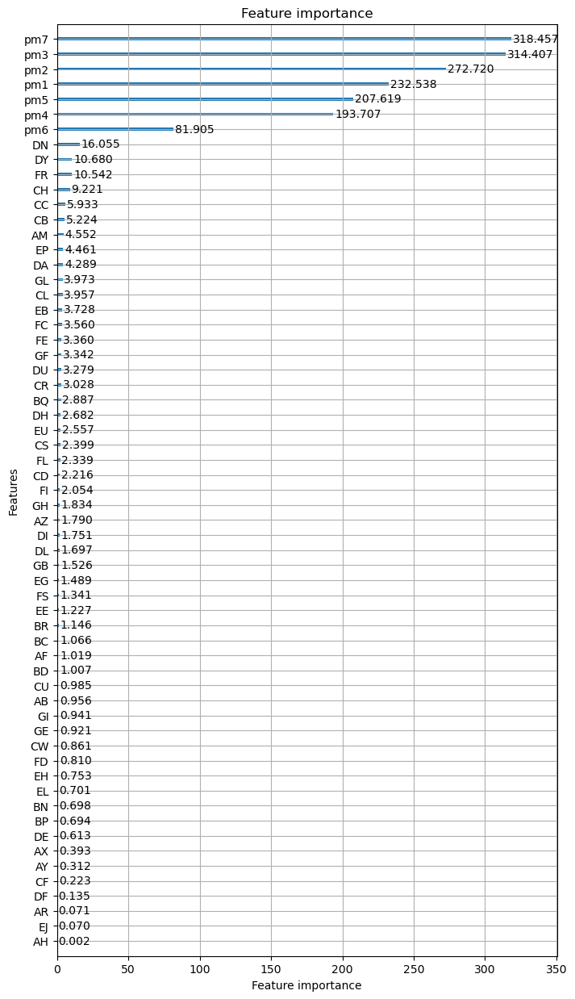

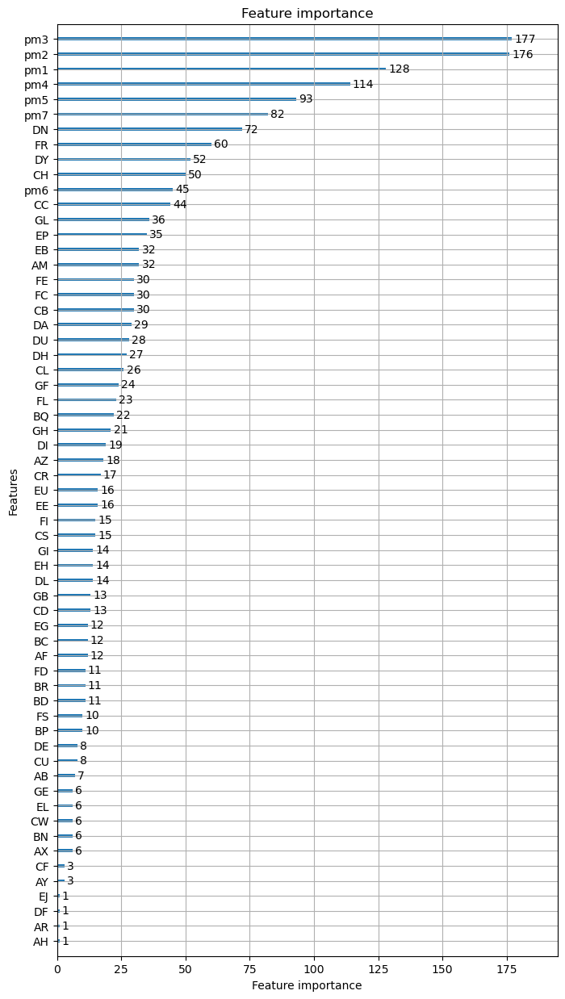

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.536647


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.385447
[300]	valid_0's balanced_logloss: 0.303134
[400]	valid_0's balanced_logloss: 0.258027
[500]	valid_0's balanced_logloss: 0.230004
[600]	valid_0's balanced_logloss: 0.211081
[700]	valid_0's balanced_logloss: 0.199787
[800]	valid_0's balanced_logloss: 0.191915
[900]	valid_0's balanced_logloss: 0.187007
[1000]	valid_0's balanced_logloss: 0.1852
[1100]	valid_0's balanced_logloss: 0.181458
[1200]	valid_0's balanced_logloss: 0.179905
[1300]	valid_0's balanced_logloss: 0.17645
[1400]	valid_0's balanced_logloss: 0.176107


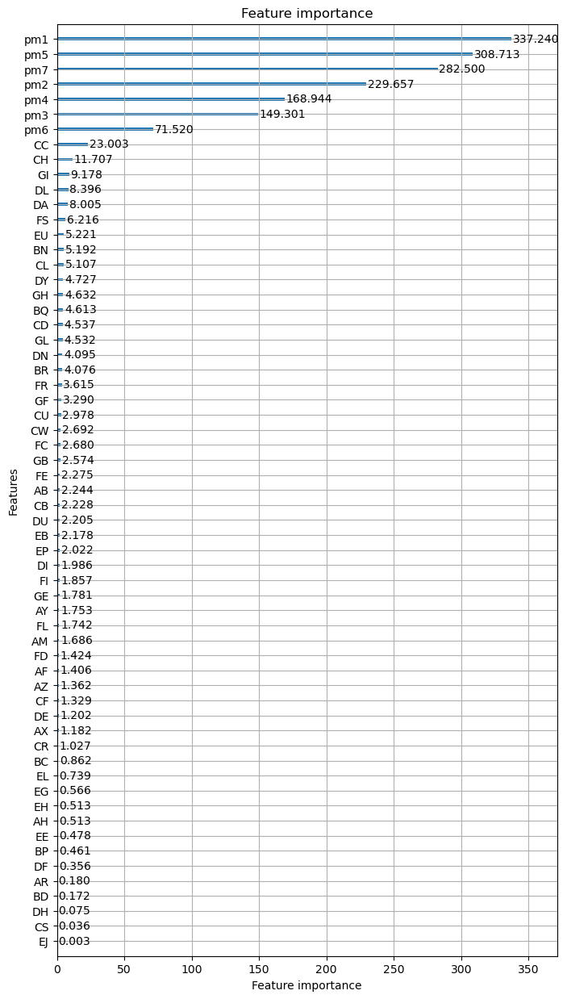

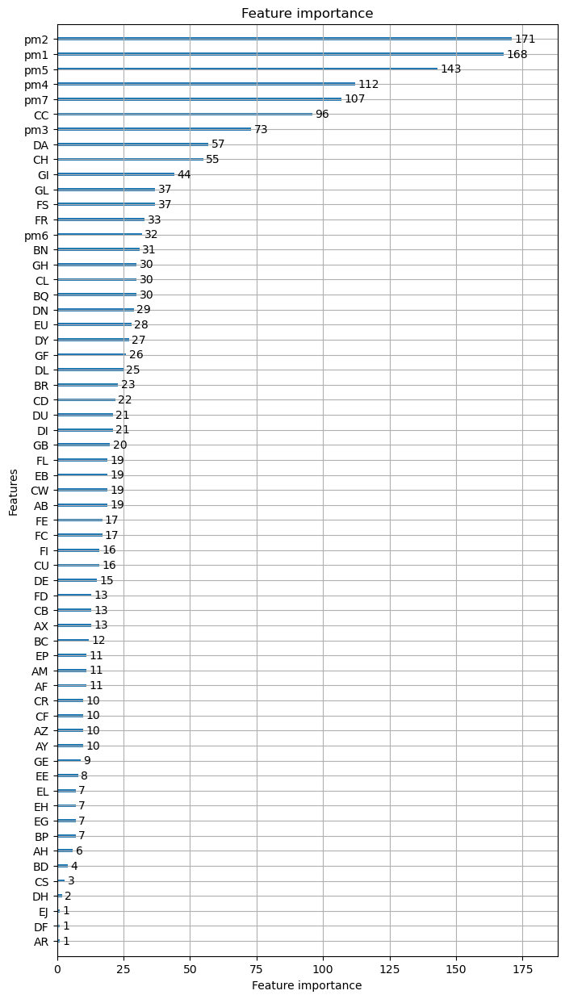

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.548366


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.396656
[300]	valid_0's balanced_logloss: 0.31786
[400]	valid_0's balanced_logloss: 0.268862
[500]	valid_0's balanced_logloss: 0.240413
[600]	valid_0's balanced_logloss: 0.219914
[700]	valid_0's balanced_logloss: 0.208275
[800]	valid_0's balanced_logloss: 0.200775
[900]	valid_0's balanced_logloss: 0.195746
[1000]	valid_0's balanced_logloss: 0.193225
[1100]	valid_0's balanced_logloss: 0.191433
[1200]	valid_0's balanced_logloss: 0.189955
[1300]	valid_0's balanced_logloss: 0.189274
[1400]	valid_0's balanced_logloss: 0.188098


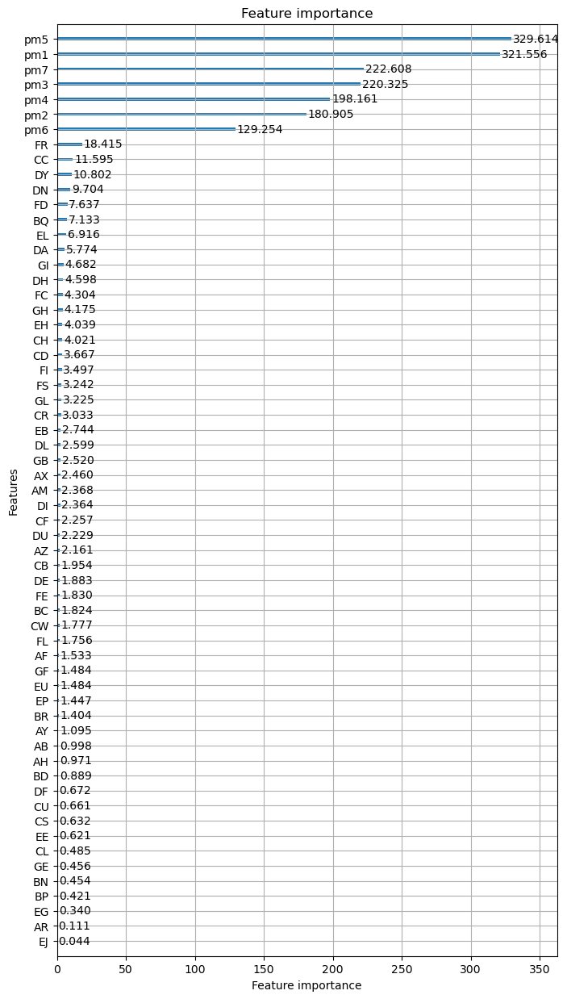

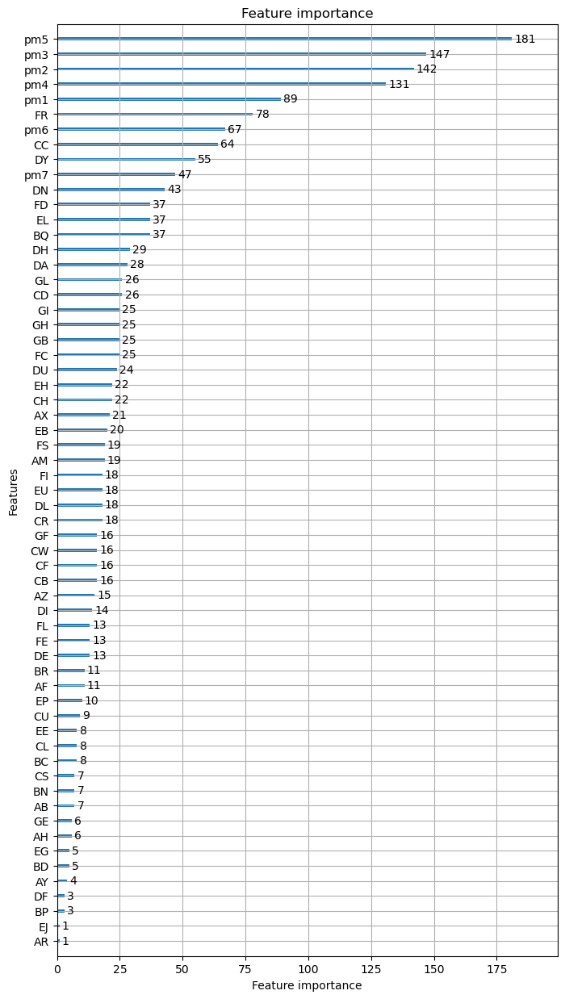

REPEAT NUMBER: 9/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.533307


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.376525
[300]	valid_0's balanced_logloss: 0.298823
[400]	valid_0's balanced_logloss: 0.248574
[500]	valid_0's balanced_logloss: 0.222943
[600]	valid_0's balanced_logloss: 0.206583
[700]	valid_0's balanced_logloss: 0.200273
[800]	valid_0's balanced_logloss: 0.193708
[900]	valid_0's balanced_logloss: 0.189174
[1000]	valid_0's balanced_logloss: 0.187228
[1100]	valid_0's balanced_logloss: 0.186523
[1200]	valid_0's balanced_logloss: 0.185648
[1300]	valid_0's balanced_logloss: 0.185423
[1400]	valid_0's balanced_logloss: 0.1871


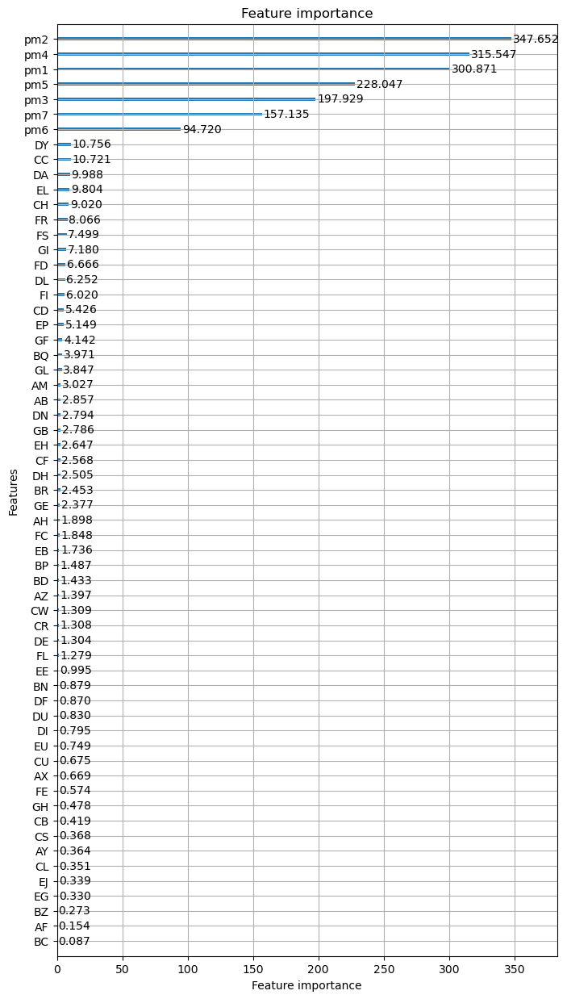

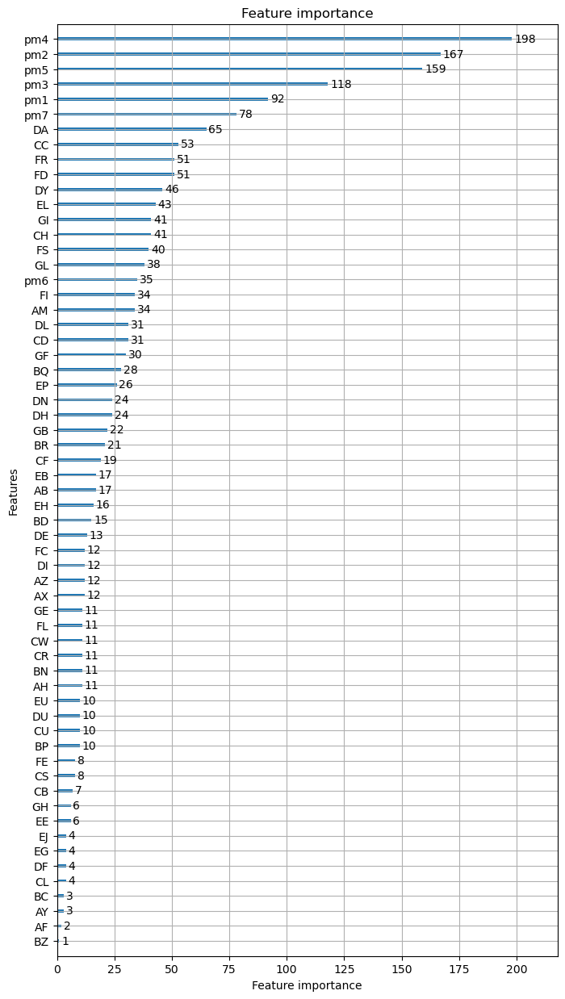

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.515907


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.355385
[300]	valid_0's balanced_logloss: 0.270071
[400]	valid_0's balanced_logloss: 0.218618
[500]	valid_0's balanced_logloss: 0.191517
[600]	valid_0's balanced_logloss: 0.173817
[700]	valid_0's balanced_logloss: 0.162041
[800]	valid_0's balanced_logloss: 0.154894
[900]	valid_0's balanced_logloss: 0.149377
[1000]	valid_0's balanced_logloss: 0.145428
[1100]	valid_0's balanced_logloss: 0.140948
[1200]	valid_0's balanced_logloss: 0.136225
[1300]	valid_0's balanced_logloss: 0.133734
[1400]	valid_0's balanced_logloss: 0.13026


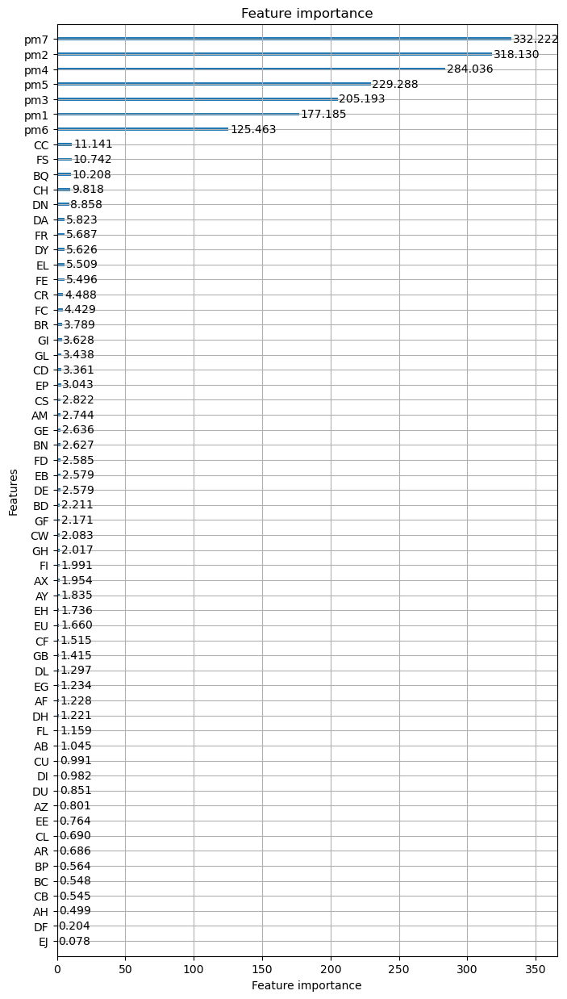

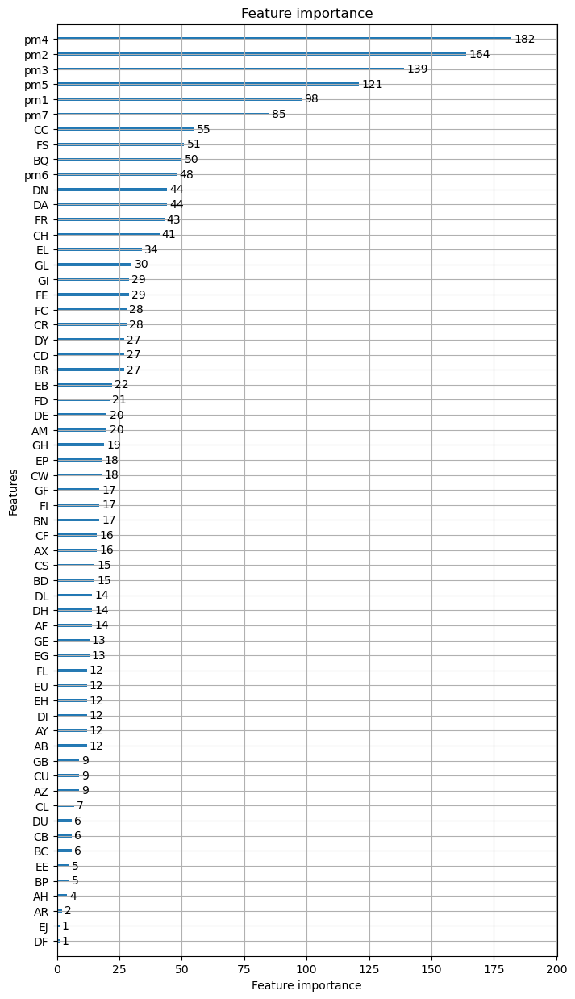

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.578299


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.424923
[300]	valid_0's balanced_logloss: 0.341998
[400]	valid_0's balanced_logloss: 0.294096
[500]	valid_0's balanced_logloss: 0.267565
[600]	valid_0's balanced_logloss: 0.252821
[700]	valid_0's balanced_logloss: 0.242848
[800]	valid_0's balanced_logloss: 0.237854
[900]	valid_0's balanced_logloss: 0.234749
[1000]	valid_0's balanced_logloss: 0.232428
[1100]	valid_0's balanced_logloss: 0.232079
[1200]	valid_0's balanced_logloss: 0.23079
[1300]	valid_0's balanced_logloss: 0.230417
[1400]	valid_0's balanced_logloss: 0.23142


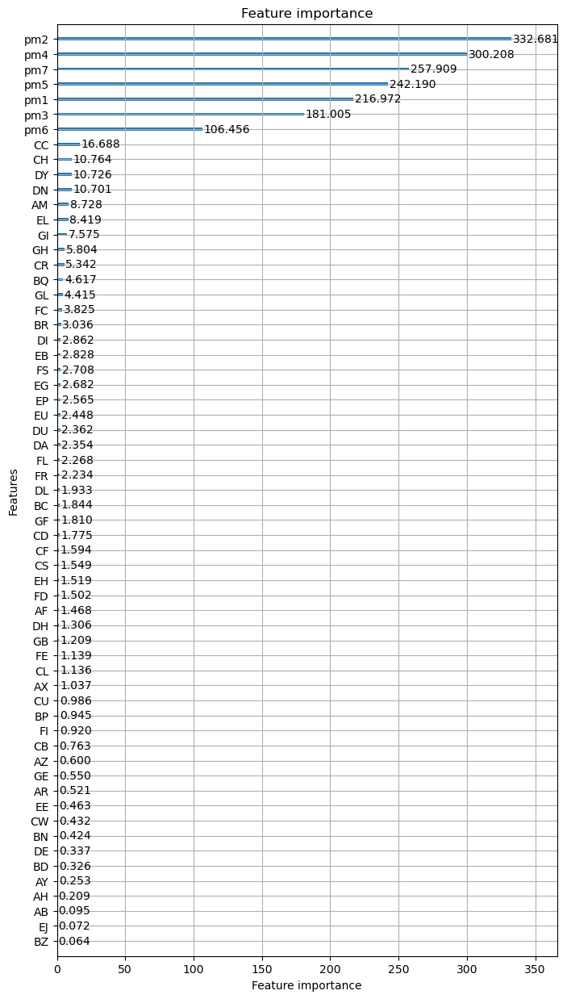

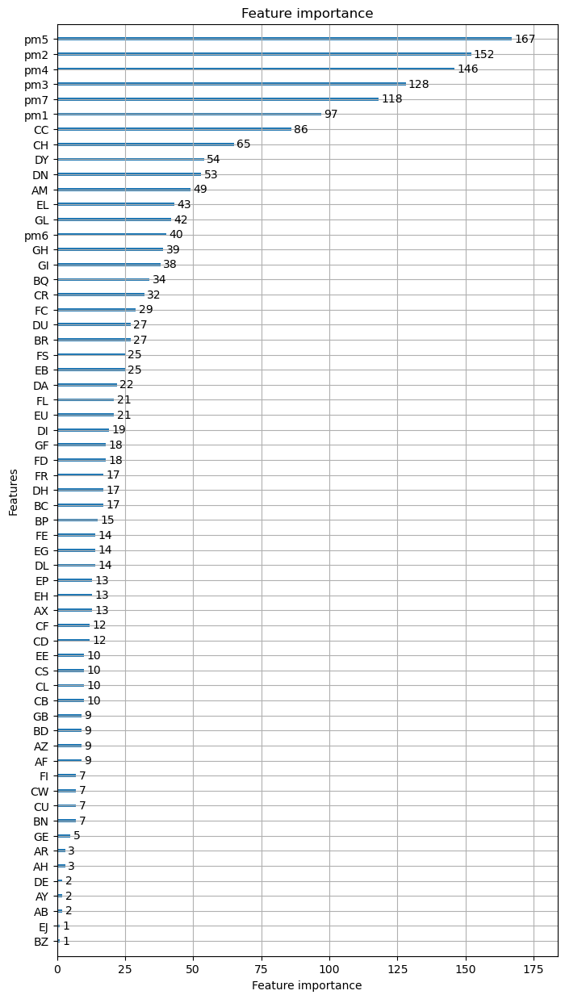

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.550863


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.39855
[300]	valid_0's balanced_logloss: 0.320752
[400]	valid_0's balanced_logloss: 0.273548
[500]	valid_0's balanced_logloss: 0.249948
[600]	valid_0's balanced_logloss: 0.234813
[700]	valid_0's balanced_logloss: 0.226783
[800]	valid_0's balanced_logloss: 0.223039
[900]	valid_0's balanced_logloss: 0.219084
[1000]	valid_0's balanced_logloss: 0.217827
[1100]	valid_0's balanced_logloss: 0.217365
[1200]	valid_0's balanced_logloss: 0.216774
[1300]	valid_0's balanced_logloss: 0.216764
[1400]	valid_0's balanced_logloss: 0.217777


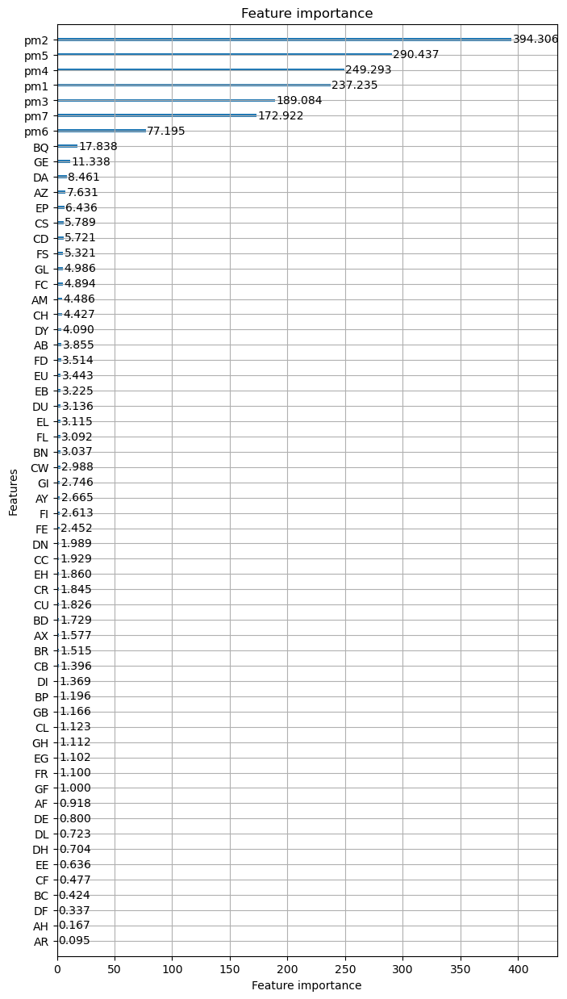

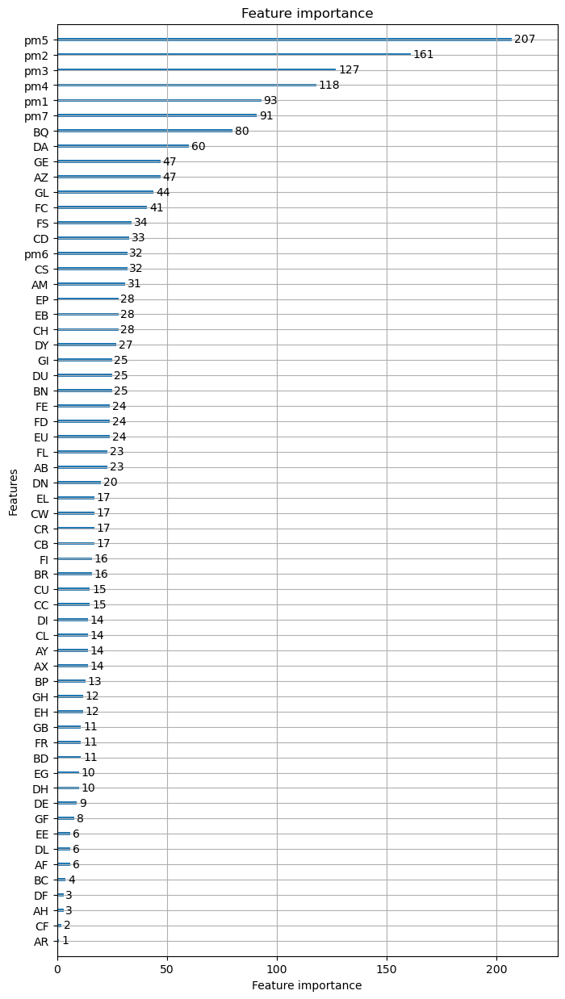

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.535147


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.382089
[300]	valid_0's balanced_logloss: 0.307446
[400]	valid_0's balanced_logloss: 0.265978
[500]	valid_0's balanced_logloss: 0.247121
[600]	valid_0's balanced_logloss: 0.237567
[700]	valid_0's balanced_logloss: 0.233848
[800]	valid_0's balanced_logloss: 0.231616
[900]	valid_0's balanced_logloss: 0.229335
[1000]	valid_0's balanced_logloss: 0.227768
[1100]	valid_0's balanced_logloss: 0.228298
[1200]	valid_0's balanced_logloss: 0.229551
[1300]	valid_0's balanced_logloss: 0.228961
[1400]	valid_0's balanced_logloss: 0.227597


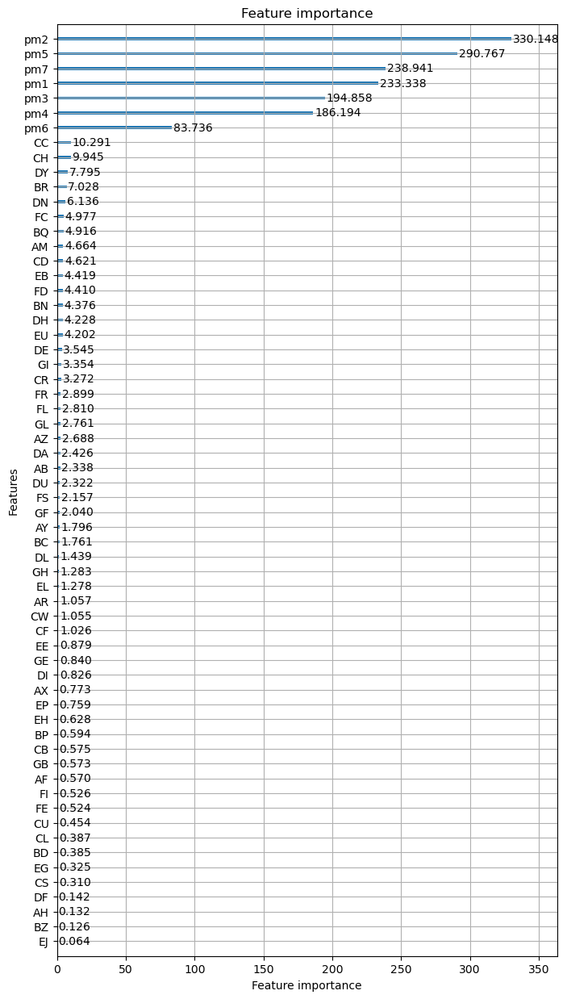

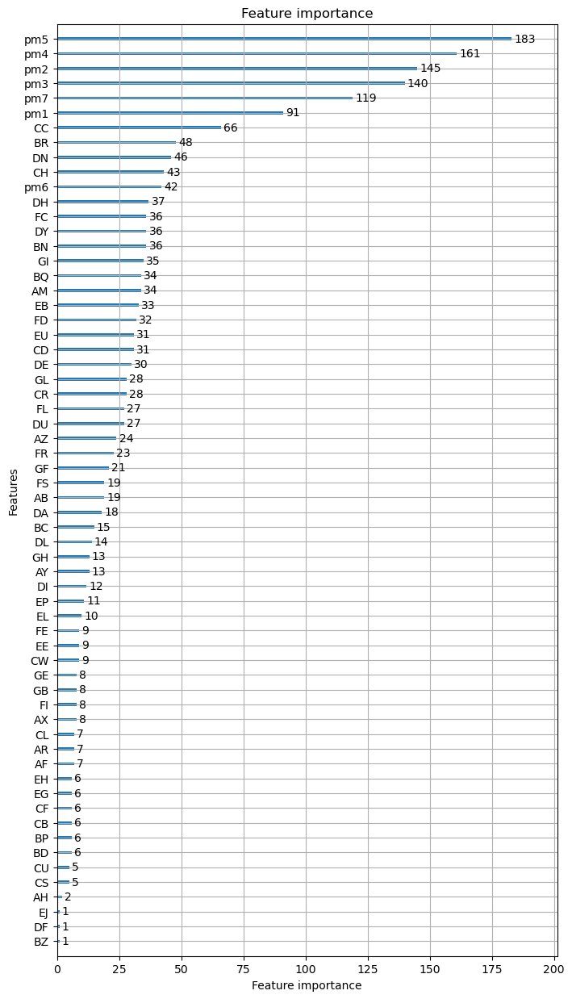

REPEAT NUMBER: 10/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.517402


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.367271
[300]	valid_0's balanced_logloss: 0.282842
[400]	valid_0's balanced_logloss: 0.23002
[500]	valid_0's balanced_logloss: 0.195064
[600]	valid_0's balanced_logloss: 0.172572
[700]	valid_0's balanced_logloss: 0.160762
[800]	valid_0's balanced_logloss: 0.15235
[900]	valid_0's balanced_logloss: 0.147799
[1000]	valid_0's balanced_logloss: 0.143325
[1100]	valid_0's balanced_logloss: 0.138991
[1200]	valid_0's balanced_logloss: 0.137101
[1300]	valid_0's balanced_logloss: 0.136037
[1400]	valid_0's balanced_logloss: 0.134132


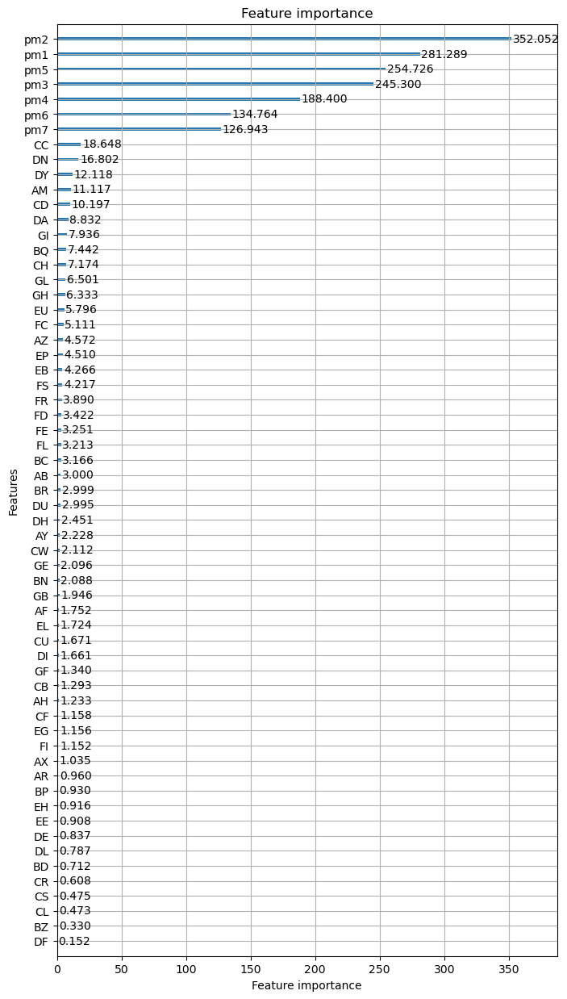

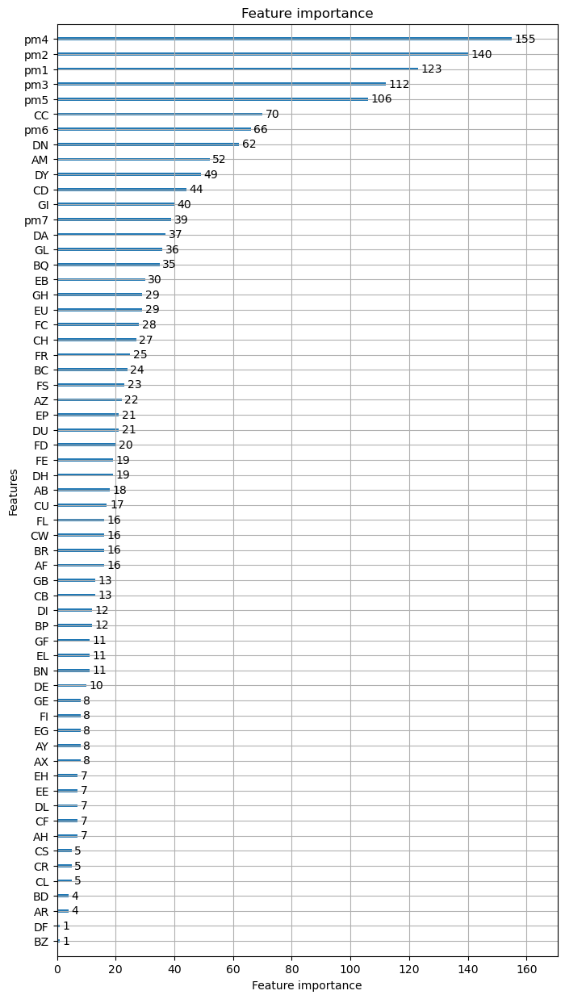

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.600273


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.459082
[300]	valid_0's balanced_logloss: 0.39164
[400]	valid_0's balanced_logloss: 0.355337
[500]	valid_0's balanced_logloss: 0.334248
[600]	valid_0's balanced_logloss: 0.320418
[700]	valid_0's balanced_logloss: 0.315274
[800]	valid_0's balanced_logloss: 0.316197
[900]	valid_0's balanced_logloss: 0.324841
[1000]	valid_0's balanced_logloss: 0.329022
[1100]	valid_0's balanced_logloss: 0.336009
[1200]	valid_0's balanced_logloss: 0.341868
[1300]	valid_0's balanced_logloss: 0.34972
[1400]	valid_0's balanced_logloss: 0.357582


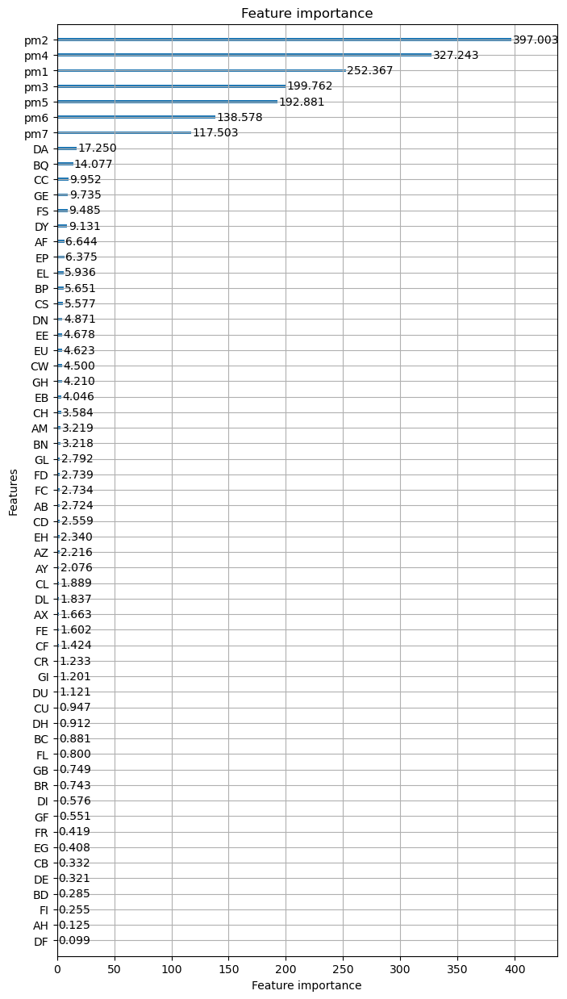

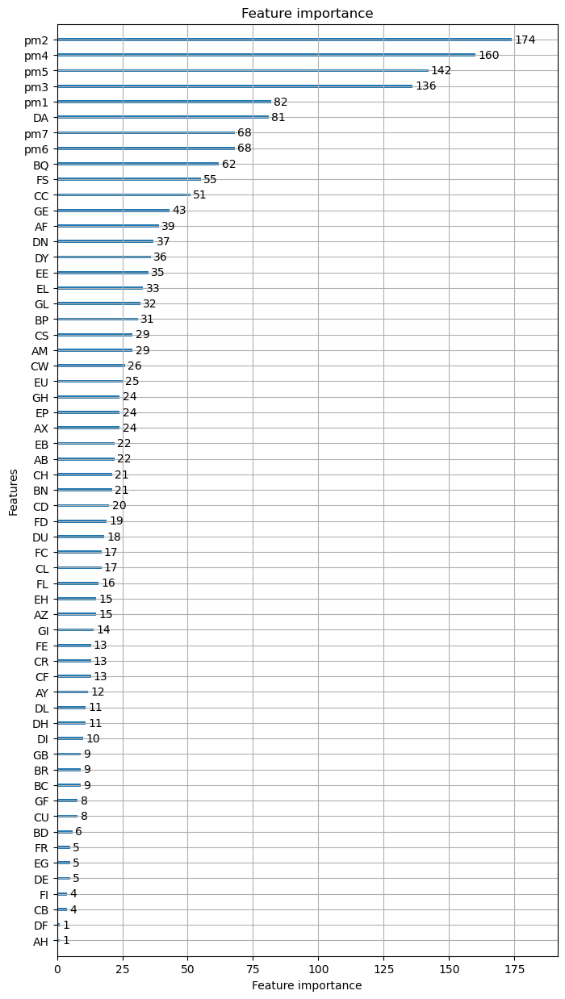

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.557024


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.405068
[300]	valid_0's balanced_logloss: 0.325165
[400]	valid_0's balanced_logloss: 0.26966
[500]	valid_0's balanced_logloss: 0.242646
[600]	valid_0's balanced_logloss: 0.222881
[700]	valid_0's balanced_logloss: 0.212835
[800]	valid_0's balanced_logloss: 0.208598
[900]	valid_0's balanced_logloss: 0.20693
[1000]	valid_0's balanced_logloss: 0.206434
[1100]	valid_0's balanced_logloss: 0.207391
[1200]	valid_0's balanced_logloss: 0.208308
[1300]	valid_0's balanced_logloss: 0.208224
[1400]	valid_0's balanced_logloss: 0.211249


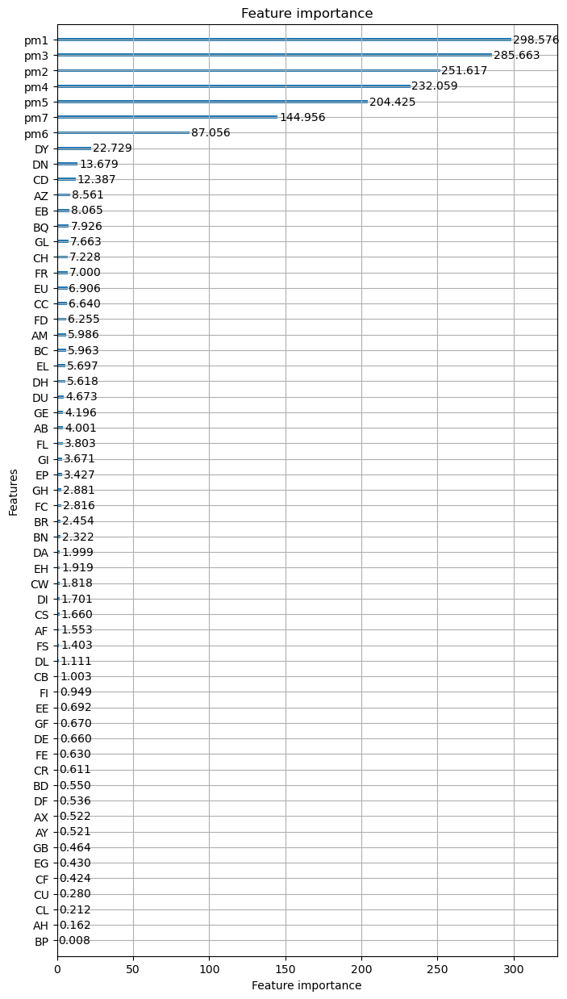

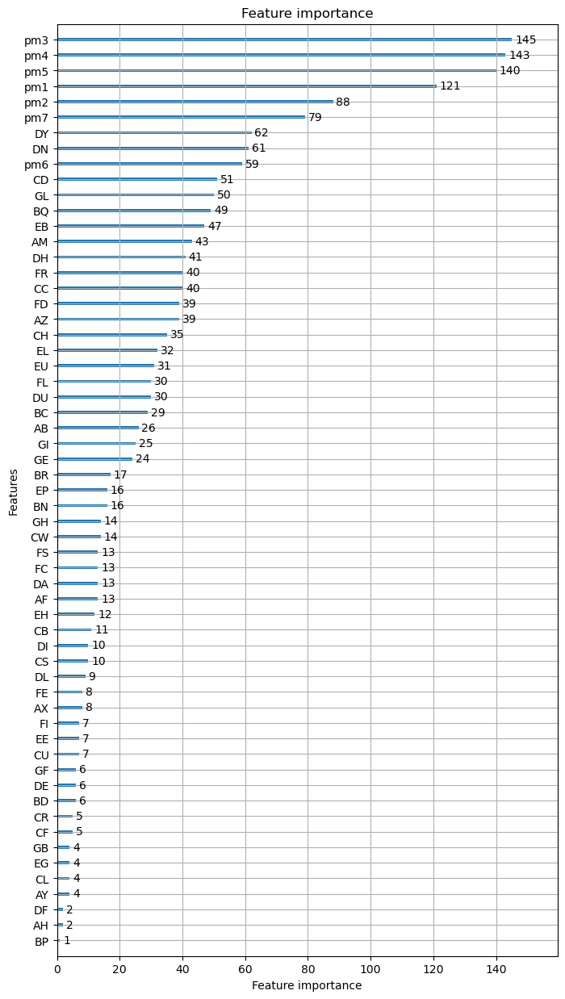

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.56495


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.414281
[300]	valid_0's balanced_logloss: 0.344693
[400]	valid_0's balanced_logloss: 0.301946
[500]	valid_0's balanced_logloss: 0.280795
[600]	valid_0's balanced_logloss: 0.267599
[700]	valid_0's balanced_logloss: 0.260978
[800]	valid_0's balanced_logloss: 0.257031
[900]	valid_0's balanced_logloss: 0.253834
[1000]	valid_0's balanced_logloss: 0.25085
[1100]	valid_0's balanced_logloss: 0.250832
[1200]	valid_0's balanced_logloss: 0.251819
[1300]	valid_0's balanced_logloss: 0.250505
[1400]	valid_0's balanced_logloss: 0.249741


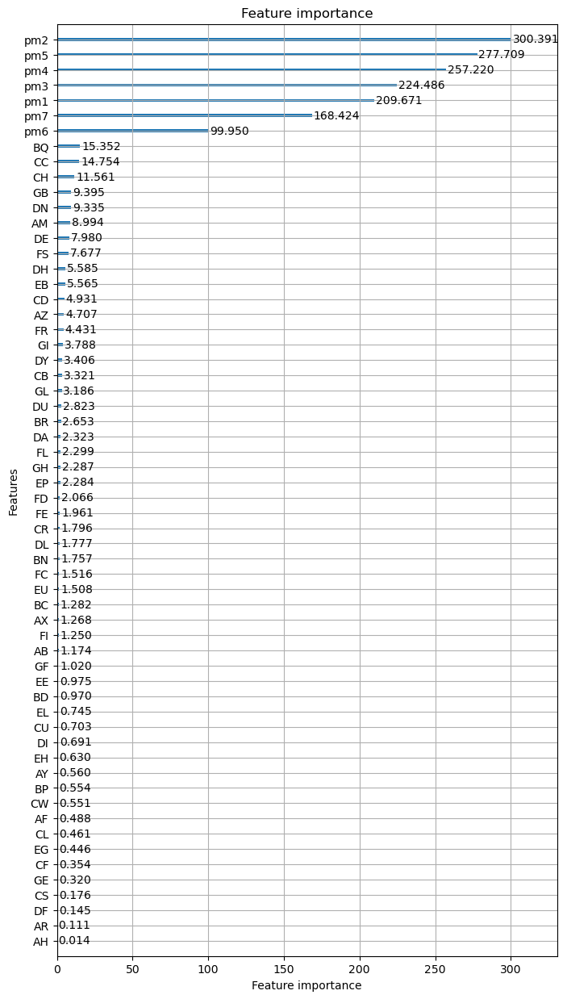

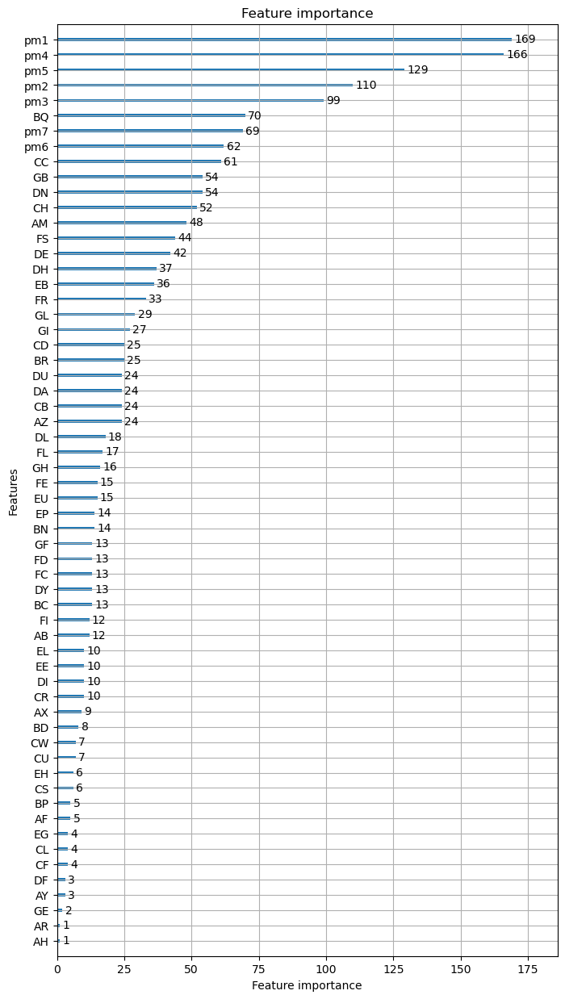

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.55553


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.425161
[300]	valid_0's balanced_logloss: 0.367078
[400]	valid_0's balanced_logloss: 0.332329
[500]	valid_0's balanced_logloss: 0.314094
[600]	valid_0's balanced_logloss: 0.305993
[700]	valid_0's balanced_logloss: 0.300769
[800]	valid_0's balanced_logloss: 0.295869
[900]	valid_0's balanced_logloss: 0.294994
[1000]	valid_0's balanced_logloss: 0.294777
[1100]	valid_0's balanced_logloss: 0.297123
[1200]	valid_0's balanced_logloss: 0.301561
[1300]	valid_0's balanced_logloss: 0.303279
[1400]	valid_0's balanced_logloss: 0.305453


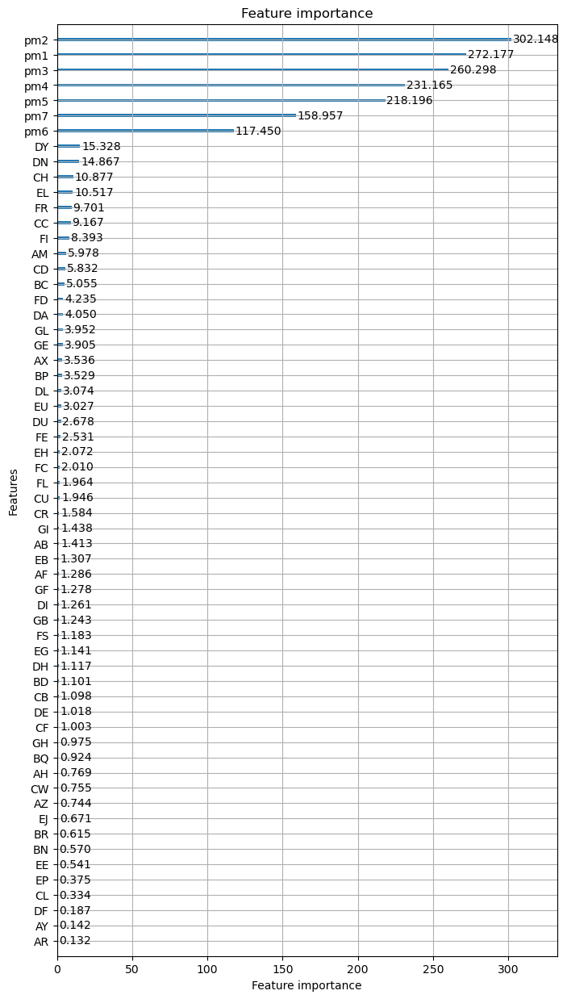

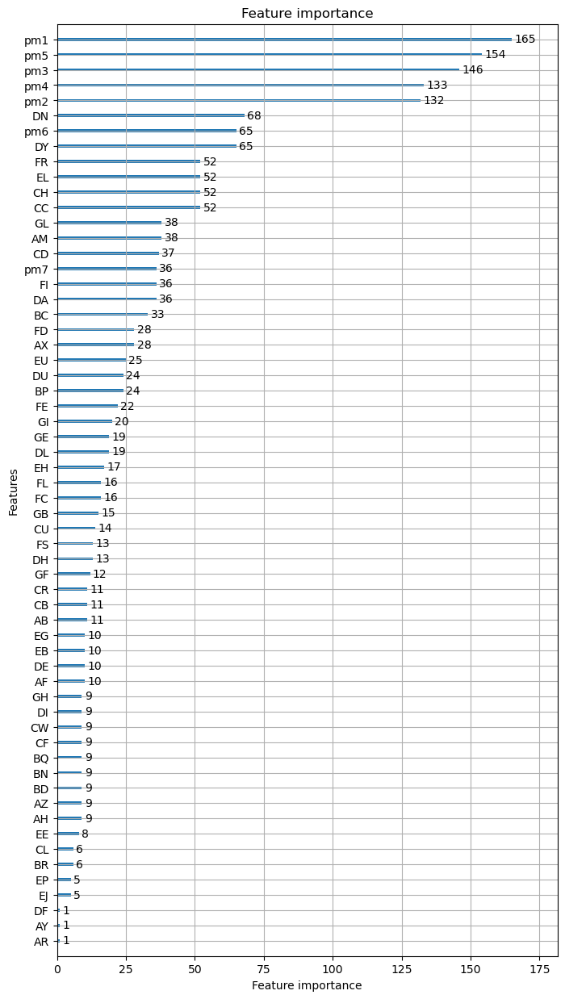

In [40]:
VERBOSE = True

models = list()
metrics = list()
oof_dfs = list()

for repeat in range(REPETITIONS):
    print(f"REPEAT NUMBER: {repeat+1}/{REPETITIONS}")
    cv_split = repeated_cv_split[f"repeat_{repeat}"]
    n_folds = len(cv_split)
    
    oof = train[["Id","Class"]].copy()
    oof["pred_proba"] = np.nan
    
    for split in cv_split:
        fold = split["fold"]
        train_idx = split["train_idx"]
        valid_idx = split["valid_idx"]
        print(f"training model for fold: {fold+1}/{n_folds}")
        
        _train,_input_cols = include_oof_preds(train, input_cols, oof_all, repeat)
    
        train_df = _train.loc[train_idx,:].reset_index(drop=True)
        valid_df = _train.loc[valid_idx,:].reset_index(drop=True)

        train_dset = lgb.Dataset(
            data=train_df.loc[:,_input_cols],
            label=train_df.loc[:,"Class"].values,
            free_raw_data=False
        )
        valid_dset = lgb.Dataset(
            data=valid_df.loc[:,_input_cols],
            label=valid_df.loc[:,"Class"].values,
            free_raw_data=False
        )
        model = lgb.train(
            params=model_params,
            train_set=train_dset,
            valid_sets=[valid_dset,],
            feval=[balanced_logloss],
            callbacks=[lgb.log_evaluation(period=100),],
        )
        
        if VERBOSE:
            lgb.plot_importance(model, importance_type="gain", figsize=(8,15))
            plt.show()
            lgb.plot_importance(model, importance_type="split", figsize=(8,15))
            plt.show()
            
        y_pred = model.predict(valid_df.loc[:,_input_cols])
        valid_loss = balanced_logloss_(y_pred, valid_df.loc[:,"Class"].values)
        oof.loc[valid_idx, "pred_proba"] = y_pred
        
        models.append(model)
        metrics.append(valid_loss)
                
    oof_dfs.append(oof)

***
## OOF analysis and calibration


In [41]:
compute_overall_metric(oof_dfs)

0.2252774914444402

In [42]:
oof_scores = oof_dfs[0].copy()
oof_scores.rename({"pred_proba":"pred_proba0"}, axis=1, inplace=True)

for i in range(1, len(oof_dfs)):
    _df = oof_dfs[i].copy()
    _df.rename({"pred_proba":f"pred_proba{i}"}, axis=1, inplace=True)
    oof_scores = oof_scores.merge(_df, on=["Id","Class"])
    
oof_scores["avg_proba"] = oof_scores.iloc[:,2:].mean(axis=1)
oof_scores

,Id,Class,pred_proba0,pred_proba1,pred_proba2,pred_proba3,pred_proba4,pred_proba5,pred_proba6,pred_proba7,pred_proba8,pred_proba9,avg_proba
0,000ff2bfdfe9,1,0.932048,0.972220,0.959379,0.959399,0.951169,0.958847,0.965341,0.946914,0.970723,0.961137,0.957718
1,007255e47698,0,0.023135,0.032519,0.027376,0.026569,0.030480,0.014334,0.038451,0.021173,0.035613,0.019804,0.026945
2,013f2bd269f5,0,0.274781,0.343381,0.143856,0.492315,0.119074,0.194725,0.200594,0.052835,0.279615,0.148745,0.224992
3,043ac50845d5,0,0.056602,0.039355,0.022560,0.092203,0.064394,0.082949,0.082134,0.029091,0.031159,0.087829,0.058828
4,044fb8a146ec,1,0.789831,0.958390,0.861587,0.736275,0.952585,0.848591,0.799672,0.918302,0.761349,0.830041,0.845662
...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,fd3dafe738fd,0,0.031596,0.019125,0.067224,0.030001,0.026207,0.042380,0.034519,0.033130,0.028546,0.015525,0.032825
613,fd895603f071,0,0.062627,0.015941,0.122836,0.097705,0.061903,0.014710,0.022316,0.061537,0.038186,0.056527,0.055429
614,fd8ef6377f76,0,0.019705,0.050086,0.018943,0.035557,0.024469,0.029884,0.028318,0.021434,0.015094,0.036881,0.028037
615,fe1942975e40,0,0.022065,0.024153,0.029204,0.055374,0.015093,0.012159,0.033809,0.041762,0.022616,0.046148,0.030238


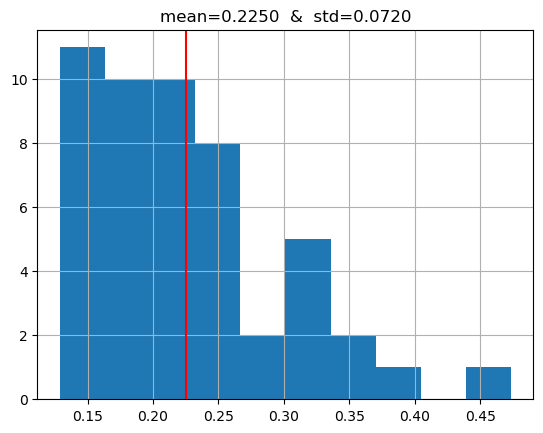

In [43]:
_metrics = metrics[:50]

metric_mean = np.mean(_metrics)
metric_median = np.median(_metrics)
metric_std = np.std(_metrics)

plt.hist(_metrics, bins=10)
plt.axvline(metric_mean, c="r")
plt.title(f"mean={metric_mean:0.4f}  &  std={metric_std:0.4f}")
plt.grid()
plt.show()

In [44]:
calib_params = optimize_calibration(oof_dfs)

best_value: 0.22299012728928128
best_params: {'alpha': 1.3760891893553415, 'beta': 4.490023027086546, 'gamma': 0.9464612390873611}


####################################################################################################
CV repeat nbr: 1 - metric: 0.2256


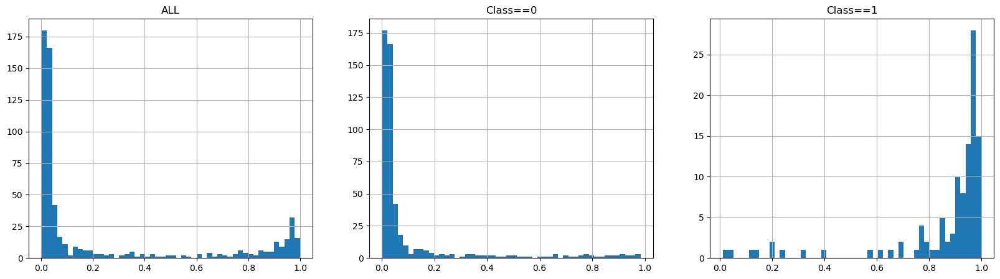

CV repeat nbr: 1 - metric: 0.2226


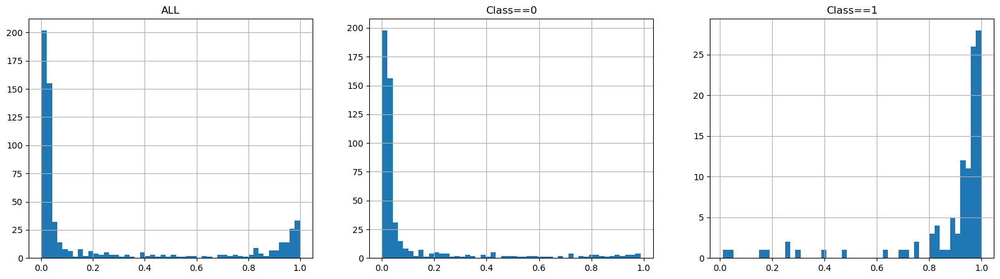

####################################################################################################
CV repeat nbr: 2 - metric: 0.2277


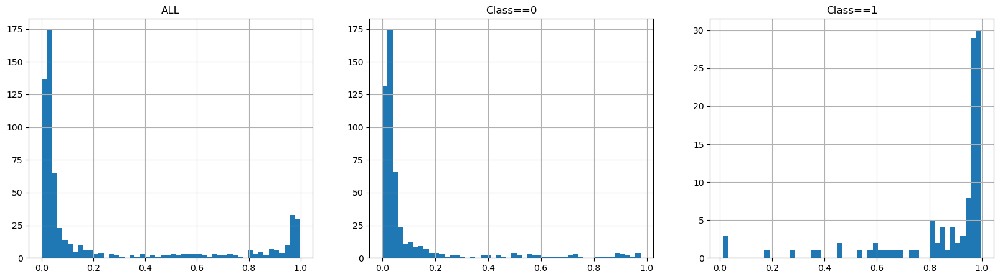

CV repeat nbr: 2 - metric: 0.2250


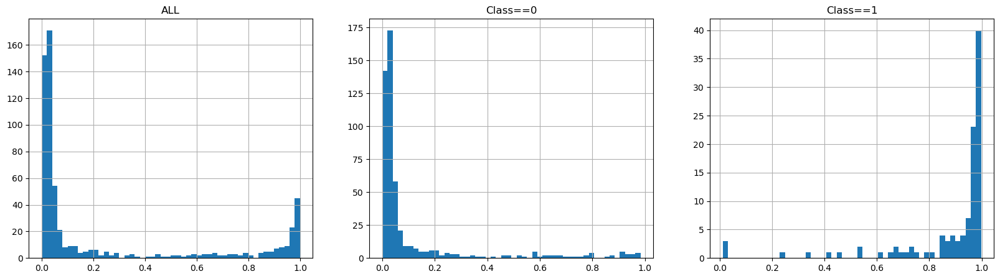

####################################################################################################
CV repeat nbr: 3 - metric: 0.2168


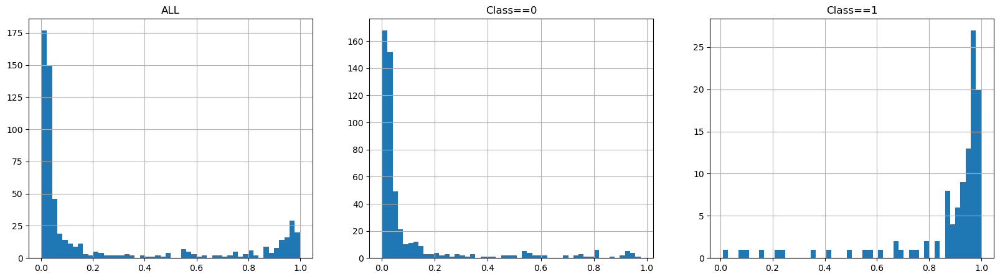

CV repeat nbr: 3 - metric: 0.2151


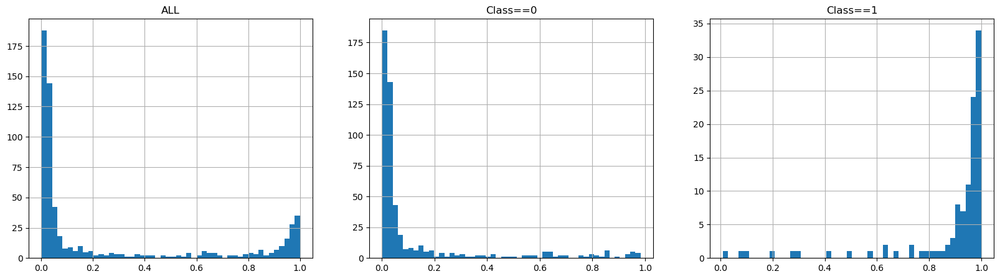

####################################################################################################
CV repeat nbr: 4 - metric: 0.2305


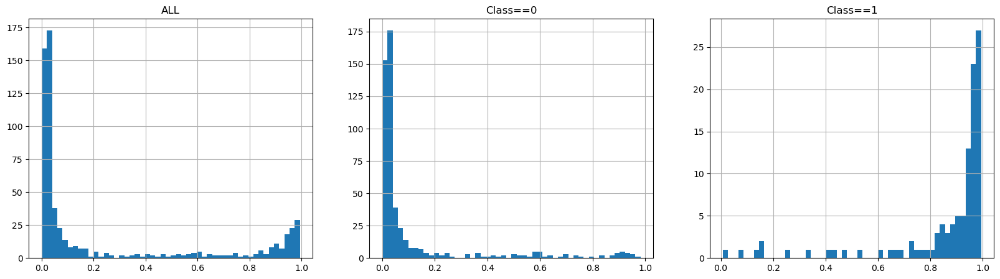

CV repeat nbr: 4 - metric: 0.2281


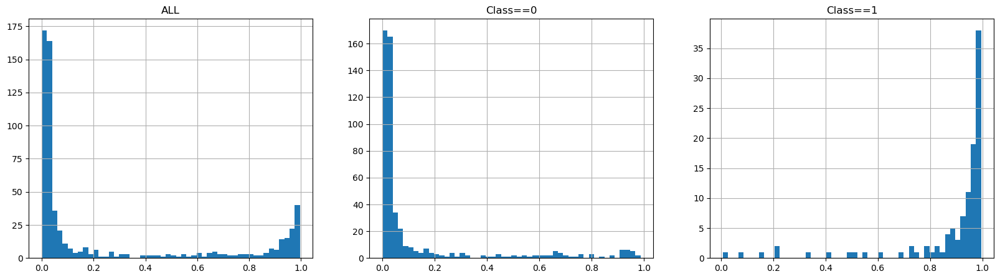

####################################################################################################
CV repeat nbr: 5 - metric: 0.2429


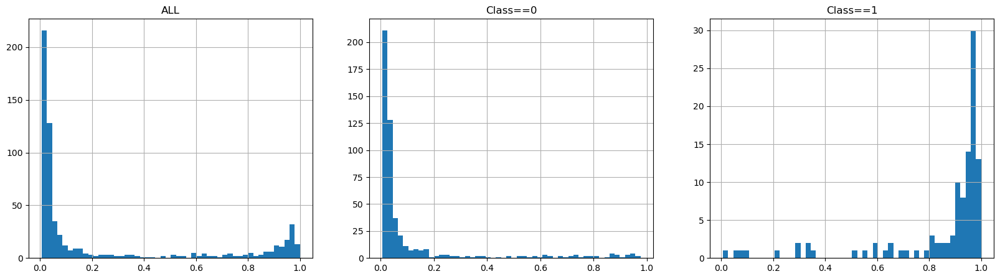

CV repeat nbr: 5 - metric: 0.2405


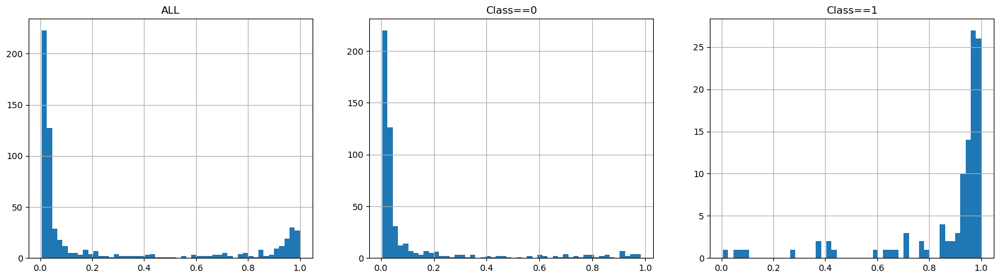

####################################################################################################
CV repeat nbr: 6 - metric: 0.2148


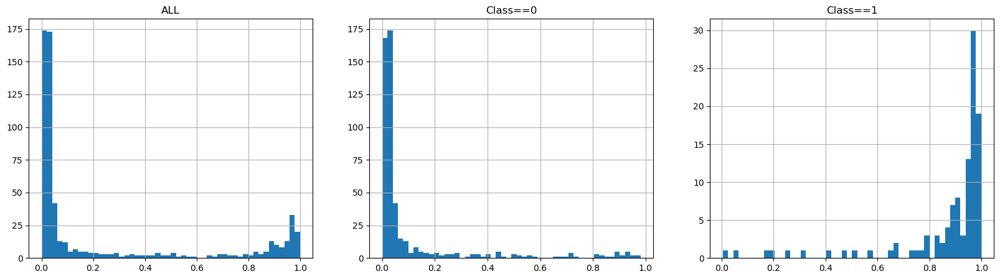

CV repeat nbr: 6 - metric: 0.2128


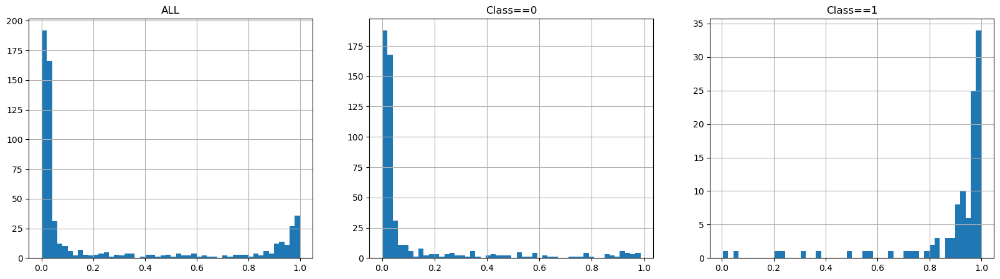

####################################################################################################
CV repeat nbr: 7 - metric: 0.2215


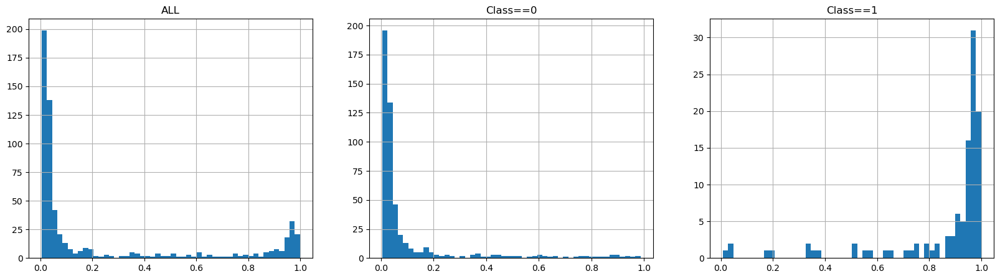

CV repeat nbr: 7 - metric: 0.2194


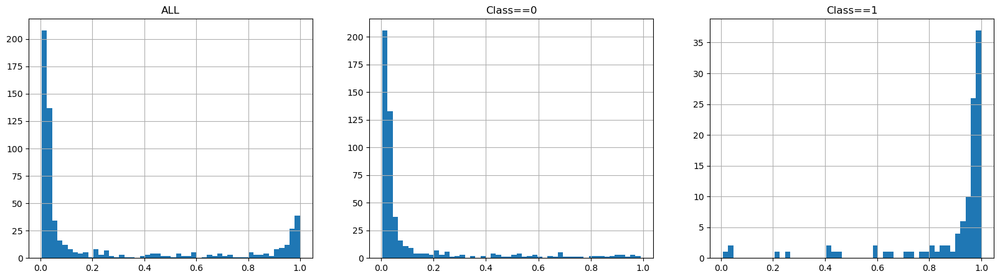

####################################################################################################
CV repeat nbr: 8 - metric: 0.2205


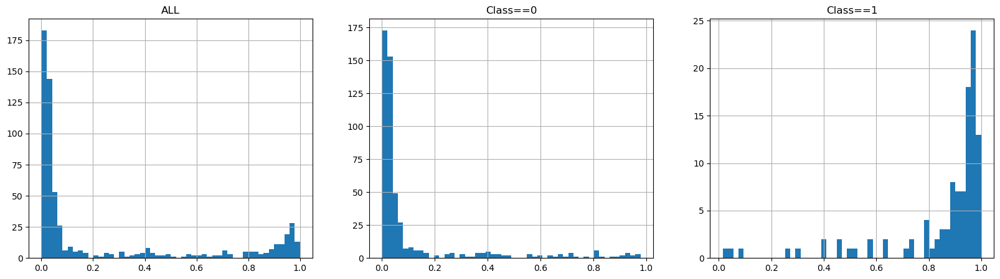

CV repeat nbr: 8 - metric: 0.2180


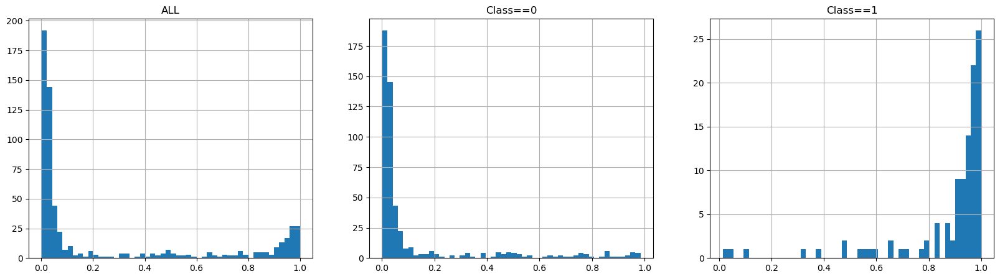

####################################################################################################
CV repeat nbr: 9 - metric: 0.1995


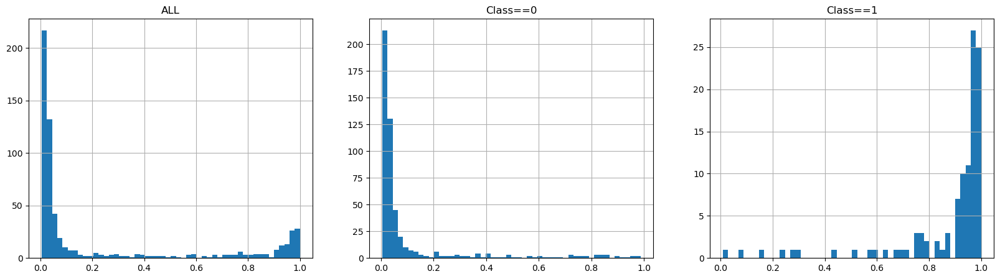

CV repeat nbr: 9 - metric: 0.1972


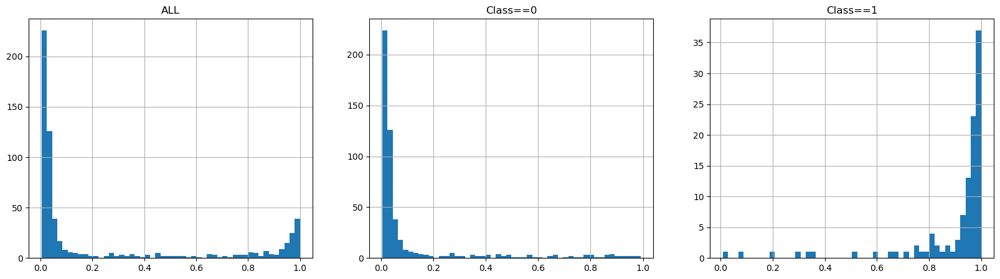

####################################################################################################
CV repeat nbr: 10 - metric: 0.2529


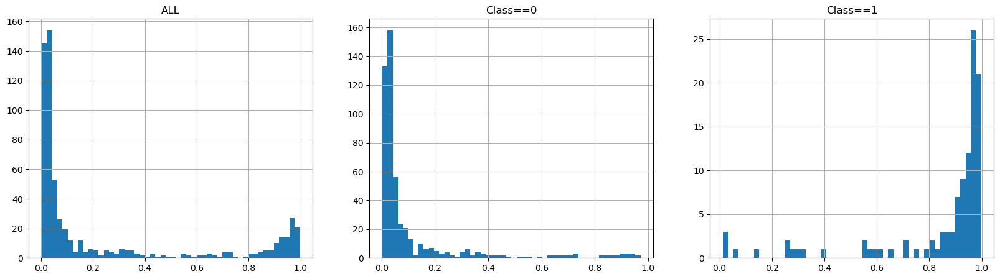

CV repeat nbr: 10 - metric: 0.2511


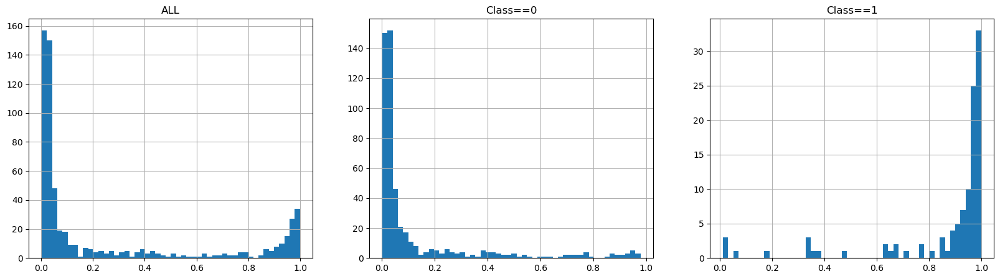

In [45]:
for i,oof in enumerate(oof_dfs):
    print("#"*100)
    oof = oof.copy()
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()
    
    calib_p1 = calibrate_probs(
        oof.pred_proba.values,
        **calib_params
    )
    oof["pred_proba"] = calib_p1
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()


***
# stacking predictions

In [46]:
input_cols = input_cols.tolist().copy()

predicted_probs_all = [
    predicted_probs_m01,
    predicted_probs_m02,
    predicted_probs_m03,
    predicted_probs_m04,
    predicted_probs_m05,
    predicted_probs_m06,
    predicted_probs_m07,
]

for i,proba in enumerate(predicted_probs_all):
    test[f"pm{i+1}"] = proba
    input_cols.append(f"pm{i+1}")

In [47]:
predicted_probs = [model.predict(test[input_cols]) for model in models]
predicted_probs = np.mean(predicted_probs, axis=0)
predicted_probs

array([0.57395592, 0.57395592, 0.57395592, 0.57395592, 0.57395592])

In [48]:
predicted_probs = calibrate_probs(predicted_probs, **calib_params)
predicted_probs = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)
predicted_probs

array([0.64959406, 0.64959406, 0.64959406, 0.64959406, 0.64959406])

In [49]:
sub = pd.read_csv("/kaggle/input/icr-identify-age-related-conditions/sample_submission.csv")
sub["class_0"] = 1-predicted_probs
sub["class_1"] = predicted_probs
sub.to_csv("submission.csv", index=False)
sub.describe()

,class_0,class_1
count,5.000000,5.000000
mean,0.350406,0.649594
std,0.000000,0.000000
min,0.350406,0.649594
25%,0.350406,0.649594
50%,0.350406,0.649594
75%,0.350406,0.649594
max,0.350406,0.649594


***